In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

# --- Load the dataset ---
file_path = "collision_dataset_100000_H2_300K_test.csv"
#file_path = "collision_dataset_100000_H2_Etr_2000_ErA_800_ErB_1200.csv"

# Try space-delimited first; if that fails, fall back to commas
df = pd.read_csv(file_path, sep=",")

# create test set
data = df.sample(frac=1, random_state=42).reset_index(drop=True)  # Shuffle the data
data, data_test = data.iloc[:70000], data.iloc[70000:].reset_index(drop=True)

# --- Basic info ---
print("Columns:", data.columns.tolist())
print("First few rows:")
print(data.head())

Columns: ['b', 'Etr', 'Er1', 'Er2', 'Etrp', 'Er1p', 'Er2p']
First few rows:
          b         Etr          Er1         Er2        Etrp         Er1p  \
0  1.212670  629.167461   260.889613  328.931355  809.386233   174.640723   
1  0.999673  414.123013   512.532747  105.464508  408.114126   518.244469   
2  0.657645   84.785623  1813.982477  246.549662   44.279150  1811.117787   
3  1.452982  451.542898   364.922329  400.922974  451.503756   366.912165   
4  1.082590  170.922921    58.828205  959.515353  223.728202   120.909418   

         Er2p  
0  234.893191  
1  105.684332  
2  289.855215  
3  398.915932  
4  844.554020  


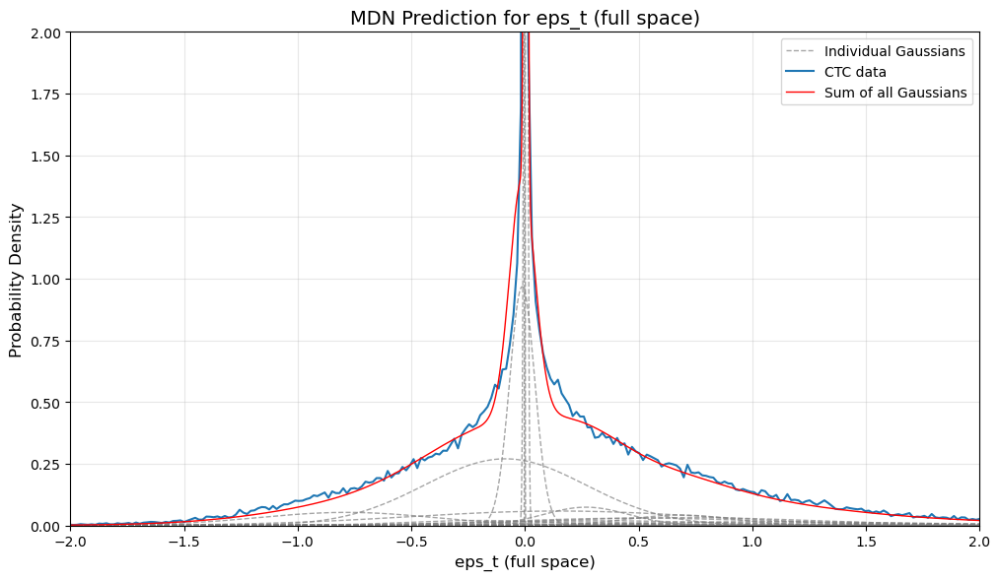

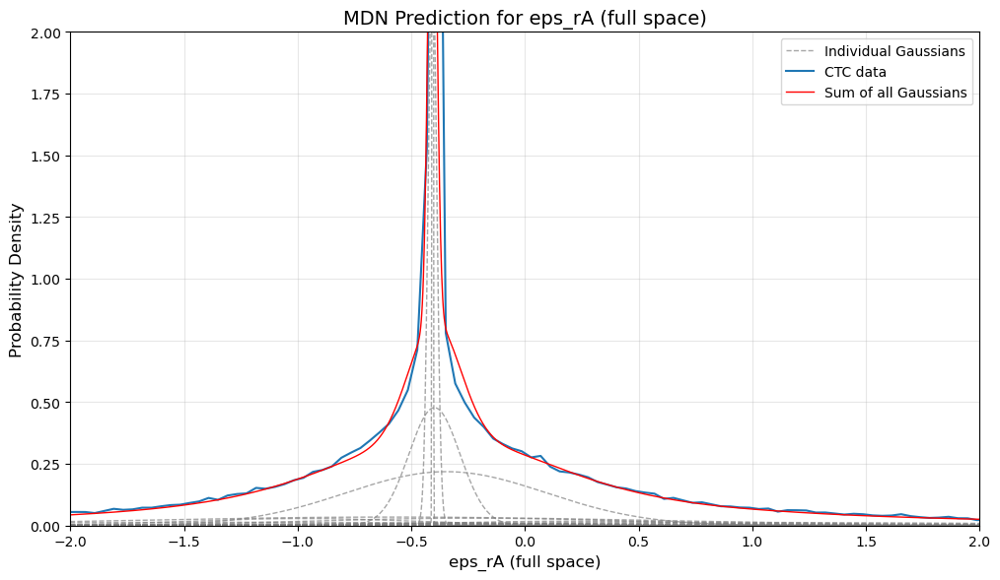

(Array([1.3121390e-06, 1.3169955e-06, 1.3218690e-06, ..., 1.2833490e-07,
        1.2779776e-07, 1.2726277e-07], dtype=float32),
 array([-11.42105865, -11.41876278, -11.4164669 , ...,  11.53080864,
         11.53310452,  11.53540039]))

In [62]:
def plot_epst_gaussians_fullspace(params, X_single, idx=0):
    """
    Plot eps_t distribution in the full MDN output space (no [0,1] transform).
    """
    if X_single.ndim == 1:
        X_single = X_single[None, :]
    
    z = apply_fun(params, X_single)
    alpha, mu, sigma = unpack_mdn_params(z, M)
    
    alpha_single = alpha[idx]
    mu_single = mu[idx]
    sigma_single = sigma[idx]
    
    # Use a reasonable range around the MDN means
    all_mu = mu_single[:, 0]
    all_sigma = sigma_single[:, 0]
    x_range = np.linspace(all_mu.min() - 4*all_sigma.max(), all_mu.max() + 4*all_sigma.max(), 10000)
    
    total_mixture = np.zeros_like(x_range)
    colors = plt.cm.tab20(np.linspace(0, 1, M))
    
    fig, ax = plt.subplots(figsize=(10, 6))
    
    for m in range(M):
        gaussian = norm.pdf(x_range, mu_single[m, 0], sigma_single[m, 0])
        weighted_gaussian = alpha_single[m] * gaussian
        ax.plot(x_range, weighted_gaussian, '--', color='gray', label='Individual Gaussians' if m == 0 else '', alpha=0.7, linewidth=1)
        total_mixture += weighted_gaussian
    

    counts, bin_edges = np.histogram(Y[:,0], bins=500, density=True)

    # Compute bin centers for plotting
    bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

    # Plot as line connecting bin centers
    plt.plot(bin_centers, counts, marker='', linestyle='-', label='CTC data')

    ax.plot(x_range, total_mixture, 'r-', linewidth=1, label='Sum of all Gaussians')
    ax.set_xlabel("eps_t (full space)", fontsize=12)
    ax.set_ylabel("Probability Density", fontsize=12)
    ax.set_title("MDN Prediction for eps_t (full space)", fontsize=14)
    ax.grid(True, alpha=0.3)
    ax.legend()
    plt.tight_layout()
    plt.ylim(0, 2)
    plt.xlim(-2, 2)
    plt.show()
    
    return total_mixture, x_range

def plot_epsrA_gaussians_fullspace(params, X_single, idx=0):
    """
    Plot eps_rA distribution in the full MDN output space (no [0,1] transform).
    """
    if X_single.ndim == 1:
        X_single = X_single[None, :]
    
    z = apply_fun(params, X_single)
    alpha, mu, sigma = unpack_mdn_params(z, M)
    
    alpha_single = alpha[idx]
    mu_single = mu[idx]
    sigma_single = sigma[idx]
    
    all_mu = mu_single[:, 1]
    all_sigma = sigma_single[:, 1]
    x_range = np.linspace(all_mu.min() - 4*all_sigma.max(), all_mu.max() + 4*all_sigma.max(), 10000)
    
    total_mixture = np.zeros_like(x_range)
    
    fig, ax = plt.subplots(figsize=(10, 6))
    
    for m in range(M):
        gaussian = norm.pdf(x_range, mu_single[m, 1], sigma_single[m, 1])
        weighted_gaussian = alpha_single[m] * gaussian
        ax.plot(x_range, weighted_gaussian, '--', color='gray', label='Individual Gaussians' if m == 0 else '', alpha=0.7, linewidth=1)
        total_mixture += weighted_gaussian
    
    counts, bin_edges = np.histogram(Y[:,1], bins=500, density=True)

    # Compute bin centers for plotting
    bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

    # Plot as line connecting bin centers
    plt.plot(bin_centers, counts, marker='', linestyle='-', label='CTC data')

    ax.plot(x_range, total_mixture, 'r-', linewidth=1, label='Sum of all Gaussians')
    ax.set_xlabel("eps_rA (full space)", fontsize=12)
    ax.set_ylabel("Probability Density", fontsize=12)
    ax.set_title("MDN Prediction for eps_rA (full space)", fontsize=14)
    ax.grid(True, alpha=0.3)
    ax.legend()
    plt.tight_layout()
    plt.ylim(0, 2)
    plt.xlim(-2, 2)
    plt.show()
    
    return total_mixture, x_range

plot_epst_gaussians_fullspace(params, X, idx=0)  # Show only sum

# Create histogram data (density=True gives probability density)
# For eps'rA:
# plot_epsrA_gaussians(params, X, idx=0)  # Show all 20 individual Gaussians + sum  
plot_epsrA_gaussians_fullspace(params, X, idx=0)  # Show only sum

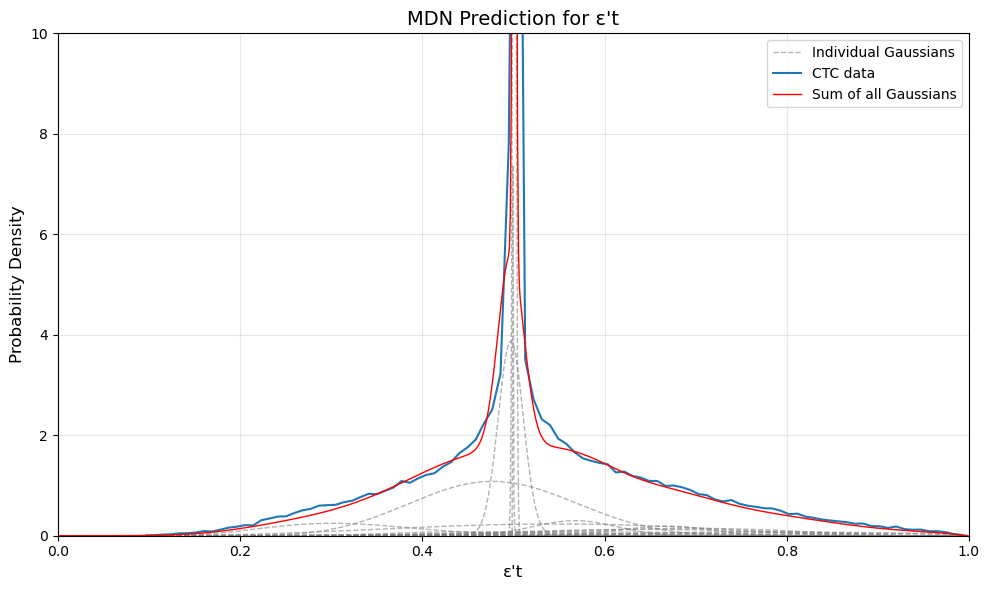

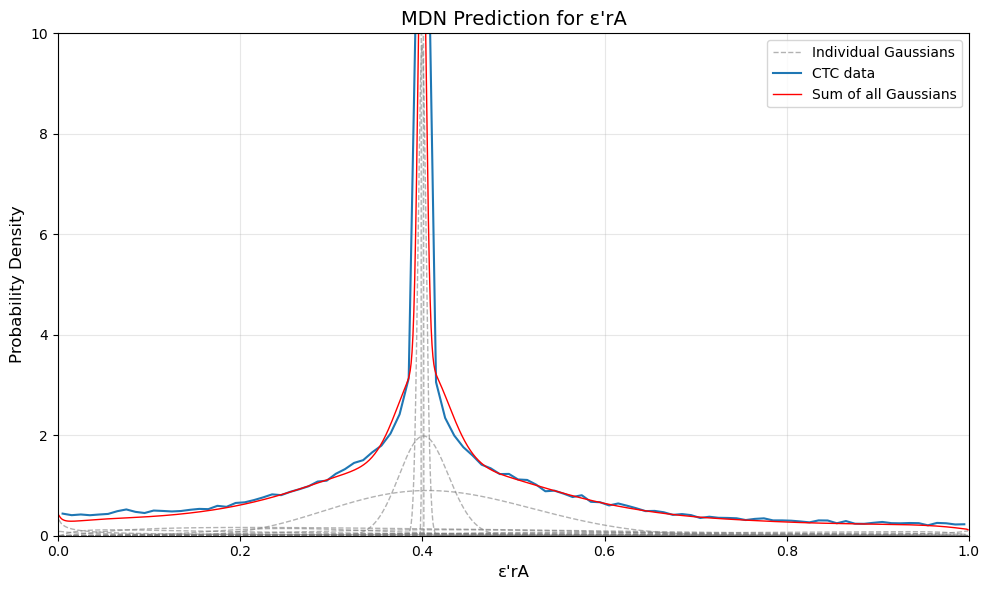

(Array([ 0.40402904,  0.37583318,  0.3524656 ,  0.3351485 ,  0.32233152,
         0.3127766 ,  0.30562294,  0.30027267,  0.29630208,  0.29340348,
         0.29134902,  0.28996643,  0.28912348,  0.28871682,  0.28866506,
         0.28890303,  0.2893782 ,  0.2900479 ,  0.2908771 ,  0.29183692,
         0.29290318,  0.294056  ,  0.29527852,  0.29655665,  0.29787838,
         0.29923365,  0.3006138 ,  0.3020116 ,  0.3034208 ,  0.30483612,
         0.30625317,  0.30766803,  0.30907735,  0.3104786 ,  0.3118694 ,
         0.3132478 ,  0.3146122 ,  0.3159613 ,  0.31729403,  0.31860963,
         0.3199073 ,  0.32118657,  0.32244736,  0.32368928,  0.32491228,
         0.3261164 ,  0.32730192,  0.32846886,  0.32961777,  0.3307487 ,
         0.33186233,  0.33295915,  0.33403957,  0.3351043 ,  0.3361538 ,
         0.33718887,  0.33821014,  0.33921832,  0.34021422,  0.34119844,
         0.342172  ,  0.34313545,  0.34408966,  0.34503555,  0.34597385,
         0.34690526,  0.3478308 ,  0.34875134,  0.3

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import jax.numpy as jnp
from scipy.stats import norm


def plot_epst_gaussians_simple(params, X_single, idx=0, show_individual=True):
    """
    Simplified version with cleaner visualization.
    """
    # Get MDN parameters for the single input
    if X_single.ndim == 1:
        X_single = X_single[None, :]
    
    z = apply_fun(params, X_single)
    alpha, mu, sigma = unpack_mdn_params(z, M)
    
    # Extract parameters for this single data point
    alpha_single = alpha[idx]
    mu_single = mu[idx]
    sigma_single = sigma[idx]
    
    # Create x-axis range
    eps_t_range = np.linspace(0.001, 0.999, 1000)
    logit_range = np.log(eps_t_range / (1 - eps_t_range))
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    
    total_mixture = np.zeros_like(eps_t_range)
    
    # Plot individual Gaussians (if requested)
    if show_individual:
        for m in range(M):
            mu_m = mu_single[m, 0]
            sigma_m = sigma_single[m, 0]
            alpha_m = alpha_single[m]
            
            gaussian_logit = norm.pdf(logit_range, mu_m, sigma_m)
            jacobian = eps_t_range * (1 - eps_t_range)
            weighted_gaussian = alpha_m * gaussian_logit / jacobian
            
            if alpha_m > 0.01:  # Only plot significant components
                ax.plot(eps_t_range, weighted_gaussian, '--', alpha=0.6, linewidth=1,
                       color='gray', label='Individual Gaussians' if m == 0 else '')
            
            total_mixture += weighted_gaussian
    else:
        # Just calculate total mixture without plotting individuals
        for m in range(M):
            mu_m = mu_single[m, 0]
            sigma_m = sigma_single[m, 0]
            alpha_m = alpha_single[m]
            
            gaussian_logit = norm.pdf(logit_range, mu_m, sigma_m)
            jacobian = eps_t_range * (1 - eps_t_range)
            weighted_gaussian = alpha_m * gaussian_logit / jacobian
            total_mixture += weighted_gaussian
    
    counts, bin_edges = np.histogram(inv_logit(Y[:,0]), bins=100, density=True)

    # Compute bin centers for plotting
    bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

    # Plot as line connecting bin centers
    plt.plot(bin_centers, counts, marker='', linestyle='-', label='CTC data')

    # Plot the total mixture
    ax.plot(eps_t_range, total_mixture, 'r-', linewidth=1, label='Sum of all Gaussians')
    
    ax.set_xlabel("ε't", fontsize=12)
    ax.set_ylabel("Probability Density", fontsize=12)
    ax.set_title(f"MDN Prediction for ε't", fontsize=14)
    ax.grid(True, alpha=0.3)
    ax.legend()
    plt.ylim(0, 10)
    plt.xlim(0, 1)
    plt.tight_layout()
    plt.show()
    
    return total_mixture, eps_t_range


def plot_epsrA_gaussians_simple(params, X_single, idx=0, show_individual=True):
    """
    Simplified version with cleaner visualization for eps_rA.
    """
    # Get MDN parameters for the single input
    if X_single.ndim == 1:
        X_single = X_single[None, :]
    
    z = apply_fun(params, X_single)
    alpha, mu, sigma = unpack_mdn_params(z, M)
    
    # Extract parameters for this single data point
    alpha_single = alpha[idx]
    mu_single = mu[idx]
    sigma_single = sigma[idx]
    
    # Create x-axis range
    eps_rA_range = np.linspace(0.001, 0.999, 1000)
    logit_range = np.log(eps_rA_range / (1 - eps_rA_range))
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    
    total_mixture = np.zeros_like(eps_rA_range)
    
    # Plot individual Gaussians (if requested)
    if show_individual:
        for m in range(M):
            mu_m = mu_single[m, 1]      # Use dimension 1 for eps_rA
            sigma_m = sigma_single[m, 1] # Use dimension 1 for eps_rA
            alpha_m = alpha_single[m]
            
            gaussian_logit = norm.pdf(logit_range, mu_m, sigma_m)
            jacobian = eps_rA_range * (1 - eps_rA_range)
            weighted_gaussian = alpha_m * gaussian_logit / jacobian
            
            if alpha_m > 0.01:  # Only plot significant components
                ax.plot(eps_rA_range, weighted_gaussian, '--', alpha=0.6, linewidth=1,
                       color='gray', label='Individual Gaussians' if m == 0 else '')
            
            total_mixture += weighted_gaussian
    else:
        # Just calculate total mixture without plotting individuals
        for m in range(M):
            mu_m = mu_single[m, 1]      # Use dimension 1 for eps_rA
            sigma_m = sigma_single[m, 1] # Use dimension 1 for eps_rA
            alpha_m = alpha_single[m]
            
            gaussian_logit = norm.pdf(logit_range, mu_m, sigma_m)
            jacobian = eps_rA_range * (1 - eps_rA_range)
            weighted_gaussian = alpha_m * gaussian_logit / jacobian
            total_mixture += weighted_gaussian
    
    counts, bin_edges = np.histogram(inv_logit(Y[:,1]), bins=100, density=True)

    # Compute bin centers for plotting
    bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

    # Plot as line connecting bin centers
    plt.plot(bin_centers, counts, marker='', linestyle='-', label='CTC data')

    # Plot the total mixture
    ax.plot(eps_rA_range, total_mixture, 'r-', linewidth=1, label='Sum of all Gaussians')
    
    ax.set_xlabel("ε'rA", fontsize=12)
    ax.set_ylabel("Probability Density", fontsize=12)
    ax.set_title(f"MDN Prediction for ε'rA", fontsize=14)
    ax.grid(True, alpha=0.3)
    ax.legend()
    plt.ylim(0, 10)
    plt.xlim(0, 1)
    plt.tight_layout()
    plt.show()
    
    return total_mixture, eps_rA_range

# Usage examples:
# For a single data point (e.g., first row):
# X, Y, Ec = preprocess_df(df)

# For eps't:
# plot_epst_gaussians(params, X, idx=0)  # Show all 20 individual Gaussians + sum
plot_epst_gaussians_simple(params, X, idx=0, show_individual=True)  # Show only sum

# For eps'rA:
# plot_epsrA_gaussians(params, X, idx=0)  # Show all 20 individual Gaussians + sum  
plot_epsrA_gaussians_simple(params, X, idx=0, show_individual=True)  # Show only sum

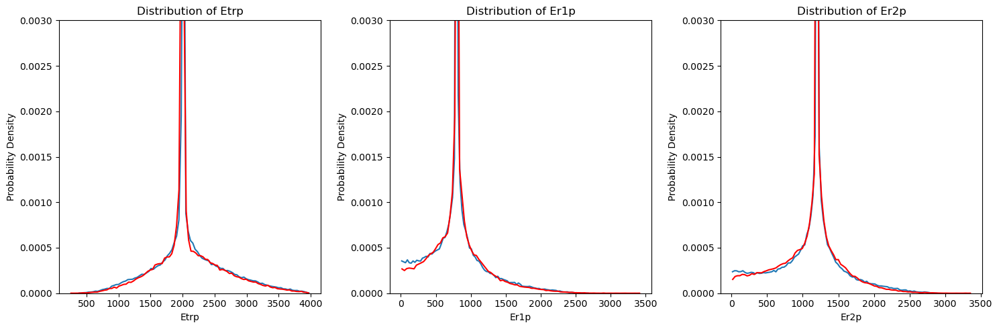

In [64]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Example: Load your dataframe
# df = pd.read_csv("your_data.csv")

# Create the figure with 3 subplots side by side
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

X, Y, Ec = preprocess_df(df)
Etrp_samp, Er1p_samp, Er2p_samp = mdn_sample_conserve(params, X, Ec, n_samples=1)

samp = [Etrp_samp, Er1p_samp, Er2p_samp]

# Columns to plot
columns = ["Etrp", "Er1p", "Er2p"]

# Loop through each column and plot line over histogram bins
for ax, col in zip(axes, columns):
    data = df[col].dropna()  # Remove NaNs if any
    
    # Create histogram data (density=True gives probability density)
    counts, bin_edges = np.histogram(data, bins=100, density=True)
    counts_samp, bin_edges_samp = np.histogram(samp[columns.index(col)], bins=100, density=True)
    
    # Compute bin centers for plotting
    bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
    bin_centers_samp = 0.5 * (bin_edges_samp[1:] + bin_edges_samp[:-1])
    
    # Plot as line connecting bin centers
    ax.plot(bin_centers, counts, marker='', linestyle='-')
    ax.plot(bin_centers_samp, counts_samp, marker='', linestyle='-', color='red')
    ax.set_title(f"Distribution of {col}")
    ax.set_xlabel(columns[columns.index(col)])
    ax.set_ylabel("Probability Density")
    ax.set_ylim(0, 0.003)

plt.tight_layout()
plt.show()

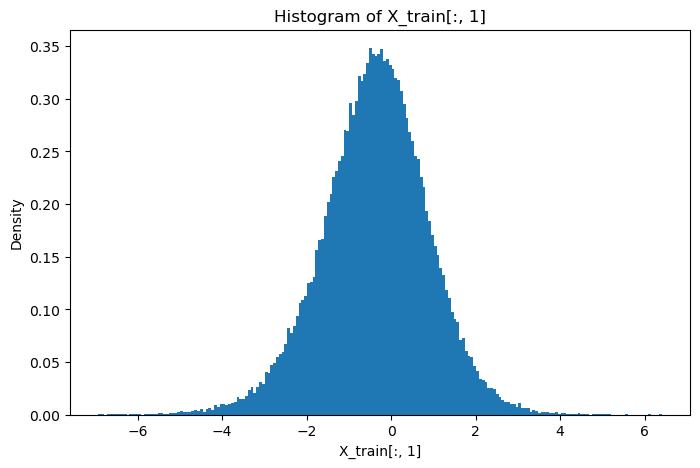

In [68]:
import os
import math
import numpy as np
import pandas as pd
import jax
import jax.numpy as jnp
from jax import random, jit, value_and_grad
from jax.example_libraries import stax, optimizers
import matplotlib.pyplot as plt

# -------------------------- Utilities --------------------------
def logit(x):
    x = jnp.clip(x, 1e-6, 1 - 1e-6)
    return jnp.log(x) - jnp.log1p(-x)

def inv_logit(z):
    return jnp.clip(1.0 / (1.0 + jnp.exp(-z)), 1e-12, 1 - 1e-12)

def preprocess_df(df):
    """
    Preprocess according to the paper's variable definitions:
    - Ec: total collision energy
    - eps_t: translational energy fraction  
    - eps_r_A: rotational energy fraction for molecule A
    """
    # Epsilon to prevent division by zero if total rotational energy is zero
    epsilon = 1e-12

    # --- Pre-collision values ---
    Etr = df["Etr"].values
    Er1 = df["Er1"].values
    Er2 = df["Er2"].values
    
    Ec = Etr + Er1 + Er2
    E_rot_total = Er1 + Er2
    
    # Calculate energy fractions (precollisional)
    eps_t = Etr / (Ec + epsilon)
    eps_r_A = Er1 / (E_rot_total + epsilon)
    
    # --- Post-collision values (for training targets) ---
    Etrp = df["Etrp"].values
    Er1p = df["Er1p"].values
    Er2p = df["Er2p"].values
    
    # Post-collision Ec is the same as pre-collision Ec
    E_rot_p_total = Er1p + Er2p

    # Calculate postcollisional energy fractions (targets)
    eps_t_prime = Etrp / (Ec + epsilon)
    eps_r_A_prime = Er1p / (E_rot_p_total + epsilon)
    
    # Apply transformations as per Equation 4.15
    x = np.stack([
        np.log(Ec + epsilon),      # E_c^(p)
        logit(eps_t),              # eps_t^(p) 
        logit(eps_r_A),            # eps_r,A^(p)
        np.exp(df["b"].values)     # b^(p)  # Uncomment if including impact parameter
    ], axis=-1)
    
    y = np.stack([
        logit(eps_t_prime),        # eps_t'^(p)
        logit(eps_r_A_prime)       # eps_r,A'^(p)
    ], axis=-1)
    
    return x.astype(np.float32), y.astype(np.float32), Ec

# -------------------------- Load and split dataset --------------------------
X, Y, Ec = preprocess_df(data)
X_test, Y_test, Ec_test = preprocess_df(data_test)
N = X.shape[0]


X_train, Y_train = X, Y
X_val, Y_val = X_test, Y_test
X_test, Y_test = X_test, Y_test

plt.figure(figsize=(8,5))
plt.hist(X_train[:, 1], bins=200, density=True)
plt.xlabel("X_train[:, 1]")
plt.ylabel("Density")
plt.title("Histogram of X_train[:, 1]")
plt.show()

In [2]:
def dscatter(x,y):
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    plt.scatter(x,y,c=z, s=3)


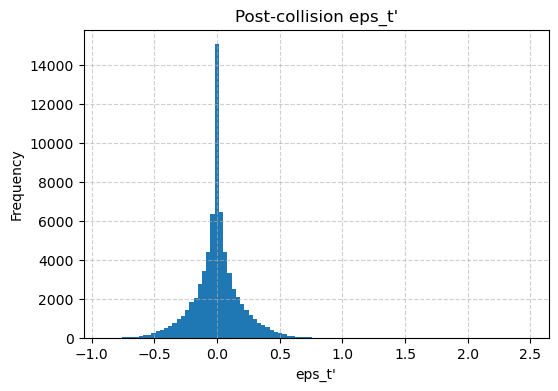

In [168]:
# --- Pre-collision values ---
Etr = data["Etr"].values
Er1 = data["Er1"].values
Er2 = data["Er2"].values

Ec = Etr + Er1 + Er2
E_rot_total = Er1 + Er2

# Calculate energy fractions (precollisional)
eps_t = Etr / (Ec + 1e-15)
eps_r_A = Er1 / (E_rot_total + 1e-15)

# --- Post-collision values (for training targets) ---
Etrp = data["Etrp"].values
Er1p = data["Er1p"].values
Er2p = data["Er2p"].values

# Post-collision Ec is the same as pre-collision Ec
E_rot_p_total = Er1p + Er2p

# Calculate postcollisional energy fractions (targets)
eps_t_prime = Etrp / (Ec + 1e-15)
eps_r_A_prime = Er1p / (E_rot_p_total + 1e-15)

plt.figure(figsize=(6, 4))
plt.hist(eps_t_prime-eps_t, bins=100)
plt.title("Post-collision eps_t'")
plt.xlabel("eps_t'")
plt.ylabel("Frequency")
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

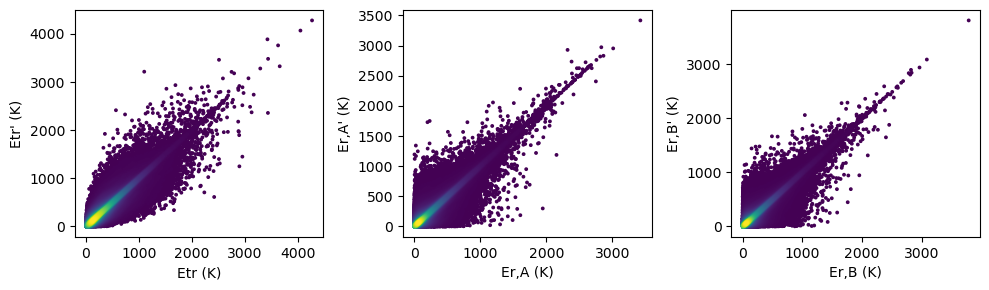

In [169]:
plt.figure(figsize=[10,3])

plt.subplot(1,3,1)
plt.xlabel("Etr (K)")
plt.ylabel("Etr' (K)")
dscatter(data['Etr'],data['Etrp'])


plt.subplot(1,3,2)
plt.xlabel("Er,A (K)")
plt.ylabel("Er,A' (K)")
dscatter(data['Er1'],data['Er1p'])


plt.subplot(1,3,3)
plt.xlabel("Er,B (K)")
plt.ylabel("Er,B' (K)")
dscatter(data['Er2'],data['Er2p'])
plt.tight_layout()
plt.show()

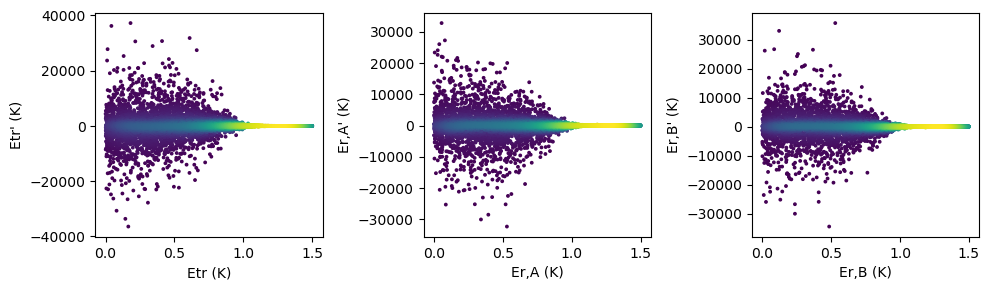

In [6]:
plt.figure(figsize=[10,3])

plt.subplot(1,3,1)
plt.xlabel("Etr (K)")
plt.ylabel("Etr' (K)")
dscatter(data['b'],data['Etrp'] - data['Etr'])


plt.subplot(1,3,2)
plt.xlabel("Er,A (K)")
plt.ylabel("Er,A' (K)")
dscatter(data['b'],data['Er1p']-data['Er1'])


plt.subplot(1,3,3)
plt.xlabel("Er,B (K)")
plt.ylabel("Er,B' (K)")
dscatter(data['b'],data['Er2p']-data['Er2'])
plt.tight_layout()
plt.show()

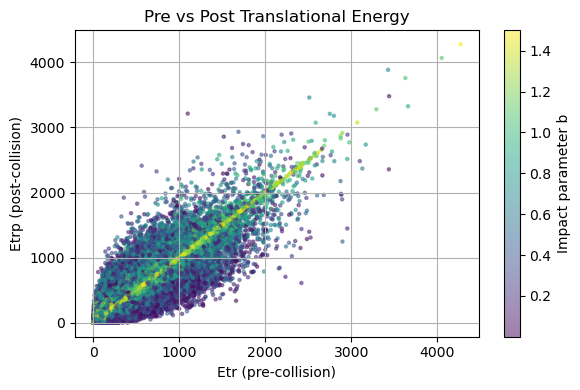

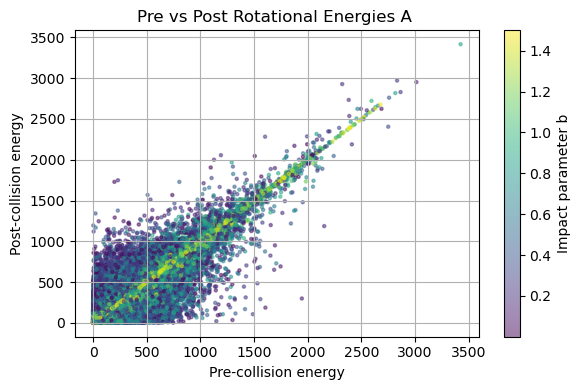

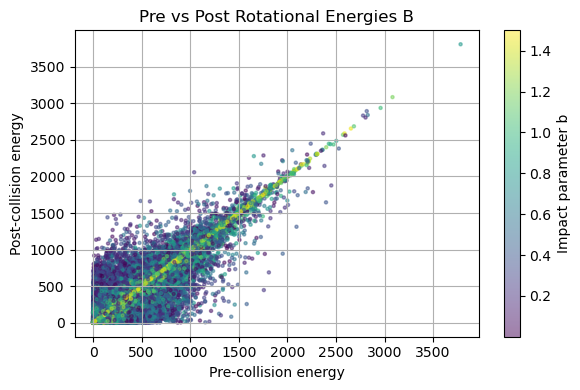

In [23]:
# --- Plot 1: Pre vs. Post Translational Energy ---
plt.figure(figsize=(6,4))
plt.scatter(data["Etr"], data["Etrp"], alpha=0.5, s=5, c=data["b"])
plt.colorbar(label='Impact parameter b')
plt.title("Pre vs Post Translational Energy")
plt.xlabel("Etr (pre-collision)")
plt.ylabel("Etrp (post-collision)")
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Plot 2: Pre vs Post Rotational Energies ---
plt.figure(figsize=(6,4))
plt.scatter(data["Er1"], data["Er1p"], alpha=0.5, s=5, c=data["b"])
plt.colorbar(label='Impact parameter b')
plt.title("Pre vs Post Rotational Energies A ")
plt.xlabel("Pre-collision energy")
plt.ylabel("Post-collision energy")
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Plot 3: Pre vs Post Rotational Energies ---
plt.figure(figsize=(6,4))
plt.scatter(data["Er2"], data["Er2p"], alpha=0.5, s=5, c=data["b"])
plt.colorbar(label='Impact parameter b')
plt.title("Pre vs Post Rotational Energies B")
plt.xlabel("Pre-collision energy")
plt.ylabel("Post-collision energy")
plt.grid(True)
plt.tight_layout()
plt.show()

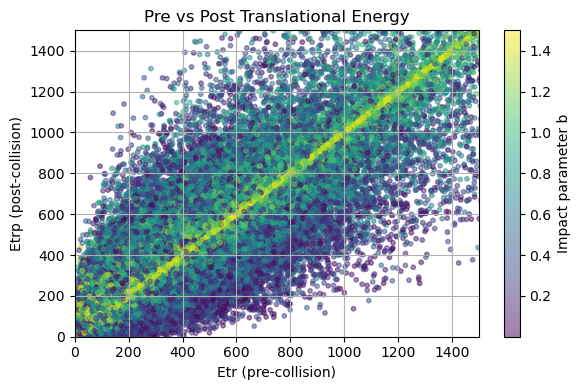

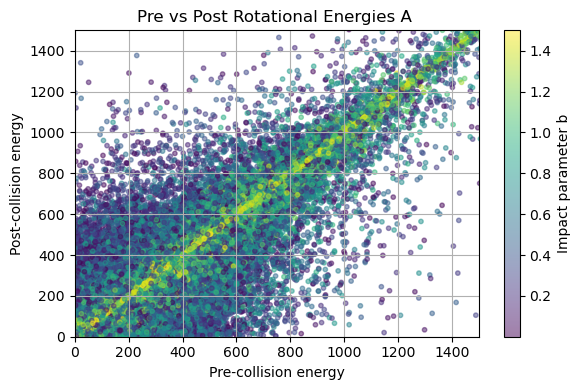

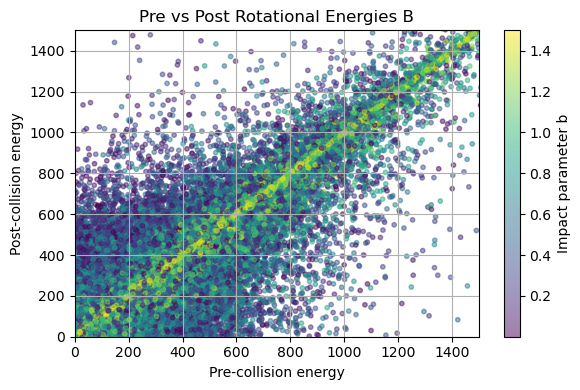

In [24]:
# --- Plot 1: Pre vs. Post Translational Energy ---
plt.figure(figsize=(6,4))
plt.scatter(data["Etr"], data["Etrp"], alpha=0.5, s=10, c=data["b"])
plt.colorbar(label='Impact parameter b')
plt.title("Pre vs Post Translational Energy")
plt.xlabel("Etr (pre-collision)")
plt.ylabel("Etrp (post-collision)")
plt.grid(True)
plt.tight_layout()
plt.xlim(0, 1500)
plt.ylim(0, 1500)
plt.show()

# --- Plot 2: Pre vs Post Rotational Energies ---
plt.figure(figsize=(6,4))
plt.scatter(data["Er1"], data["Er1p"], alpha=0.5, s=10, c=data["b"])
plt.colorbar(label='Impact parameter b')
plt.title("Pre vs Post Rotational Energies A ")
plt.xlabel("Pre-collision energy")
plt.ylabel("Post-collision energy")
plt.grid(True)
plt.tight_layout()
plt.xlim(0, 1500)
plt.ylim(0, 1500)
plt.show()

# --- Plot 3: Pre vs Post Rotational Energies ---
plt.figure(figsize=(6,4))
plt.scatter(data["Er2"], data["Er2p"], alpha=0.5, s=10, c=data["b"])
plt.colorbar(label='Impact parameter b')
plt.title("Pre vs Post Rotational Energies B")
plt.xlabel("Pre-collision energy")
plt.ylabel("Post-collision energy")
plt.grid(True)
plt.tight_layout()
plt.xlim(0, 1500)
plt.ylim(0, 1500)
plt.show()

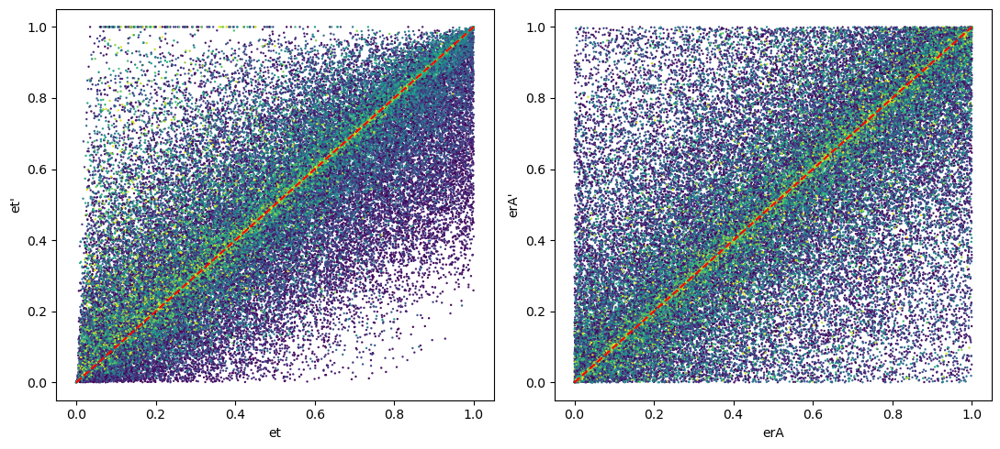

In [59]:
import os
import math
import numpy as np
import pandas as pd
import jax
import jax.numpy as jnp
from jax import random, jit, value_and_grad
from jax.example_libraries import stax, optimizers
import matplotlib.pyplot as plt

# -------------------------- Utilities --------------------------
def logit(x):
    x = jnp.clip(x, 1e-6, 1 - 1e-6)
    return jnp.log(x) - jnp.log1p(-x)

def inv_logit(z):
    return jnp.clip(1.0 / (1.0 + jnp.exp(-z)), 1e-12, 1 - 1e-12)

def preprocess_df(df):
    """
    Preprocess according to the paper's variable definitions:
    - Ec: total collision energy
    - eps_t: translational energy fraction  
    - eps_r_A: rotational energy fraction for molecule A
    """
    # Epsilon to prevent division by zero if total rotational energy is zero
    epsilon = 1e-12

    # --- Pre-collision values ---
    Etr = df["Etr"].values
    Er1 = df["Er1"].values
    Er2 = df["Er2"].values
    
    Ec = Etr + Er1 + Er2
    E_rot_total = Er1 + Er2
    
    # Calculate energy fractions (precollisional)
    eps_t = Etr / (Ec + epsilon)
    eps_r_A = Er1 / (E_rot_total + epsilon)
    
    # --- Post-collision values (for training targets) ---
    Etrp = df["Etrp"].values
    Er1p = df["Er1p"].values
    Er2p = df["Er2p"].values
    
    # Post-collision Ec is the same as pre-collision Ec
    E_rot_p_total = Er1p + Er2p

    # Calculate postcollisional energy fractions (targets)
    eps_t_prime = Etrp / (Ec + epsilon)
    eps_r_A_prime = Er1p / (E_rot_p_total + epsilon)
    
    # Apply transformations as per Equation 4.15
    x = np.stack([
        np.log(Ec + epsilon),      # E_c^(p)
        logit(eps_t),              # eps_t^(p) 
        logit(eps_r_A),            # eps_r,A^(p)
        np.exp(df["b"].values)     # b^(p)  # Uncomment if including impact parameter
    ], axis=-1)
    
    y = np.stack([
        logit(eps_t_prime),        # eps_t'^(p)
        logit(eps_r_A_prime)       # eps_r,A'^(p)
    ], axis=-1)
    
    return x.astype(np.float32), y.astype(np.float32), Ec

# -------------------------- Load and split dataset --------------------------
X, Y, Ec = preprocess_df(data)
X_test, Y_test, Ec_test = preprocess_df(data_test)
N = X.shape[0]


X_train, Y_train = X, Y
X_val, Y_val = X_test, Y_test
X_test, Y_test = X_test, Y_test

plt.figure(figsize=[11,5])

plt.subplot(1,2,1)
plt.xlabel("et")
plt.ylabel("et'")
plt.scatter(inv_logit(X_train[:, 1]), inv_logit(Y_train[:, 0]), s=0.5, alpha=1, c=X_train[:, 3], cmap='viridis')
plt.plot([0,1], [0, 1], color='red', linestyle='--')

plt.subplot(1,2,2)
plt.xlabel("erA")
plt.ylabel("erA'")
plt.scatter(inv_logit(X_train[:, 2]), inv_logit(Y_train[:, 1]), s=0.5, alpha=1, c=X_train[:, 3], cmap='viridis')
plt.plot([0,1], [0, 1], color='red', linestyle='--')
plt.tight_layout()
plt.show()

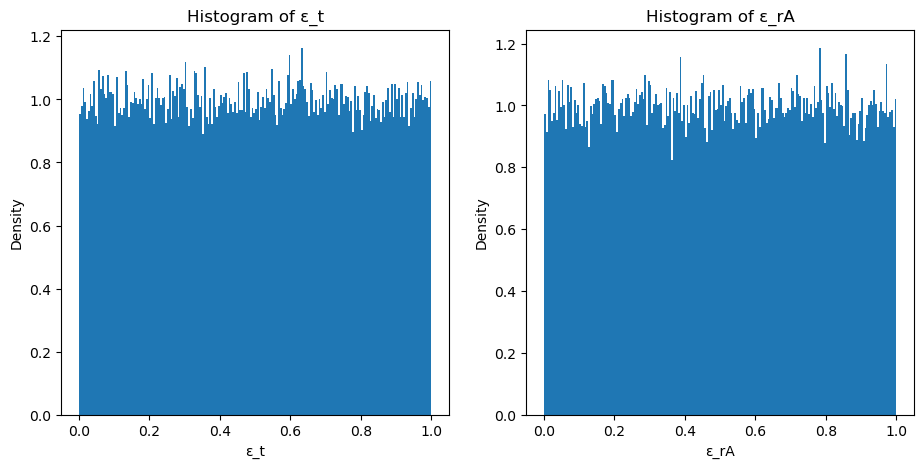

In [60]:
plt.figure(figsize=[11,5])

plt.subplot(1,2,1)
plt.hist(inv_logit(X_train[:, 1]), bins=200, density=True)
plt.xlabel("ε_t")
plt.ylabel("Density")
plt.title("Histogram of ε_t")

plt.subplot(1,2,2)
plt.hist(inv_logit(X_train[:, 2]), bins=200, density=True)
plt.xlabel("ε_rA")
plt.ylabel("Density")
plt.title("Histogram of ε_rA")
plt.show()

In [14]:
def MDN_init(in_dim, hidden_size=8, M=20):
    """
    MDN with M/2 learned modes; final distribution is symmetrized around zero.
    """
    assert M % 2 == 0, "M must be even if we want to halve and mirror"
    half_M = M // 2

    init_fun, apply_fun = stax.serial(
        stax.Dense(hidden_size),
        stax.Relu,
        stax.Dense(half_M * 5)  # only half the parameters
    )
    return init_fun, apply_fun, M


def unpack_mdn_params(z, M):
    """
    Unpack MDN params into weights, means, sigmas with symmetry:
    - Input z has shape (B, half_M*5)
    - Returns alpha, mu, sigma for full M components
    """
    B = z.shape[0]
    half_M = M // 2
    z = z.reshape(B, half_M, 5)

    alpha_raw, mu, sigma_raw = z[..., 0], z[..., 1:3], z[..., 3:5]

    # base params
    alpha_half = jax.nn.softmax(alpha_raw, axis=-1) + 1e-12
    mu_half = mu
    sigma_half = jax.nn.softplus(sigma_raw) + 1e-8

    # mirror around zero: create symmetric modes
    alpha_full = jnp.concatenate([0.5 * alpha_half, 0.5 * alpha_half], axis=-1)
    mu_avg = jnp.mean(mu_half, axis=-1, keepdims=True)
    mu_diff = mu_half - mu_avg
    mu_full = jnp.concatenate([mu_avg+mu_diff, mu_avg-mu_diff], axis=1)
    sigma_full = jnp.concatenate([sigma_half, sigma_half], axis=1)  # same sigma

    return alpha_full, mu_full, sigma_full

In [15]:
def unpack_mdn_params_symmetric(z, M):
    """
    Unpack MDN outputs into weights, means, sigmas with symmetry around x=y
    z: (B, M*5) MDN output
    M: total number of modes (should be even to mirror)
    
    Returns:
        alpha_full: (B, M) mixture weights
        mu_full: (B, M, 2) means
        sigma_full: (B, M, 2) std deviations
    """
    B = z.shape[0]
    assert M % 2 == 0, "M must be even for symmetric mirroring"
    half_M = M // 2

    # reshape to (B, half_M, 5)
    z = z.reshape(B, half_M, 5)
    alpha_raw, mu_half, sigma_raw = z[...,0], z[...,1:3], z[...,3:5]

    # softmax weights and positive stds
    alpha_half = jax.nn.softmax(alpha_raw, axis=-1) + 1e-12
    sigma_half = jax.nn.softplus(sigma_raw) + 1e-8

    # Mirror the modes around x=y
    mu_mirror = jnp.stack([mu_half[...,1], mu_half[...,0]], axis=-1)  # swap x and y

    # Concatenate original and mirrored
    mu_full = jnp.concatenate([mu_half, mu_mirror], axis=1)
    sigma_full = jnp.concatenate([sigma_half, sigma_half], axis=1)
    alpha_full = jnp.concatenate([0.5*alpha_half, 0.5*alpha_half], axis=1)

    return alpha_full, mu_full, sigma_full

# Dependent outputs (same alpha)

In [5]:
import os
import math
import numpy as np
import pandas as pd
import jax
import jax.numpy as jnp
from jax import random, jit, value_and_grad
from jax.example_libraries import stax, optimizers
import matplotlib.pyplot as plt

# -------------------------- Utilities --------------------------
def logit(x):
    x = jnp.clip(x, 1e-6, 1 - 1e-6)
    return jnp.log(x) - jnp.log1p(-x)

def inv_logit(z):
    return jnp.clip(1.0 / (1.0 + jnp.exp(-z)), 1e-12, 1 - 1e-12)

def preprocess_df(df):
    """
    Preprocess according to the paper's variable definitions:
    - Ec: total collision energy
    - eps_t: translational energy fraction  
    - eps_r_A: rotational energy fraction for molecule A
    """
    # Epsilon to prevent division by zero if total rotational energy is zero
    epsilon = 1e-12

    # --- Pre-collision values ---
    Etr = df["Etr"].values
    Er1 = df["Er1"].values
    Er2 = df["Er2"].values
    
    Ec = Etr + Er1 + Er2
    E_rot_total = Er1 + Er2
    
    # Calculate energy fractions (precollisional)
    eps_t = Etr / (Ec + epsilon)
    eps_r_A = Er1 / (E_rot_total + epsilon)
    
    # --- Post-collision values (for training targets) ---
    Etrp = df["Etrp"].values
    Er1p = df["Er1p"].values
    Er2p = df["Er2p"].values
    
    # Post-collision Ec is the same as pre-collision Ec
    E_rot_p_total = Er1p + Er2p

    # Calculate postcollisional energy fractions (targets)
    eps_t_prime = Etrp / (Ec + epsilon)
    eps_r_A_prime = Er1p / (E_rot_p_total + epsilon)
    
    # Apply transformations as per Equation 4.15
    x = np.stack([
        np.log(Ec + epsilon),      # E_c^(p)
        logit(eps_t),              # eps_t^(p) 
        logit(eps_r_A),            # eps_r,A^(p)
        #np.exp(df["b"].values)     # b^(p)  # Uncomment if including impact parameter
    ], axis=-1)
    
    y = np.stack([
        logit(eps_t_prime),        # eps_t'^(p)
        logit(eps_r_A_prime)       # eps_r,A'^(p)
    ], axis=-1)
    
    return x.astype(np.float32), y.astype(np.float32), Ec

# -------------------------- Load and split dataset --------------------------
X, Y, Ec = preprocess_df(data)
X_test, Y_test, Ec_test = preprocess_df(data_test)
N = X.shape[0]


X_train, Y_train = X, Y
X_val, Y_val = X_test, Y_test
X_test, Y_test = X_test, Y_test

# -------------------------- MDN model --------------------------

def MDN_init(in_dim, hidden_size=8, M=20):
    """
    Initialize MDN according to Table 4.1:
    - Input layer: 3 neurons
    - Hidden layer: 8 neurons with ReLU
    - Output layer: M×5 neurons (linear activation)
    """
    init_fun, apply_fun = stax.serial(
        stax.Dense(hidden_size), 
        stax.Relu,
        stax.Dense(M * 5)  # M components × 5 parameters each
    )
    return init_fun, apply_fun, M

def unpack_mdn_params(z, M):
    """Unpack MDN outputs into GMM parameters"""
    B = z.shape[0]
    z = z.reshape(B, M, 5)
    alpha_raw, mu, sigma_raw = z[...,0], z[...,1:3], z[...,3:5]
    
    # Ensure proper constraints
    alpha = jax.nn.softmax(alpha_raw, axis=-1) + 1e-12  # weights sum to 1
    sigma = jax.nn.softplus(sigma_raw) + 1e-8          # positive std devs
    return alpha, mu, sigma

@jit
def mdn_nll(params, x, y, lambda_entropy=0.01, lambda_sigma=0.001):
    """Negative log-likelihood loss function"""
    z = apply_fun(params, x)
    alpha, mu, sigma = unpack_mdn_params(z, M)
    
    # Expand y to match mixture dimensions
    y_exp = jnp.expand_dims(y, axis=1)  # (B, 1, 2)
    
    # Calculate log probability for each component
    var = sigma**2
    log_comp = -0.5 * jnp.sum((y_exp - mu)**2 / var, axis=-1) \
               - 0.5 * jnp.sum(jnp.log(2 * math.pi * var), axis=-1)
    
    # Mix with weights
    log_mix = jnp.log(alpha) + log_comp
    
    # Numerically stable log-sum-exp
    max_log = jnp.max(log_mix, axis=-1, keepdims=True)
    lse = max_log + jnp.log(jnp.sum(jnp.exp(log_mix - max_log), axis=-1, keepdims=True))
    nll = -jnp.mean(lse)

    # Regularizations
    # entropy = -jnp.sum(alpha * jnp.log(alpha + 1e-8), axis=-1)
    # sigma_reg = lambda_sigma * jnp.mean(sigma**2)

    return nll #+ lambda_entropy * jnp.mean(entropy) + sigma_reg

# -------------------------- Training setup --------------------------
# Use paper's hyperparameters
M = 20  # 20 Optimized number of mixture components # with b this can be smaller than 20~3, less complicated distribution
learning_rate = 1e-4  # Paper uses 1e-4
batch_size = 1024   # Paper uses 10,000 out of 1.000.000

init_fun, apply_fun, M = MDN_init(X.shape[1], hidden_size=8, M=M) # increase hidden size when adding b ~ 256 (mainly when using less mixtures)
_, params = init_fun(random.PRNGKey(42), (-1, X.shape[1]))

# ADAM optimizer
opt_init, opt_update, get_params = optimizers.adam(learning_rate)
opt_state = opt_init(params)

@jit
def update(i, opt_state, x, y):
    params = get_params(opt_state)
    loss, grads = value_and_grad(mdn_nll)(params, x, y)
    return opt_update(i, grads, opt_state), loss

# -------------------------- Training loop --------------------------
def batch_indices(N, batch_size):
    """Precompute batch indices for faster iteration."""
    idx = np.random.permutation(N)
    return [idx[i:i+batch_size] for i in range(0, N, batch_size)]

# Early stopping variables
best_val_loss = float('inf')
patience = 10
patience_counter = 0
best_params = None

all_train_losses = []  # store per-iteration train loss
all_val_losses = []    # store per-epoch val loss

for epoch in range(1000):
    # Precompute batch indices once per epoch
    batches = batch_indices(len(X_train), batch_size)
    train_losses = []

    for i, batch_idx in enumerate(batches):
        xb, yb = X_train[batch_idx], Y_train[batch_idx]
        step_idx = epoch * len(batches) + i
        opt_state, loss = update(step_idx, opt_state, xb, yb)
        train_losses.append(float(loss))

    all_train_losses.append(np.mean(train_losses))  # record per iteration

    # Validation
    val_loss = float(mdn_nll(get_params(opt_state), X_val, Y_val))
    all_val_losses.append(val_loss)  # record per epoch

    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_params = get_params(opt_state)
        patience_counter = 0
    else:
        patience_counter += 1

    if epoch % 10 == 0:
        print(f"Epoch {epoch+1}: train_loss={np.mean(train_losses):.4f}, val_loss={val_loss:.4f}")
    
    if patience_counter >= patience:
        print(f"Early stopping at epoch {epoch+1}")
        break

# Use best parameters
params = best_params if best_params is not None else get_params(opt_state)
test_loss = float(mdn_nll(params, X_test, Y_test))
print(f"Final test NLL: {test_loss:.4f}")

def mdn_sample_conserve(params, X, Ec, n_samples=1, key=random.PRNGKey(0)):
    """
    Sample post-collision energy fractions from MDN while conserving total energy.
    Returns energies Etr', Er1', Er2' such that sum = Ec always.
    """
    z = apply_fun(params, X)
    alpha, mu, sigma = unpack_mdn_params(z, M)
    
    N, M_, _ = mu.shape
    key_comp, key_noise = random.split(key)

    # Mixture component choice for all samples
    comp_idx = random.categorical(key_comp, jnp.log(alpha), shape=(n_samples, N))
    mu_s = mu[jnp.arange(N)[:, None], comp_idx.T]       # (N, n_samples, 2)
    sigma_s = sigma[jnp.arange(N)[:, None], comp_idx.T] # (N, n_samples, 2)

    # Sample Gaussian noise in one shot
    noise = random.normal(key_noise, mu_s.shape)
    draws = mu_s + noise * sigma_s  # (N, n_samples, 2)
    
    # Map back to [0,1] via inverse logit
    # draws[..., 0] corresponds to eps_t_prime
    # draws[..., 1] corresponds to eps_rA_prime
    eps_prime_fractions = inv_logit(draws)  # Shape: (N, n_samples, 2)
    
    eps_t_p = eps_prime_fractions[..., 0]   # Shape: (N, n_samples)
    eps_rA_p = eps_prime_fractions[..., 1] # Shape: (N, n_samples)


    Ec_exp = Ec[:, None]  # Shape (N, 1) to allow broadcasting

    # 1. Calculate post-collision translational energy
    Etr_p = eps_t_p * Ec_exp

    # 2. Calculate total post-collision rotational energy
    Erot_p_total = (1.0 - eps_t_p) * Ec_exp

    # 3. Split total rotational energy between molecules A and B
    Er1_p = eps_rA_p * Erot_p_total
    Er2_p = (1.0 - eps_rA_p) * Erot_p_total
    
    return Etr_p, Er1_p, Er2_p

Epoch 1: train_loss=4.0005, val_loss=3.9336
Epoch 11: train_loss=3.5987, val_loss=3.5684
Epoch 21: train_loss=3.2463, val_loss=3.2003
Epoch 31: train_loss=2.8337, val_loss=2.7976
Epoch 41: train_loss=2.6506, val_loss=2.6191
Epoch 51: train_loss=2.5604, val_loss=2.5339
Epoch 61: train_loss=2.4961, val_loss=2.4759
Epoch 71: train_loss=2.4629, val_loss=2.4463
Epoch 81: train_loss=2.4460, val_loss=2.4280
Epoch 91: train_loss=2.4363, val_loss=2.4172
Epoch 101: train_loss=2.4294, val_loss=2.4110
Epoch 111: train_loss=2.4246, val_loss=2.4059
Epoch 121: train_loss=2.4166, val_loss=2.4011
Epoch 131: train_loss=2.4152, val_loss=2.3997
Epoch 141: train_loss=2.4088, val_loss=2.3944
Epoch 151: train_loss=2.4070, val_loss=2.3910
Epoch 161: train_loss=2.4025, val_loss=2.3881
Epoch 171: train_loss=2.4004, val_loss=2.3860
Epoch 181: train_loss=2.3994, val_loss=2.3826
Epoch 191: train_loss=2.3955, val_loss=2.3804
Epoch 201: train_loss=2.3934, val_loss=2.3791
Epoch 211: train_loss=2.3920, val_loss=2.3802

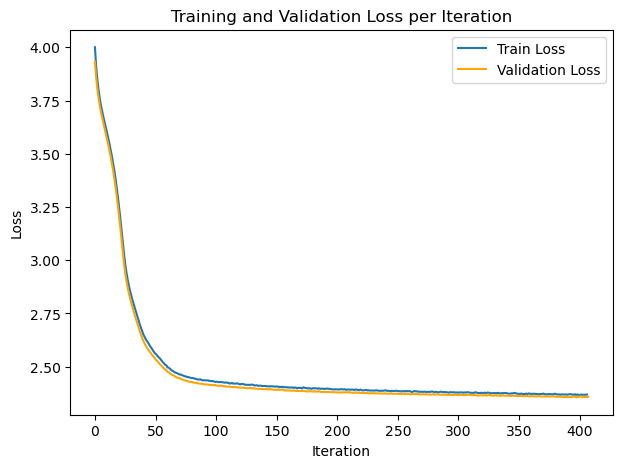

In [6]:
# Plot training and validation loss
plt.figure(figsize=(7,5))
plt.plot(all_train_losses, label="Train Loss")
val_iters = np.linspace(0, len(all_train_losses), len(all_val_losses))
plt.plot(val_iters, all_val_losses, label="Validation Loss", color="orange")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.title("Training and Validation Loss per Iteration")
plt.legend()
plt.show()

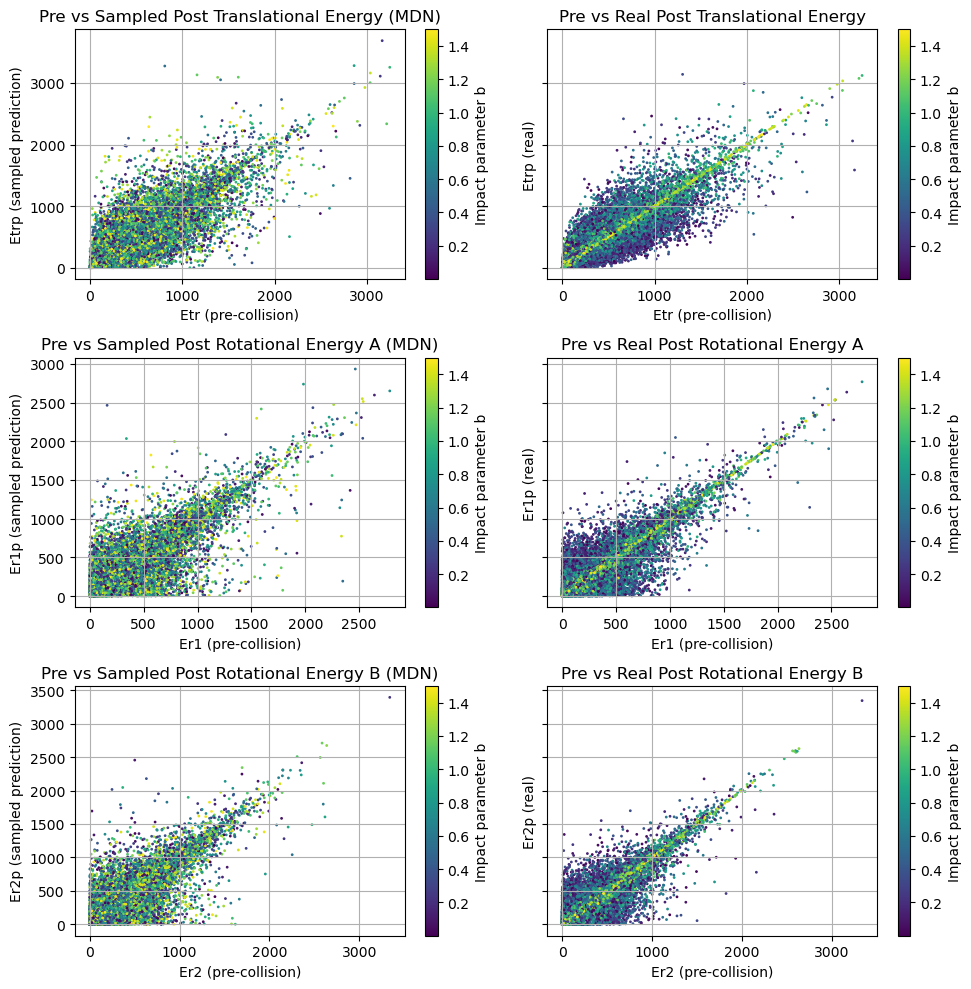

In [7]:


# Sample 1 value per point for plotting
Etrp_samp, Er1p_samp, Er2p_samp = mdn_sample_conserve(params, X, Ec, n_samples=1)
Etrp_samp_test, Er1p_samp_test, Er2p_samp_test = mdn_sample_conserve(params, X_test, Ec_test, n_samples=1)

# Make subplots: 3 rows (Etr, Er1, Er2) × 2 cols (Pred vs Real)
fig, axes = plt.subplots(3, 2, figsize=(10, 10), sharey='row',)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# --- Row 1: Translational energy ---
# Left: predicted
sc0 = axes[0, 0].scatter(data_test["Etr"], Etrp_samp_test, alpha=1, s=1, c=data_test["b"])
axes[0, 0].set_title("Pre vs Sampled Post Translational Energy (MDN)")
axes[0, 0].set_xlabel("Etr (pre-collision)")
axes[0, 0].set_ylabel("Etrp (sampled prediction)")
fig.colorbar(sc0, ax=axes[0, 0], label='Impact parameter b')
axes[0, 0].grid(True)

# Right: real
sc1 = axes[0, 1].scatter(data_test["Etr"], data_test["Etrp"], alpha=1, s=1, c=data_test["b"])
axes[0, 1].set_title("Pre vs Real Post Translational Energy")
axes[0, 1].set_xlabel("Etr (pre-collision)")
axes[0, 1].set_ylabel("Etrp (real)")
fig.colorbar(sc1, ax=axes[0, 1], label='Impact parameter b')
axes[0, 1].grid(True)

# --- Row 2: Rotational Energy A ---
sc2 = axes[1, 0].scatter(data_test["Er1"], Er1p_samp_test, alpha=1, s=1, c=data_test["b"])
axes[1, 0].set_title("Pre vs Sampled Post Rotational Energy A (MDN)")
axes[1, 0].set_xlabel("Er1 (pre-collision)")
axes[1, 0].set_ylabel("Er1p (sampled prediction)")
fig.colorbar(sc2, ax=axes[1, 0], label='Impact parameter b')
axes[1, 0].grid(True)

sc3 = axes[1, 1].scatter(data_test["Er1"], data_test["Er1p"], alpha=1, s=1, c=data_test["b"])
axes[1, 1].set_title("Pre vs Real Post Rotational Energy A")
axes[1, 1].set_xlabel("Er1 (pre-collision)")
axes[1, 1].set_ylabel("Er1p (real)")
fig.colorbar(sc3, ax=axes[1, 1], label='Impact parameter b')
axes[1, 1].grid(True)

# --- Row 3: Rotational Energy B ---
sc4 = axes[2, 0].scatter(data_test["Er2"], Er2p_samp_test, alpha=1, s=1, c=data_test["b"])
axes[2, 0].set_title("Pre vs Sampled Post Rotational Energy B (MDN)")
axes[2, 0].set_xlabel("Er2 (pre-collision)")
axes[2, 0].set_ylabel("Er2p (sampled prediction)")
fig.colorbar(sc4, ax=axes[2, 0], label='Impact parameter b')
axes[2, 0].grid(True)

sc5 = axes[2, 1].scatter(data_test["Er2"], data_test["Er2p"], alpha=1, s=1, c=data_test["b"])
axes[2, 1].set_title("Pre vs Real Post Rotational Energy B")
axes[2, 1].set_xlabel("Er2 (pre-collision)")
axes[2, 1].set_ylabel("Er2p (real)")
fig.colorbar(sc5, ax=axes[2, 1], label='Impact parameter b')
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

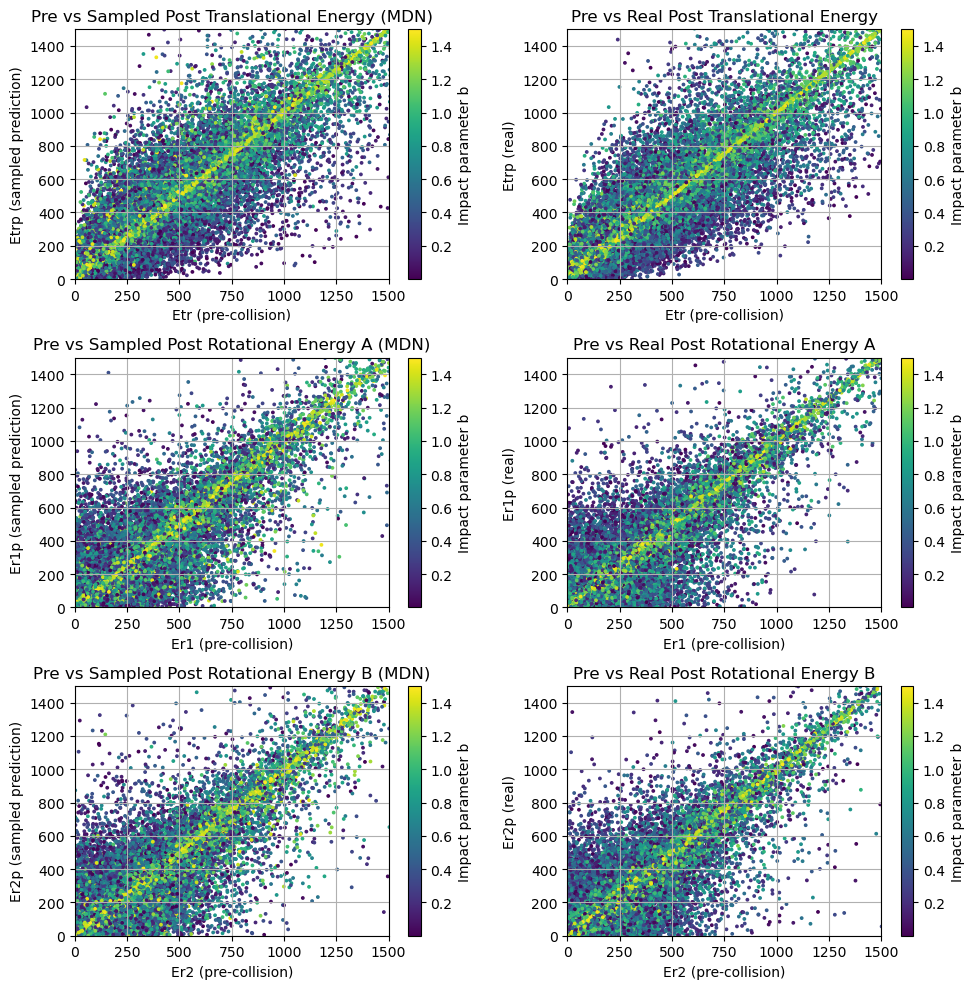

In [257]:
# Make subplots: 3 rows (Etr, Er1, Er2) × 2 cols (Pred vs Real)
fig, axes = plt.subplots(3, 2, figsize=(10, 10))
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# --- Row 1: Translational energy ---
# Left: predicted
sc0 = axes[0, 0].scatter(data_test["Etr"], Etrp_samp_test, alpha=1, s=3, c=data_test["b"])
axes[0, 0].set_title("Pre vs Sampled Post Translational Energy (MDN)")
axes[0, 0].set_xlabel("Etr (pre-collision)")
axes[0, 0].set_ylabel("Etrp (sampled prediction)")
fig.colorbar(sc0, ax=axes[0, 0], label='Impact parameter b')
axes[0, 0].set_xlim(0, 1500)
axes[0, 0].set_ylim(0, 1500)
axes[0, 0].grid(True)

# Right: real
sc1 = axes[0, 1].scatter(data_test["Etr"], data_test["Etrp"], alpha=1, s=3, c=data_test["b"])
axes[0, 1].set_title("Pre vs Real Post Translational Energy")
axes[0, 1].set_xlabel("Etr (pre-collision)")
axes[0, 1].set_ylabel("Etrp (real)")
fig.colorbar(sc1, ax=axes[0, 1], label='Impact parameter b')
axes[0, 1].set_xlim(0, 1500)
axes[0, 1].set_ylim(0, 1500)
axes[0, 1].grid(True)

# --- Row 2: Rotational Energy A ---
sc2 = axes[1, 0].scatter(data_test["Er1"], Er1p_samp_test, alpha=1, s=3, c=data_test["b"])
axes[1, 0].set_title("Pre vs Sampled Post Rotational Energy A (MDN)")
axes[1, 0].set_xlabel("Er1 (pre-collision)")
axes[1, 0].set_ylabel("Er1p (sampled prediction)")
fig.colorbar(sc2, ax=axes[1, 0], label='Impact parameter b')
axes[1, 0].set_xlim(0, 1500)
axes[1, 0].set_ylim(0, 1500)
axes[1, 0].grid(True)

sc3 = axes[1, 1].scatter(data_test["Er1"], data_test["Er1p"], alpha=1, s=3, c=data_test["b"])
axes[1, 1].set_title("Pre vs Real Post Rotational Energy A")
axes[1, 1].set_xlabel("Er1 (pre-collision)")
axes[1, 1].set_ylabel("Er1p (real)")
fig.colorbar(sc3, ax=axes[1, 1], label='Impact parameter b')
axes[1, 1].set_xlim(0, 1500)
axes[1, 1].set_ylim(0, 1500)
axes[1, 1].grid(True)

# --- Row 3: Rotational Energy B ---
sc4 = axes[2, 0].scatter(data_test["Er2"], Er2p_samp_test, alpha=1, s=3, c=data_test["b"])
axes[2, 0].set_title("Pre vs Sampled Post Rotational Energy B (MDN)")
axes[2, 0].set_xlabel("Er2 (pre-collision)")
axes[2, 0].set_ylabel("Er2p (sampled prediction)")
fig.colorbar(sc4, ax=axes[2, 0], label='Impact parameter b')
axes[2, 0].set_xlim(0, 1500)
axes[2, 0].set_ylim(0, 1500)
axes[2, 0].grid(True)

sc5 = axes[2, 1].scatter(data_test["Er2"], data_test["Er2p"], alpha=1, s=3, c=data_test["b"])
axes[2, 1].set_title("Pre vs Real Post Rotational Energy B")
axes[2, 1].set_xlabel("Er2 (pre-collision)")
axes[2, 1].set_ylabel("Er2p (real)")
fig.colorbar(sc5, ax=axes[2, 1], label='Impact parameter b')
axes[2, 1].set_xlim(0, 1500)
axes[2, 1].set_ylim(0, 1500)
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

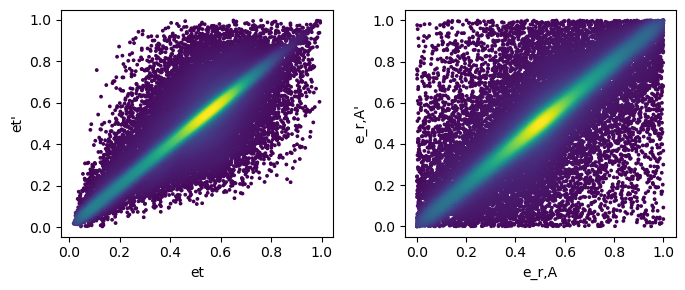

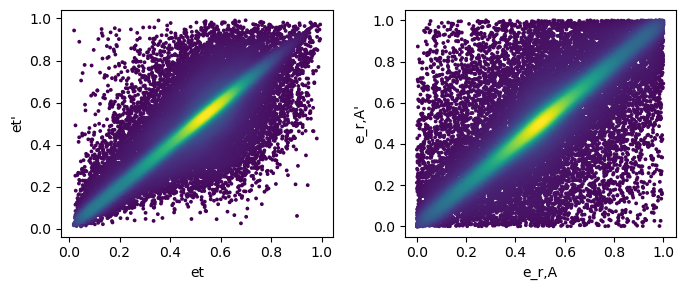

In [163]:
# --- Pre-collision values ---
Etr = data_test["Etr"].values
Er1 = data_test["Er1"].values
Er2 = data_test["Er2"].values

Ec = Etr + Er1 + Er2
E_rot_total = Er1 + Er2

# Calculate energy fractions (precollisional)
eps_t = Etr / (Ec + 1e-15)
eps_r_A = Er1 / (E_rot_total + 1e-15)

# --- Post-collision values (for training targets) ---
Etrp = data_test["Etrp"].values
Er1p = data_test["Er1p"].values
Er2p = data_test["Er2p"].values

# Post-collision Ec is the same as pre-collision Ec
E_rot_p_total = Er1p + Er2p

# Calculate postcollisional energy fractions (targets)
eps_t_prime = Etrp / (Ec + 1e-15)
eps_r_A_prime = Er1p / (E_rot_p_total + 1e-15)

plt.figure(figsize=[7,3])

plt.subplot(1,2,1)
plt.xlabel("et")
plt.ylabel("et'")
dscatter(eps_t,eps_t_prime)


plt.subplot(1,2,2)
plt.xlabel("e_r,A")
plt.ylabel("e_r,A'")
dscatter(eps_r_A,eps_r_A_prime)

plt.tight_layout()
plt.show()

# --- Pre-collision values ---
Etr = data_test["Etr"].values
Er1 = data_test["Er1"].values
Er2 = data_test["Er2"].values

Ec = Etr + Er1 + Er2
E_rot_total = Er1 + Er2

# Calculate energy fractions (precollisional)
eps_t = Etr / (Ec + 1e-15)
eps_r_A = Er1 / (E_rot_total + 1e-15)

# --- Post-collision values (for training targets) ---
Etrp = Etrp_samp_test.flatten()
Er1p = Er1p_samp_test.flatten()
Er2p = Er2p_samp_test.flatten()

# Post-collision Ec is the same as pre-collision Ec
E_rot_p_total = Er1p + Er2p

# Calculate postcollisional energy fractions (targets)
eps_t_prime = Etrp / (Ec + 1e-15)
eps_r_A_prime = Er1p / (E_rot_p_total + 1e-15)

plt.figure(figsize=[7,3])

plt.subplot(1,2,1)
plt.xlabel("et")
plt.ylabel("et'")
dscatter(eps_t,eps_t_prime)


plt.subplot(1,2,2)
plt.xlabel("e_r,A")
plt.ylabel("e_r,A'")
dscatter(eps_r_A,eps_r_A_prime)

plt.tight_layout()
plt.show()

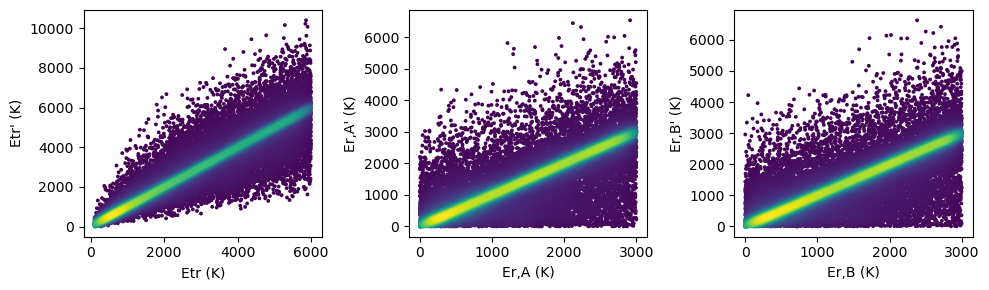

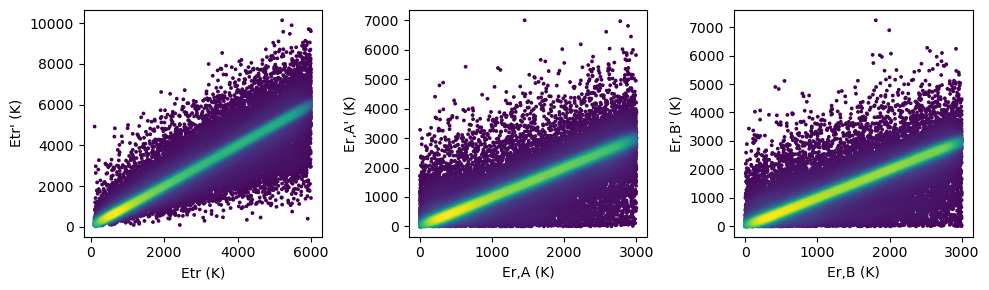

In [164]:
plt.figure(figsize=[10,3])

plt.subplot(1,3,1)
plt.xlabel("Etr (K)")
plt.ylabel("Etr' (K)")
dscatter(data_test['Etr'],data_test['Etrp'])


plt.subplot(1,3,2)
plt.xlabel("Er,A (K)")
plt.ylabel("Er,A' (K)")
dscatter(data_test['Er1'],data_test['Er1p'])


plt.subplot(1,3,3)
plt.xlabel("Er,B (K)")
plt.ylabel("Er,B' (K)")
dscatter(data_test['Er2'],data_test['Er2p'])
plt.tight_layout()
plt.show()

plt.figure(figsize=[10,3])

plt.subplot(1,3,1)
plt.xlabel("Etr (K)")
plt.ylabel("Etr' (K)")
dscatter(data_test['Etr'],Etrp_samp_test.squeeze())


plt.subplot(1,3,2)
plt.xlabel("Er,A (K)")
plt.ylabel("Er,A' (K)")
dscatter(data_test['Er1'],Er1p_samp_test.squeeze())


plt.subplot(1,3,3)
plt.xlabel("Er,B (K)")
plt.ylabel("Er,B' (K)")
dscatter(data_test['Er2'],Er2p_samp_test.squeeze())
plt.tight_layout()
plt.show()

# Independent outputs (seperate alpha)

In [247]:
import os
import math
import numpy as np
import pandas as pd
import jax
import jax.numpy as jnp
from jax import random, jit, value_and_grad
from jax.example_libraries import stax, optimizers
import matplotlib.pyplot as plt

# -------------------------- Utilities --------------------------
def logit(x):
    x = jnp.clip(x, 1e-6, 1 - 1e-6)
    return jnp.log(x) - jnp.log1p(-x)

def inv_logit(z):
    return jnp.clip(1.0 / (1.0 + jnp.exp(-z)), 1e-12, 1 - 1e-12)

def preprocess_df(df):
    """
    Preprocess according to the paper's variable definitions:
    - Ec: total collision energy
    - eps_t: translational energy fraction  
    - eps_r_A: rotational energy fraction for molecule A
    """
    # Epsilon to prevent division by zero if total rotational energy is zero
    epsilon = 1e-12

    # --- Pre-collision values ---
    Etr = df["Etr"].values
    Er1 = df["Er1"].values
    Er2 = df["Er2"].values
    
    Ec = Etr + Er1 + Er2
    E_rot_total = Er1 + Er2
    
    # Calculate energy fractions (precollisional)
    eps_t = Etr / (Ec + epsilon)
    eps_r_A = Er1 / (E_rot_total + epsilon)
    
    # --- Post-collision values (for training targets) ---
    Etrp = df["Etrp"].values
    Er1p = df["Er1p"].values
    Er2p = df["Er2p"].values
    
    # Post-collision Ec is the same as pre-collision Ec
    E_rot_p_total = Er1p + Er2p

    # Calculate postcollisional energy fractions (targets)
    eps_t_prime = Etrp / (Ec + epsilon)
    eps_r_A_prime = Er1p / (E_rot_p_total + epsilon)
    
    # Apply transformations as per Equation 4.15
    x = np.stack([
        np.log(Ec + epsilon),      # E_c^(p)
        logit(eps_t),              # eps_t^(p) 
        logit(eps_r_A),            # eps_r,A^(p)
        #np.exp(df["b"].values)     # b^(p)  # Uncomment if including impact parameter
    ], axis=-1)
    
    y = np.stack([
        logit(eps_t_prime),        # eps_t'^(p)
        logit(eps_r_A_prime)       # eps_r,A'^(p)
    ], axis=-1)
    
    return x.astype(np.float32), y.astype(np.float32), Ec

# -------------------------- Load and split dataset --------------------------
X, Y, Ec = preprocess_df(data)
X_test, Y_test, Ec_test = preprocess_df(data_test)
N = X.shape[0]


X_train, Y_train = X, Y
X_val, Y_val = X_test, Y_test
X_test, Y_test = X_test, Y_test

# -------------------------- MDN model --------------------------

# --- Replace previous MDN_init, unpack_mdn_params, mdn_nll with these ---

def MDN_init(in_dim, hidden_size=8, M=20):
    """
    MDN that outputs two independent 1-D mixtures for the two targets.
    Each mixture has M components and for each component we output:
      alpha_raw, mu, sigma_raw  (3 numbers)  -> per output dimension
    So total outputs = M * 3 * 2 = M * 6
    """
    init_fun, apply_fun = stax.serial(
        stax.Dense(hidden_size),
        stax.Relu,
        stax.Dense(M * 6)   # M components * (alpha, mu, sigma) * 2 outputs
    )
    return init_fun, apply_fun, M

def unpack_mdn_params(z, M):
    """
    z: (B, M*6) -> reshape to (B, M, 6)
    Layout per component: [alpha1_raw, mu1, sigma1_raw, alpha2_raw, mu2, sigma2_raw]
    Returns:
      alpha1: (B, M)  - softmaxed weights for output1
      mu1:    (B, M)  - means for output1
      sigma1: (B, M)  - stds for output1 (positive)
      alpha2, mu2, sigma2 - analogous for output2
    """
    B = z.shape[0]
    z = z.reshape(B, M, 6)
    # split
    alpha1_raw = z[..., 0]   # (B, M)
    mu1 = z[..., 1]          # (B, M)
    sigma1_raw = z[..., 2]   # (B, M)
    alpha2_raw = z[..., 3]   # (B, M)
    mu2 = z[..., 4]          # (B, M)
    sigma2_raw = z[..., 5]   # (B, M)
    
    # constraints
    alpha1 = jax.nn.softmax(alpha1_raw, axis=-1) + 1e-12
    alpha2 = jax.nn.softmax(alpha2_raw, axis=-1) + 1e-12
    sigma1 = jax.nn.softplus(sigma1_raw) + 1e-8
    sigma2 = jax.nn.softplus(sigma2_raw) + 1e-8

    return alpha1, mu1, sigma1, alpha2, mu2, sigma2

@jit
def mdn_nll(params, x, y):
    """
    Negative log-likelihood assuming independent mixtures for y[:,0] and y[:,1].
    y shape: (B, 2)
    """
    z = apply_fun(params, x)        # (B, M*6)
    alpha1, mu1, sigma1, alpha2, mu2, sigma2 = unpack_mdn_params(z, M)

    # targets
    y1 = y[:, 0]   # (B,)
    y2 = y[:, 1]   # (B,)

    # Expand / broadcast to (B, M)
    # mu1, sigma1 already (B, M)
    # y1[:, None] -> (B, 1) broadcasts to (B, M)
    var1 = sigma1 ** 2
    var2 = sigma2 ** 2

    # log probability per component for output1: (B, M)
    log_comp1 = -0.5 * ((y1[:, None] - mu1) ** 2 / var1) - 0.5 * jnp.log(2 * math.pi * var1)
    # mix with weights
    log_mix1 = jnp.log(alpha1) + log_comp1
    # stable log-sum-exp over components axis
    max1 = jnp.max(log_mix1, axis=-1, keepdims=True)               # (B,1)
    lse1 = max1 + jnp.log(jnp.sum(jnp.exp(log_mix1 - max1), axis=-1, keepdims=True))  # (B,1)
    lse1 = jnp.squeeze(lse1, axis=-1)  # (B,)

    # same for output2
    log_comp2 = -0.5 * ((y2[:, None] - mu2) ** 2 / var2) - 0.5 * jnp.log(2 * math.pi * var2)
    log_mix2 = jnp.log(alpha2) + log_comp2
    max2 = jnp.max(log_mix2, axis=-1, keepdims=True)
    lse2 = max2 + jnp.log(jnp.sum(jnp.exp(log_mix2 - max2), axis=-1, keepdims=True))
    lse2 = jnp.squeeze(lse2, axis=-1)

    # total log prob under independence: log p(y) = log p(y1) + log p(y2)
    logp = lse1 + lse2  # (B,)

    # negative mean log-likelihood
    return -jnp.mean(logp)

# -------------------------- Training setup --------------------------
# Use paper's hyperparameters
M = 20  # 20 Optimized number of mixture components # with b this can be smaller than 20~3, less complicated distribution
learning_rate = 1e-4  # Paper uses 1e-4
batch_size = 1024   # Paper uses 10,000 out of 1.000.000

init_fun, apply_fun, M = MDN_init(X.shape[1], hidden_size=8, M=M) # increase hidden size when adding b ~ 256 (mainly when using less mixtures)
_, params = init_fun(random.PRNGKey(42), (-1, X.shape[1]))

# ADAM optimizer
opt_init, opt_update, get_params = optimizers.adam(learning_rate)
opt_state = opt_init(params)

@jit
def update(i, opt_state, x, y):
    params = get_params(opt_state)
    loss, grads = value_and_grad(mdn_nll)(params, x, y)
    return opt_update(i, grads, opt_state), loss

# -------------------------- Training loop --------------------------
def batch_indices(N, batch_size):
    """Precompute batch indices for faster iteration."""
    idx = np.random.permutation(N)
    return [idx[i:i+batch_size] for i in range(0, N, batch_size)]

# Early stopping variables
best_val_loss = float('inf')
patience = 10
patience_counter = 0
best_params = None

all_train_losses = []  # store per-iteration train loss
all_val_losses = []    # store per-epoch val loss

for epoch in range(1000):
    # Precompute batch indices once per epoch
    batches = batch_indices(len(X_train), batch_size)
    train_losses = []

    for i, batch_idx in enumerate(batches):
        xb, yb = X_train[batch_idx], Y_train[batch_idx]
        step_idx = epoch * len(batches) + i
        opt_state, loss = update(step_idx, opt_state, xb, yb)
        train_losses.append(float(loss))

    all_train_losses.append(np.mean(train_losses))  # record per iteration

    # Validation
    val_loss = float(mdn_nll(get_params(opt_state), X_val, Y_val))
    all_val_losses.append(val_loss)  # record per epoch

    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_params = get_params(opt_state)
        patience_counter = 0
    else:
        patience_counter += 1

    if epoch % 10 == 0:
        print(f"Epoch {epoch+1}: train_loss={np.mean(train_losses):.4f}, val_loss={val_loss:.4f}")
    
    if patience_counter >= patience:
        print(f"Early stopping at epoch {epoch+1}")
        break

# Use best parameters
params = best_params if best_params is not None else get_params(opt_state)
test_loss = float(mdn_nll(params, X_test, Y_test))
print(f"Final test NLL: {test_loss:.4f}")

def mdn_sample_conserve(params, X, Ec, n_samples=1, key=random.PRNGKey(0)):
    """
    Sample post-collision energy fractions from the *independent* 1D mixtures
    (one mixture for eps_t' and one for eps_rA'), then reconstruct Etr', Er1', Er2'
    so that total energy is conserved: Etr'+Er1'+Er2' = Ec.

    Returns:
      Etr_p, Er1_p, Er2_p with shape (N, n_samples)
    """
    z = apply_fun(params, X)
    alpha1, mu1, sigma1, alpha2, mu2, sigma2 = unpack_mdn_params(z, M)

    N, M_ = alpha1.shape
    key_comp1, key_comp2, key_noise1, key_noise2 = random.split(key, 4)

    # ----- Sample mixture component for each output independently -----
    comp_idx1 = random.categorical(key_comp1, jnp.log(alpha1), shape=(n_samples, N))  # eps_t' mixture
    comp_idx2 = random.categorical(key_comp2, jnp.log(alpha2), shape=(n_samples, N))  # eps_rA' mixture

    # ----- Gather parameters for chosen components -----
    mu1_s    = mu1[jnp.arange(N)[:, None], comp_idx1.T]       # (N, n_samples)
    sigma1_s = sigma1[jnp.arange(N)[:, None], comp_idx1.T]
    mu2_s    = mu2[jnp.arange(N)[:, None], comp_idx2.T]
    sigma2_s = sigma2[jnp.arange(N)[:, None], comp_idx2.T]

    # ----- Sample Gaussian noise -----
    noise1 = random.normal(key_noise1, mu1_s.shape)
    noise2 = random.normal(key_noise2, mu2_s.shape)

    draws1 = mu1_s + noise1 * sigma1_s  # eps_t' samples (logit-space)
    draws2 = mu2_s + noise2 * sigma2_s  # eps_rA' samples (logit-space)

    # Map back to [0,1] via inverse logit
    eps_t_p  = inv_logit(draws1)  # shape (N, n_samples)
    eps_rA_p = inv_logit(draws2)

    # Expand Ec for broadcasting
    Ec_exp = Ec[:, None]  # shape (N, 1)

    # ---- Energy reconstruction with conservation ----
    Etr_p       = eps_t_p * Ec_exp
    Erot_p_tot  = (1.0 - eps_t_p) * Ec_exp
    Er1_p       = eps_rA_p * Erot_p_tot
    Er2_p       = (1.0 - eps_rA_p) * Erot_p_tot

    return Etr_p, Er1_p, Er2_p

Epoch 1: train_loss=3.8333, val_loss=3.4993
Epoch 11: train_loss=2.6399, val_loss=2.6102
Epoch 21: train_loss=2.6146, val_loss=2.5847
Epoch 31: train_loss=2.6040, val_loss=2.5823
Epoch 41: train_loss=2.5972, val_loss=2.5764
Epoch 51: train_loss=2.5909, val_loss=2.5720
Epoch 61: train_loss=2.5911, val_loss=2.5689
Epoch 71: train_loss=2.5876, val_loss=2.5739
Epoch 81: train_loss=2.5863, val_loss=2.5643
Epoch 91: train_loss=2.5860, val_loss=2.5760
Epoch 101: train_loss=2.5831, val_loss=2.5631
Early stopping at epoch 108
Final test NLL: 2.5620


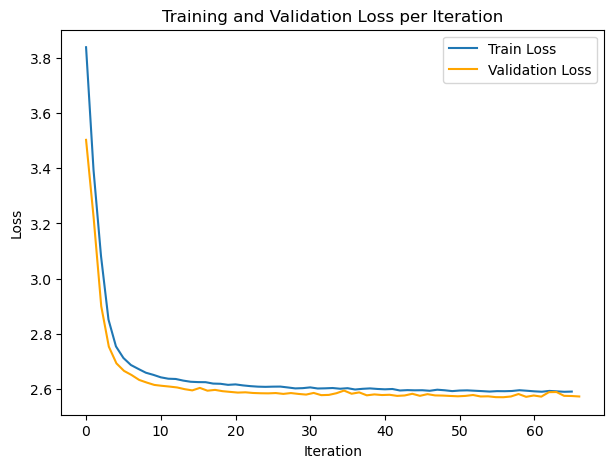

In [237]:
# Plot training and validation loss
plt.figure(figsize=(7,5))
plt.plot(all_train_losses, label="Train Loss")
val_iters = np.linspace(0, len(all_train_losses), len(all_val_losses))
plt.plot(val_iters, all_val_losses, label="Validation Loss", color="orange")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.title("Training and Validation Loss per Iteration")
plt.legend()
plt.show()

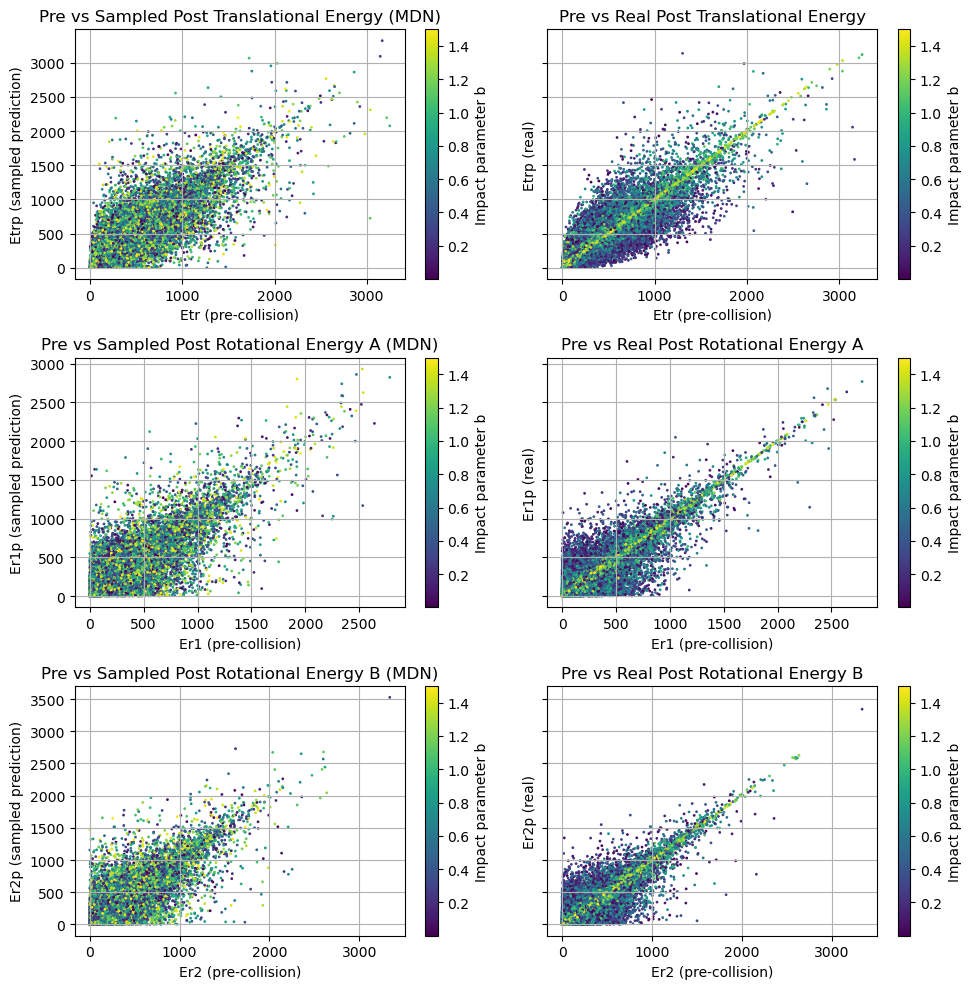

In [238]:


# Sample 1 value per point for plotting
Etrp_samp, Er1p_samp, Er2p_samp = mdn_sample_conserve(params, X, Ec, n_samples=1)
Etrp_samp_test, Er1p_samp_test, Er2p_samp_test = mdn_sample_conserve(params, X_test, Ec_test, n_samples=1)

# Make subplots: 3 rows (Etr, Er1, Er2) × 2 cols (Pred vs Real)
fig, axes = plt.subplots(3, 2, figsize=(10, 10), sharey='row',)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# --- Row 1: Translational energy ---
# Left: predicted
sc0 = axes[0, 0].scatter(data_test["Etr"], Etrp_samp_test, alpha=1, s=1, c=data_test["b"])
axes[0, 0].set_title("Pre vs Sampled Post Translational Energy (MDN)")
axes[0, 0].set_xlabel("Etr (pre-collision)")
axes[0, 0].set_ylabel("Etrp (sampled prediction)")
fig.colorbar(sc0, ax=axes[0, 0], label='Impact parameter b')
axes[0, 0].grid(True)

# Right: real
sc1 = axes[0, 1].scatter(data_test["Etr"], data_test["Etrp"], alpha=1, s=1, c=data_test["b"])
axes[0, 1].set_title("Pre vs Real Post Translational Energy")
axes[0, 1].set_xlabel("Etr (pre-collision)")
axes[0, 1].set_ylabel("Etrp (real)")
fig.colorbar(sc1, ax=axes[0, 1], label='Impact parameter b')
axes[0, 1].grid(True)

# --- Row 2: Rotational Energy A ---
sc2 = axes[1, 0].scatter(data_test["Er1"], Er1p_samp_test, alpha=1, s=1, c=data_test["b"])
axes[1, 0].set_title("Pre vs Sampled Post Rotational Energy A (MDN)")
axes[1, 0].set_xlabel("Er1 (pre-collision)")
axes[1, 0].set_ylabel("Er1p (sampled prediction)")
fig.colorbar(sc2, ax=axes[1, 0], label='Impact parameter b')
axes[1, 0].grid(True)

sc3 = axes[1, 1].scatter(data_test["Er1"], data_test["Er1p"], alpha=1, s=1, c=data_test["b"])
axes[1, 1].set_title("Pre vs Real Post Rotational Energy A")
axes[1, 1].set_xlabel("Er1 (pre-collision)")
axes[1, 1].set_ylabel("Er1p (real)")
fig.colorbar(sc3, ax=axes[1, 1], label='Impact parameter b')
axes[1, 1].grid(True)

# --- Row 3: Rotational Energy B ---
sc4 = axes[2, 0].scatter(data_test["Er2"], Er2p_samp_test, alpha=1, s=1, c=data_test["b"])
axes[2, 0].set_title("Pre vs Sampled Post Rotational Energy B (MDN)")
axes[2, 0].set_xlabel("Er2 (pre-collision)")
axes[2, 0].set_ylabel("Er2p (sampled prediction)")
fig.colorbar(sc4, ax=axes[2, 0], label='Impact parameter b')
axes[2, 0].grid(True)

sc5 = axes[2, 1].scatter(data_test["Er2"], data_test["Er2p"], alpha=1, s=1, c=data_test["b"])
axes[2, 1].set_title("Pre vs Real Post Rotational Energy B")
axes[2, 1].set_xlabel("Er2 (pre-collision)")
axes[2, 1].set_ylabel("Er2p (real)")
fig.colorbar(sc5, ax=axes[2, 1], label='Impact parameter b')
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

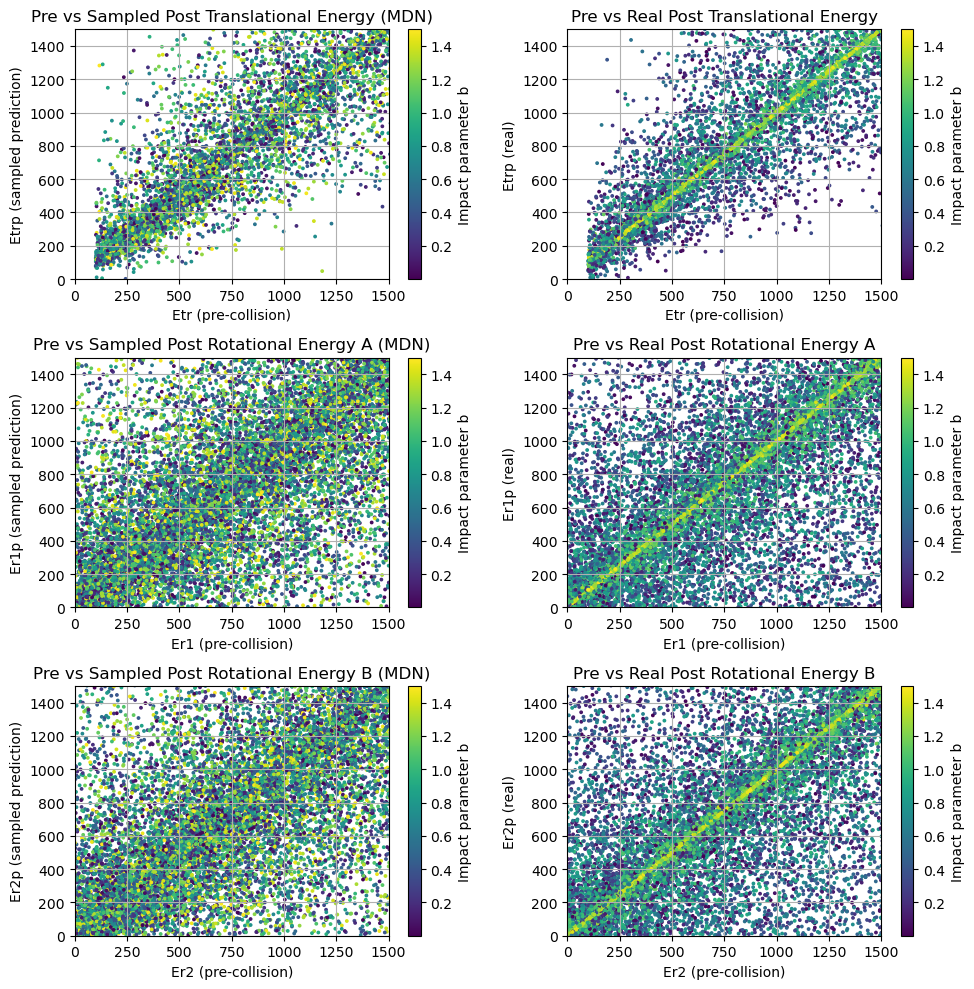

In [154]:
# Make subplots: 3 rows (Etr, Er1, Er2) × 2 cols (Pred vs Real)
fig, axes = plt.subplots(3, 2, figsize=(10, 10))
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# --- Row 1: Translational energy ---
# Left: predicted
sc0 = axes[0, 0].scatter(data_test["Etr"], Etrp_samp_test, alpha=1, s=3, c=data_test["b"])
axes[0, 0].set_title("Pre vs Sampled Post Translational Energy (MDN)")
axes[0, 0].set_xlabel("Etr (pre-collision)")
axes[0, 0].set_ylabel("Etrp (sampled prediction)")
fig.colorbar(sc0, ax=axes[0, 0], label='Impact parameter b')
axes[0, 0].set_xlim(0, 1500)
axes[0, 0].set_ylim(0, 1500)
axes[0, 0].grid(True)

# Right: real
sc1 = axes[0, 1].scatter(data_test["Etr"], data_test["Etrp"], alpha=1, s=3, c=data_test["b"])
axes[0, 1].set_title("Pre vs Real Post Translational Energy")
axes[0, 1].set_xlabel("Etr (pre-collision)")
axes[0, 1].set_ylabel("Etrp (real)")
fig.colorbar(sc1, ax=axes[0, 1], label='Impact parameter b')
axes[0, 1].set_xlim(0, 1500)
axes[0, 1].set_ylim(0, 1500)
axes[0, 1].grid(True)

# --- Row 2: Rotational Energy A ---
sc2 = axes[1, 0].scatter(data_test["Er1"], Er1p_samp_test, alpha=1, s=3, c=data_test["b"])
axes[1, 0].set_title("Pre vs Sampled Post Rotational Energy A (MDN)")
axes[1, 0].set_xlabel("Er1 (pre-collision)")
axes[1, 0].set_ylabel("Er1p (sampled prediction)")
fig.colorbar(sc2, ax=axes[1, 0], label='Impact parameter b')
axes[1, 0].set_xlim(0, 1500)
axes[1, 0].set_ylim(0, 1500)
axes[1, 0].grid(True)

sc3 = axes[1, 1].scatter(data_test["Er1"], data_test["Er1p"], alpha=1, s=3, c=data_test["b"])
axes[1, 1].set_title("Pre vs Real Post Rotational Energy A")
axes[1, 1].set_xlabel("Er1 (pre-collision)")
axes[1, 1].set_ylabel("Er1p (real)")
fig.colorbar(sc3, ax=axes[1, 1], label='Impact parameter b')
axes[1, 1].set_xlim(0, 1500)
axes[1, 1].set_ylim(0, 1500)
axes[1, 1].grid(True)

# --- Row 3: Rotational Energy B ---
sc4 = axes[2, 0].scatter(data_test["Er2"], Er2p_samp_test, alpha=1, s=3, c=data_test["b"])
axes[2, 0].set_title("Pre vs Sampled Post Rotational Energy B (MDN)")
axes[2, 0].set_xlabel("Er2 (pre-collision)")
axes[2, 0].set_ylabel("Er2p (sampled prediction)")
fig.colorbar(sc4, ax=axes[2, 0], label='Impact parameter b')
axes[2, 0].set_xlim(0, 1500)
axes[2, 0].set_ylim(0, 1500)
axes[2, 0].grid(True)

sc5 = axes[2, 1].scatter(data_test["Er2"], data_test["Er2p"], alpha=1, s=3, c=data_test["b"])
axes[2, 1].set_title("Pre vs Real Post Rotational Energy B")
axes[2, 1].set_xlabel("Er2 (pre-collision)")
axes[2, 1].set_ylabel("Er2p (real)")
fig.colorbar(sc5, ax=axes[2, 1], label='Impact parameter b')
axes[2, 1].set_xlim(0, 1500)
axes[2, 1].set_ylim(0, 1500)
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

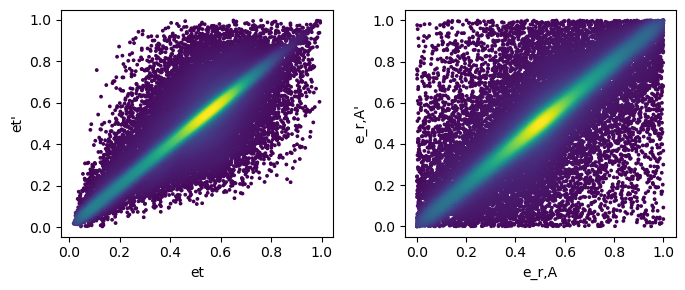

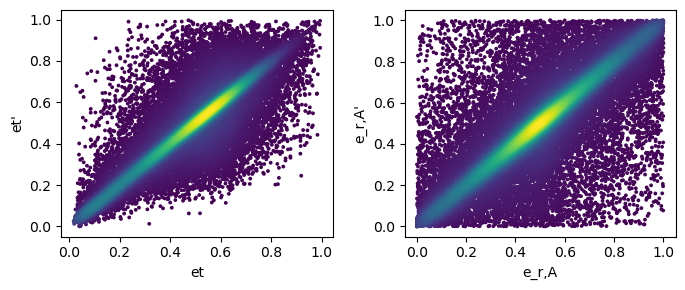

In [155]:
# --- Pre-collision values ---
Etr = data_test["Etr"].values
Er1 = data_test["Er1"].values
Er2 = data_test["Er2"].values

Ec = Etr + Er1 + Er2
E_rot_total = Er1 + Er2

# Calculate energy fractions (precollisional)
eps_t = Etr / (Ec + 1e-15)
eps_r_A = Er1 / (E_rot_total + 1e-15)

# --- Post-collision values (for training targets) ---
Etrp = data_test["Etrp"].values
Er1p = data_test["Er1p"].values
Er2p = data_test["Er2p"].values

# Post-collision Ec is the same as pre-collision Ec
E_rot_p_total = Er1p + Er2p

# Calculate postcollisional energy fractions (targets)
eps_t_prime = Etrp / (Ec + 1e-15)
eps_r_A_prime = Er1p / (E_rot_p_total + 1e-15)

plt.figure(figsize=[7,3])

plt.subplot(1,2,1)
plt.xlabel("et")
plt.ylabel("et'")
dscatter(eps_t,eps_t_prime)


plt.subplot(1,2,2)
plt.xlabel("e_r,A")
plt.ylabel("e_r,A'")
dscatter(eps_r_A,eps_r_A_prime)

plt.tight_layout()
plt.show()

# --- Pre-collision values ---
Etr = data_test["Etr"].values
Er1 = data_test["Er1"].values
Er2 = data_test["Er2"].values

Ec = Etr + Er1 + Er2
E_rot_total = Er1 + Er2

# Calculate energy fractions (precollisional)
eps_t = Etr / (Ec + 1e-15)
eps_r_A = Er1 / (E_rot_total + 1e-15)

# --- Post-collision values (for training targets) ---
Etrp = Etrp_samp_test.flatten()
Er1p = Er1p_samp_test.flatten()
Er2p = Er2p_samp_test.flatten()

# Post-collision Ec is the same as pre-collision Ec
E_rot_p_total = Er1p + Er2p

# Calculate postcollisional energy fractions (targets)
eps_t_prime = Etrp / (Ec + 1e-15)
eps_r_A_prime = Er1p / (E_rot_p_total + 1e-15)

plt.figure(figsize=[7,3])

plt.subplot(1,2,1)
plt.xlabel("et")
plt.ylabel("et'")
dscatter(eps_t,eps_t_prime)


plt.subplot(1,2,2)
plt.xlabel("e_r,A")
plt.ylabel("e_r,A'")
dscatter(eps_r_A,eps_r_A_prime)

plt.tight_layout()
plt.show()

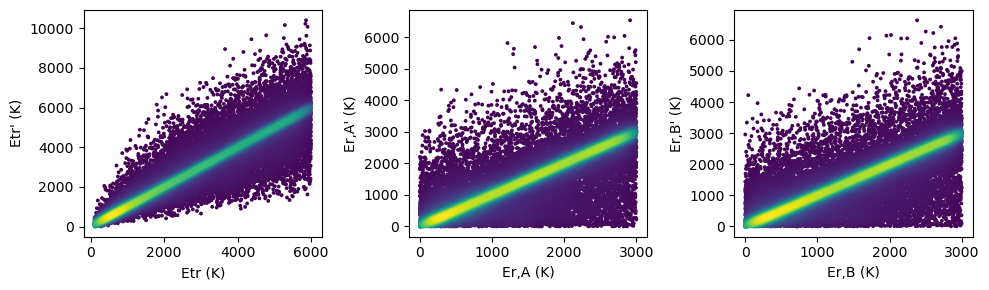

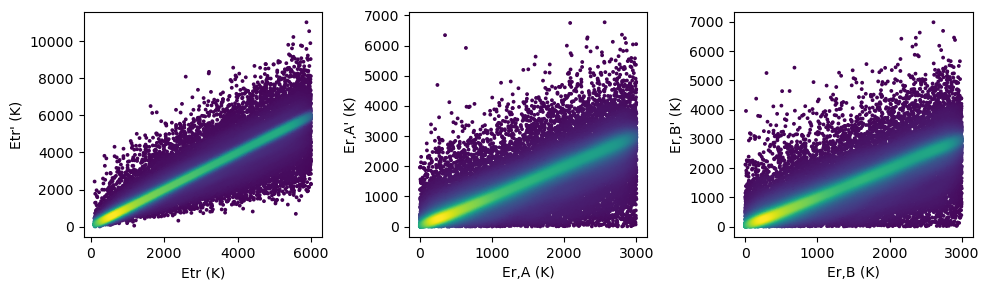

In [156]:
plt.figure(figsize=[10,3])

plt.subplot(1,3,1)
plt.xlabel("Etr (K)")
plt.ylabel("Etr' (K)")
dscatter(data_test['Etr'],data_test['Etrp'])


plt.subplot(1,3,2)
plt.xlabel("Er,A (K)")
plt.ylabel("Er,A' (K)")
dscatter(data_test['Er1'],data_test['Er1p'])


plt.subplot(1,3,3)
plt.xlabel("Er,B (K)")
plt.ylabel("Er,B' (K)")
dscatter(data_test['Er2'],data_test['Er2p'])
plt.tight_layout()
plt.show()

plt.figure(figsize=[10,3])

plt.subplot(1,3,1)
plt.xlabel("Etr (K)")
plt.ylabel("Etr' (K)")
dscatter(data_test['Etr'],Etrp_samp_test.squeeze())


plt.subplot(1,3,2)
plt.xlabel("Er,A (K)")
plt.ylabel("Er,A' (K)")
dscatter(data_test['Er1'],Er1p_samp_test.squeeze())


plt.subplot(1,3,3)
plt.xlabel("Er,B (K)")
plt.ylabel("Er,B' (K)")
dscatter(data_test['Er2'],Er2p_samp_test.squeeze())
plt.tight_layout()
plt.show()

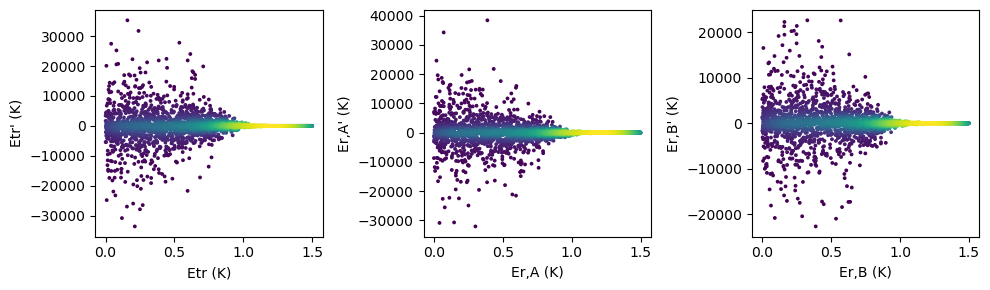

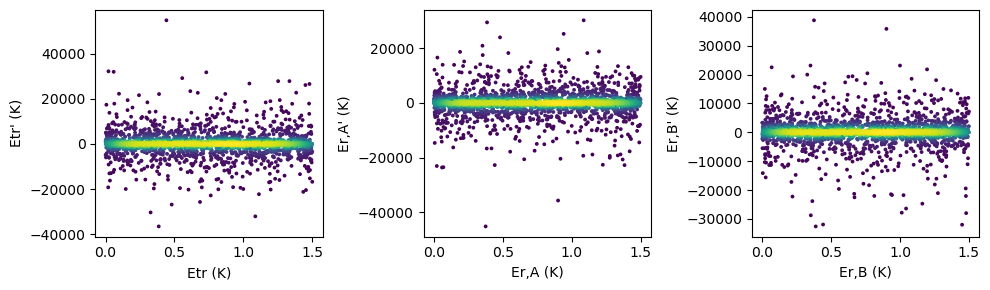

In [23]:
plt.figure(figsize=[10,3])

plt.subplot(1,3,1)
plt.xlabel("Etr (K)")
plt.ylabel("Etr' (K)")
dscatter(data_test['b'],data_test['Etrp'] - data_test['Etr'])


plt.subplot(1,3,2)
plt.xlabel("Er,A (K)")
plt.ylabel("Er,A' (K)")
dscatter(data_test['b'],data_test['Er1p']-data_test['Er1'])


plt.subplot(1,3,3)
plt.xlabel("Er,B (K)")
plt.ylabel("Er,B' (K)")
dscatter(data_test['b'],data_test['Er2p']-data_test['Er2'])
plt.tight_layout()
plt.show()

plt.figure(figsize=[10,3])

plt.subplot(1,3,1)
plt.xlabel("Etr (K)")
plt.ylabel("Etr' (K)")
dscatter(data_test['b'],Etrp_samp_test.squeeze() - data_test['Etr'])


plt.subplot(1,3,2)
plt.xlabel("Er,A (K)")
plt.ylabel("Er,A' (K)")
dscatter(data_test['b'],Er1p_samp_test.squeeze()-data_test['Er1'])


plt.subplot(1,3,3)
plt.xlabel("Er,B (K)")
plt.ylabel("Er,B' (K)")
dscatter(data_test['b'],Er2p_samp_test.squeeze()-data_test['Er2'])
plt.tight_layout()
plt.show()

# symmetric GMM

In [42]:
import jax
import jax.numpy as jnp
from jax.scipy.stats import norm, multivariate_normal
import matplotlib.pyplot as plt
from tqdm.notebook import trange # For a nice progress bar


class SymmetricGMM:
    """
    A Gaussian Mixture Model symmetric around the x=y line, trainable with EM.
    """
    def __init__(self):
        """Initializes the model. Parameters will be set after fitting."""
        self.weights = None
        self.means = None
        self.covariances = None
        self.n_base_components = None
        self.n_components = None
        self.converged_ = False
        self.log_likelihood_history_ = []

    def fit(self, X, n_base_components, n_iterations=100, tol=1e-4, reg_covar=1e-6, key=jax.random.PRNGKey(0)):
        """
        Fits the GMM to the data using a symmetric Expectation-Maximization algorithm.

        Args:
            X (jnp.ndarray): The training data, shape (n_samples, 2).
            n_base_components (int): The number of symmetric modes (K). The total
                                     number of components will be 2*K.
            n_iterations (int): The maximum number of EM iterations.
            tol (float): The convergence threshold for the log-likelihood.
            reg_covar (float): A small value added to the diagonal of covariances
                               to ensure they are non-singular.
            key (jax.random.PRNGKey): JAX random key for initialization.

        Returns:
            self: The fitted model instance.
        """
        self.n_base_components = n_base_components
        n_samples = X.shape[0]

        # 1. Initialize base parameters
        key, subkey = jax.random.split(key)
        base_weights, base_means, base_covariances = self._initialize_params(X, subkey)

        prev_log_likelihood = -jnp.inf
        
        pbar = trange(n_iterations, desc="EM Iterations")
        for i in pbar:
            # Create full symmetric parameters from base
            self.weights, self.means, self.covariances = self._create_symmetric_params(
                base_weights, base_means, base_covariances
            )
            self.n_components = len(self.weights)

            # 2. E-Step: Calculate responsibilities and log-likelihood
            log_responsibilities, log_likelihood = self._e_step(X)
            responsibilities = jnp.exp(log_responsibilities)
            self.log_likelihood_history_.append(log_likelihood)

            # 3. M-Step: Update base parameters using symmetric update rules
            base_weights, base_means, base_covariances = self._m_step(X, responsibilities, reg_covar)
            
            # Check for convergence
            change = log_likelihood - prev_log_likelihood
            pbar.set_postfix({"Log-Likelihood": f"{log_likelihood:.4f}", "Change": f"{change:.4f}"})
            if jnp.abs(change) < tol:
                self.converged_ = True
                pbar.close()
                print(f"Converged after {i+1} iterations.")
                break
            prev_log_likelihood = log_likelihood

        if not self.converged_:
            print("EM algorithm did not converge within the specified number of iterations.")

        return self

    def _initialize_params(self, X, key):
        """Initializes the K base parameters."""
        n_samples = X.shape[0]
        
        # Initialize means by randomly picking K points from the data
        initial_means = jax.random.choice(key, X, shape=(self.n_base_components,), replace=False)
        
        # Initialize weights uniformly
        initial_weights = jnp.full(self.n_base_components, 1.0 / (2 * self.n_base_components))
        
        # Initialize covariances as identity matrices
        initial_covs = jnp.repeat(jnp.eye(2)[None, :, :], self.n_base_components, axis=0)
        
        return initial_weights, initial_means, initial_covs

    def _create_symmetric_params(self, weights, means, covs):
        """Constructs the full set of symmetric parameters."""
        flipped_means = jnp.fliplr(means)
        flipped_covs = covs.at[:, [0, 1], [0, 1]].set(covs[:, [1, 0], [1, 0]])
        full_weights = jnp.concatenate([weights, weights])
        full_means = jnp.concatenate([means, flipped_means], axis=0)
        full_covariances = jnp.concatenate([covs, flipped_covs], axis=0)
        return full_weights, full_means, full_covariances

    def _e_step(self, X):
        """Performs the E-step of the algorithm."""
        log_prob_norm = jax.vmap(
            lambda mu, cov: multivariate_normal.logpdf(X, mu, cov)
        )(self.means, self.covariances).T
        
        weighted_log_prob = log_prob_norm + jnp.log(self.weights)
        log_prob_total = jax.scipy.special.logsumexp(weighted_log_prob, axis=1)
        log_responsibilities = weighted_log_prob - log_prob_total[:, None]
        
        return log_responsibilities, jnp.sum(log_prob_total)

    def _m_step(self, X, responsibilities, reg_covar):
        """Performs the symmetric M-step of the algorithm."""
        n_samples = X.shape[0]
        K = self.n_base_components
        
        # Split responsibilities for base and flipped components
        r_base = responsibilities[:, :K]
        r_flipped = responsibilities[:, K:]
        
        # Sum of responsibilities for each pair
        R_pair = r_base.sum(axis=0) + r_flipped.sum(axis=0)

        # Update base weights
        new_base_weights = R_pair / (2 * n_samples)
        
        # Update base means
        X_flipped = jnp.fliplr(X)
        num_means = jnp.dot(r_base.T, X) + jnp.dot(r_flipped.T, X_flipped)
        new_base_means = num_means / (R_pair[:, None] + 1e-6)
        
        # Update base covariances (vectorized)
        def update_cov_k(k):
            diff_base = X - new_base_means[k]
            diff_flipped = X_flipped - new_base_means[k]
            num_cov_base = jnp.dot(diff_base.T * r_base[:, k], diff_base)
            num_cov_flipped = jnp.dot(diff_flipped.T * r_flipped[:, k], diff_flipped)
            cov_k = (num_cov_base + num_cov_flipped) / (R_pair[k] + 1e-6)
            # Add regularization
            cov_k += jnp.eye(2) * reg_covar
            return cov_k
            
        new_base_covariances = jax.vmap(update_cov_k)(jnp.arange(K))
        
        return new_base_weights, new_base_means, new_base_covariances
        
    def sample(self, key, n_samples):
        """Samples from the joint distribution p(x, y)."""
        key_choice, key_sample = jax.random.split(key)
        component_indices = jax.random.choice(key_choice, self.n_components, (n_samples,), p=self.weights)
        samples = jax.vmap(lambda k, s_key: jax.random.multivariate_normal(s_key, self.means[k], self.covariances[k]))(
            component_indices, jax.random.split(key_sample, n_samples)
        )
        return samples
    
    def conditional_sample(self, key, x_values):
        """
        Samples from the conditional distribution p(y|x) for given x values.

        Args:
            key (jax.random.PRNGKey): JAX random key.
            x_values (jnp.ndarray): A 1D array of x-values to condition on.

        Returns:
            jnp.ndarray: A 1D array of sampled y-values, one for each x_value.
        """
        # We use vmap to efficiently sample a y for each x
        # Create a unique key for each x value
        keys = jax.random.split(key, num=x_values.shape[0])

        # jit-compile the vmapped function for performance
        return jax.jit(jax.vmap(self._sample_single_y))(keys, x_values)

    def _sample_single_y(self, key, x_val):
        """Helper function to sample one y value for a single x value."""
        # 1. Calculate the responsibility of each component for the given x_val
        # p(k|x) ∝ p(x|k) * p(k)
        # We work in log-space for numerical stability

        # p(x|k) is the PDF of a 1D Gaussian (the marginal of the 2D Gaussian)
        mus_x = self.means[:, 0]
        vars_x = self.covariances[:, 0, 0]
        log_p_x_given_k = norm.logpdf(x_val, mus_x, jnp.sqrt(vars_x))

        # p(k) is the component weight
        log_p_k = jnp.log(self.weights)

        # Log of unnormalized responsibilities
        log_responsibilities = log_p_x_given_k + log_p_k

        # 2. Choose a component k based on these responsibilities
        key_choice, key_sample = jax.random.split(key)
        chosen_k = jax.random.categorical(key_choice, log_responsibilities)

        # 3. Sample y from the conditional distribution p(y|x, k) of the chosen component
        # For a multivariate normal, this conditional is also a normal distribution.
        mu_k = self.means[chosen_k]
        cov_k = self.covariances[chosen_k]

        # Parameters of the conditional Gaussian N(mu_y_cond, var_y_cond)
        # Using the standard formula for conditional Gaussians
        mu_y_cond = mu_k[1] + cov_k[1, 0] / (cov_k[0, 0] + 1e-6) * (x_val - mu_k[0])
        var_y_cond = cov_k[1, 1] - cov_k[1, 0] * cov_k[0, 1] / (cov_k[0, 0] + 1e-6)

        # Sample from this 1D Gaussian
        y_sample = mu_y_cond + jax.random.normal(key_sample) * jnp.sqrt(jnp.maximum(0, var_y_cond))

        return y_sample

EM Iterations:   0%|          | 0/10 [00:00<?, ?it/s]

EM algorithm did not converge within the specified number of iterations.


EM Iterations:   0%|          | 0/10 [00:00<?, ?it/s]

EM algorithm did not converge within the specified number of iterations.


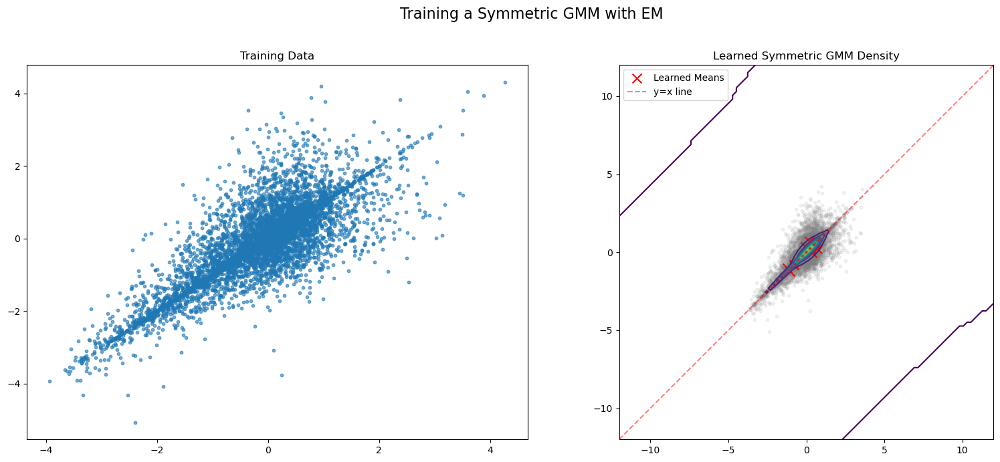

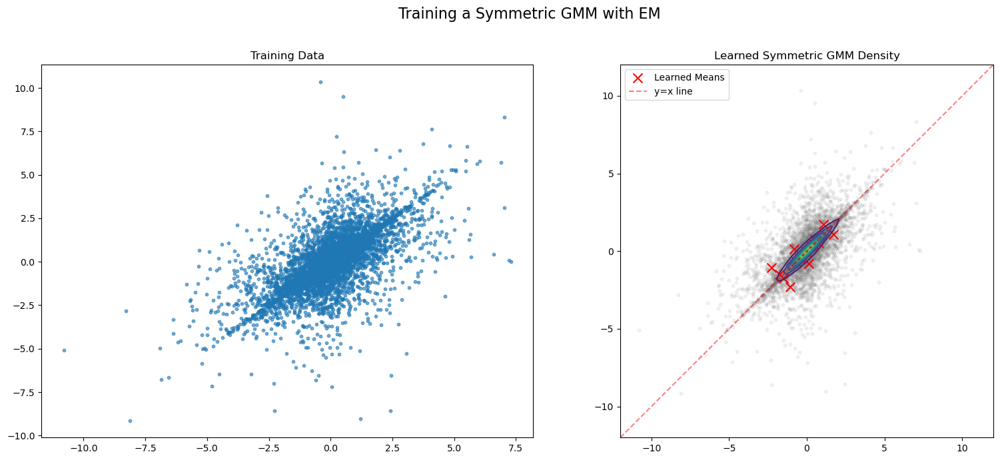

In [43]:
# 1. Generate synthetic data from a known symmetric GMM
key = jax.random.PRNGKey(42)

# 2. Train a new SymmetricGMM on this data
gmm_eps_t = SymmetricGMM()
gmm_eps_rA = SymmetricGMM()
key, subkey = jax.random.split(key)

data_eps_t = jnp.vstack([X_train[:, 1], Y_train[:, 0]]).T
data_eps_rA = jnp.vstack([X_train[:, 2], Y_train[:, 1]]).T

# The user specifies the number of BASE modes they want to find
gmm_eps_t.fit(data_eps_t, n_base_components=10, n_iterations=10, key=subkey)
gmm_eps_rA.fit(data_eps_rA, n_base_components=10, n_iterations=10, key=subkey)

# 3. Visualize the results
fig = plt.figure(figsize=(16, 7))

# Plot training data
ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title("Training Data")
ax1.scatter(data_eps_t[:, 0], data_eps_t[:, 1], s=10, alpha=0.6)

# Plot learned distribution
ax2 = fig.add_subplot(1, 2, 2)
ax2.set_title("Learned Symmetric GMM Density")
ax2.scatter(data_eps_t[:, 0], data_eps_t[:, 1], s=10, alpha=0.1, color='gray') # Show data in background

# Create a grid for contour plot
x = jnp.linspace(-12, 12, 100)
y = jnp.linspace(-12, 12, 100)
X, Y = jnp.meshgrid(x, y)
grid_points = jnp.dstack((X, Y)).reshape(-1, 2)

# Calculate probability density on the grid
log_probs = jax.vmap(
    lambda mu, cov, w: jnp.log(w) + multivariate_normal.logpdf(grid_points, mu, cov)
)(gmm_eps_t.means, gmm_eps_t.covariances, gmm_eps_t.weights)

total_log_prob = jax.scipy.special.logsumexp(log_probs, axis=0)
Z = jnp.exp(total_log_prob).reshape(100, 100)

# Plot contours and means
ax2.contour(X, Y, Z, levels=10, cmap='viridis')
ax2.scatter(gmm_eps_t.means[:, 0], gmm_eps_t.means[:, 1], marker='x', color='red', s=100, label='Learned Means')
ax2.plot([-12, 12], [-12, 12], 'r--', label='y=x line', alpha=0.5)

ax2.set_aspect('equal', adjustable='box')
ax2.set_xlim(-12, 12)
ax2.set_ylim(-12, 12)
ax2.legend()

plt.suptitle("Training a Symmetric GMM with EM", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# 3. Visualize the results
fig = plt.figure(figsize=(16, 7))

# Plot training data
ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title("Training Data")
ax1.scatter(data_eps_rA[:, 0], data_eps_rA[:, 1], s=10, alpha=0.6)

# Plot learned distribution
ax2 = fig.add_subplot(1, 2, 2)
ax2.set_title("Learned Symmetric GMM Density")
ax2.scatter(data_eps_rA[:, 0], data_eps_rA[:, 1], s=10, alpha=0.1, color='gray') # Show data in background

# Create a grid for contour plot
x = jnp.linspace(-12, 12, 100)
y = jnp.linspace(-12, 12, 100)
X, Y = jnp.meshgrid(x, y)
grid_points = jnp.dstack((X, Y)).reshape(-1, 2)

# Calculate probability density on the grid
log_probs = jax.vmap(
    lambda mu, cov, w: jnp.log(w) + multivariate_normal.logpdf(grid_points, mu, cov)
)(gmm_eps_rA.means, gmm_eps_rA.covariances, gmm_eps_rA.weights)

total_log_prob = jax.scipy.special.logsumexp(log_probs, axis=0)
Z = jnp.exp(total_log_prob).reshape(100, 100)

# Plot contours and means
ax2.contour(X, Y, Z, levels=10, cmap='viridis')
ax2.scatter(gmm_eps_rA.means[:, 0], gmm_eps_rA.means[:, 1], marker='x', color='red', s=100, label='Learned Means')
ax2.plot([-12, 12], [-12, 12], 'r--', label='y=x line', alpha=0.5)

ax2.set_aspect('equal', adjustable='box')
ax2.set_xlim(-12, 12)
ax2.set_ylim(-12, 12)
ax2.legend()

plt.suptitle("Training a Symmetric GMM with EM", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

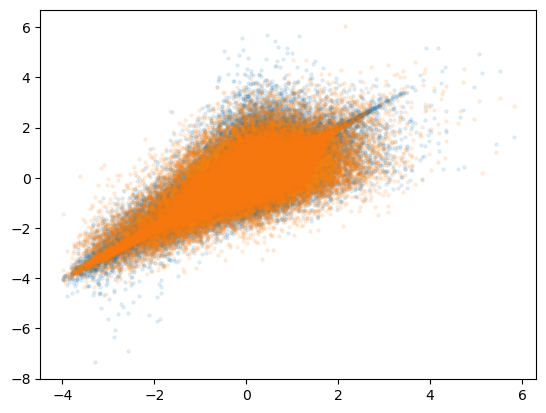

In [44]:
y_test_sample_t = gmm_eps_t.conditional_sample(key, X_test[:, 1])

plt.scatter(X_test[:, 1], Y_test[:, 0], s=5, alpha=0.1, label='True Data')
plt.scatter(X_test[:, 1], y_test_sample_t, s=5, alpha=0.1, label='True Data')

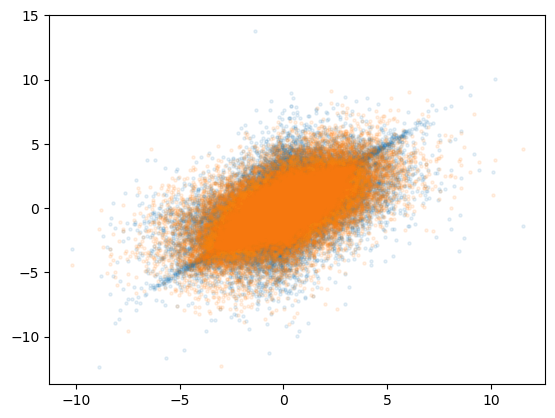

In [45]:
y_test_sample_rA = gmm_eps_rA.conditional_sample(key, X_test[:, 2])

plt.scatter(X_test[:, 2], Y_test[:, 1], s=5, alpha=0.1, label='True Data')
plt.scatter(X_test[:, 2], y_test_sample_rA, s=5, alpha=0.1, label='True Data')

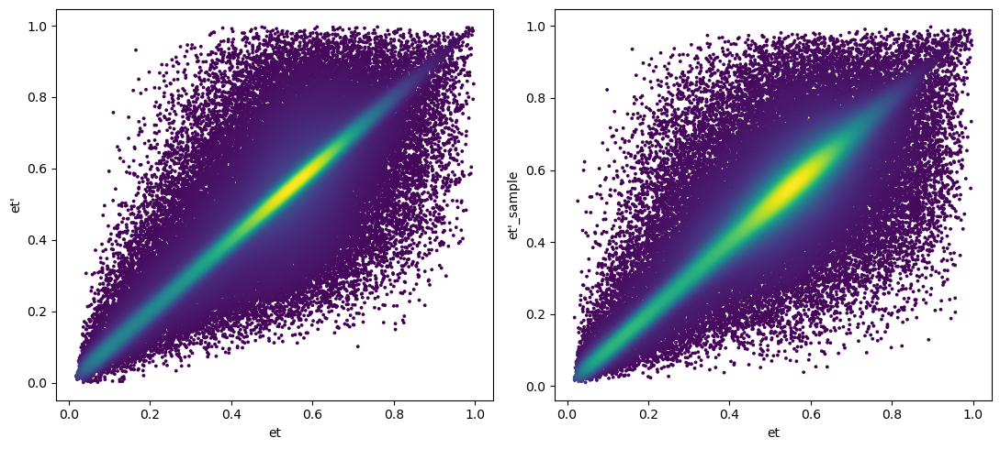

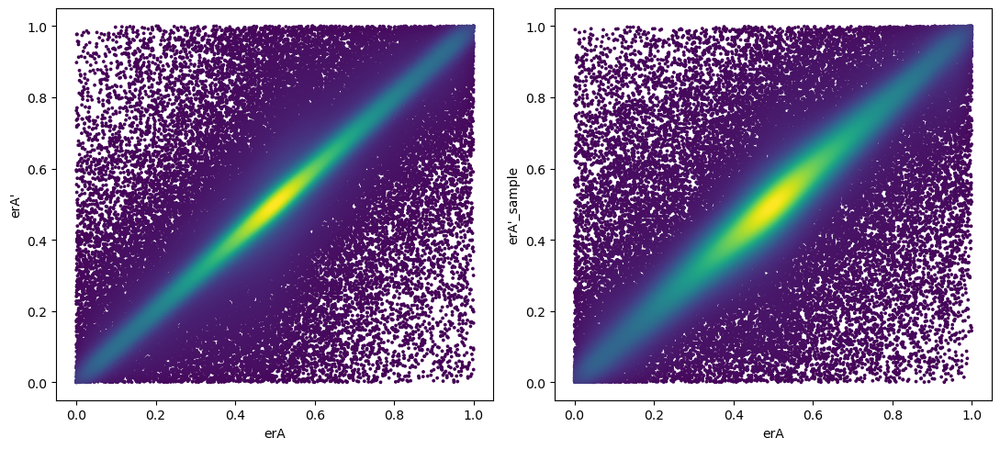

In [48]:
plt.figure(figsize=[11,5])

plt.subplot(1,2,1)
plt.xlabel("et")
plt.ylabel("et'")
dscatter(inv_logit(X_test[:, 1]), inv_logit(Y_test[:, 0]))

plt.subplot(1,2,2)
plt.xlabel("et")
plt.ylabel("et'_sample")
dscatter(inv_logit(X_test[:, 1]), inv_logit(y_test_sample_t))
plt.tight_layout()
plt.show()

plt.figure(figsize=[11,5])

plt.subplot(1,2,1)
plt.xlabel("erA")
plt.ylabel("erA'")
dscatter(inv_logit(X_test[:, 2]), inv_logit(Y_test[:, 1]))

plt.subplot(1,2,2)
plt.xlabel("erA")
plt.ylabel("erA'_sample")
dscatter(inv_logit(X_test[:, 2]), inv_logit(y_test_sample_rA))
plt.tight_layout()
plt.show()

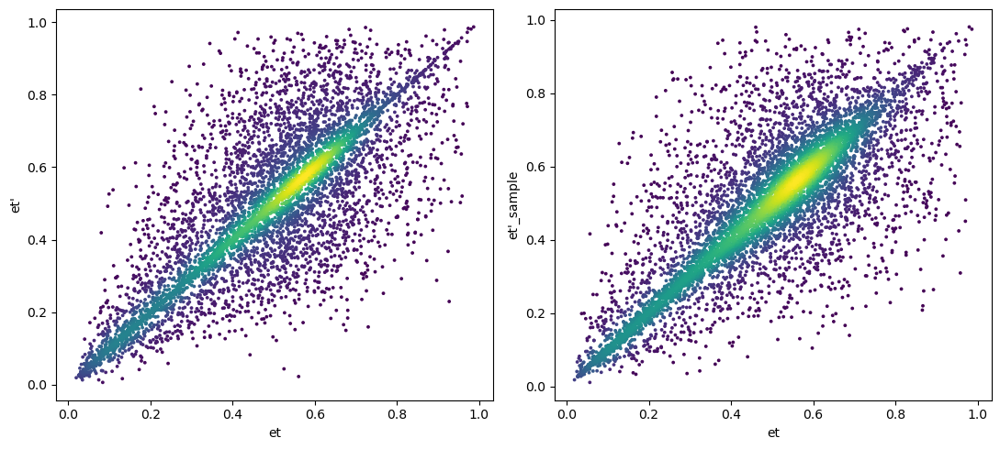

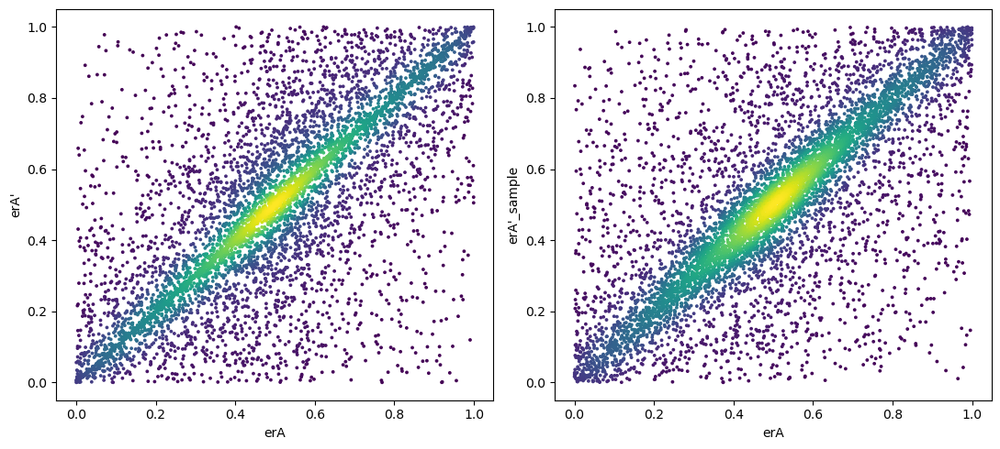

In [49]:
y_train_sample_t = gmm_eps_t.conditional_sample(key, X_train[:, 1])
y_train_sample_rA = gmm_eps_rA.conditional_sample(key, X_train[:, 2])

plt.figure(figsize=[11,5])

plt.subplot(1,2,1)
plt.xlabel("et")
plt.ylabel("et'")
dscatter(inv_logit(X_train[:, 1]), inv_logit(Y_train[:, 0]))

plt.subplot(1,2,2)
plt.xlabel("et")
plt.ylabel("et'_sample")
dscatter(inv_logit(X_train[:, 1]), inv_logit(y_train_sample_t))
plt.tight_layout()
plt.show()

plt.figure(figsize=[11,5])

plt.subplot(1,2,1)
plt.xlabel("erA")
plt.ylabel("erA'")
dscatter(inv_logit(X_train[:, 2]), inv_logit(Y_train[:, 1]))

plt.subplot(1,2,2)
plt.xlabel("erA")
plt.ylabel("erA'_sample")
dscatter(inv_logit(X_train[:, 2]), inv_logit(y_train_sample_rA))
plt.tight_layout()
plt.show()

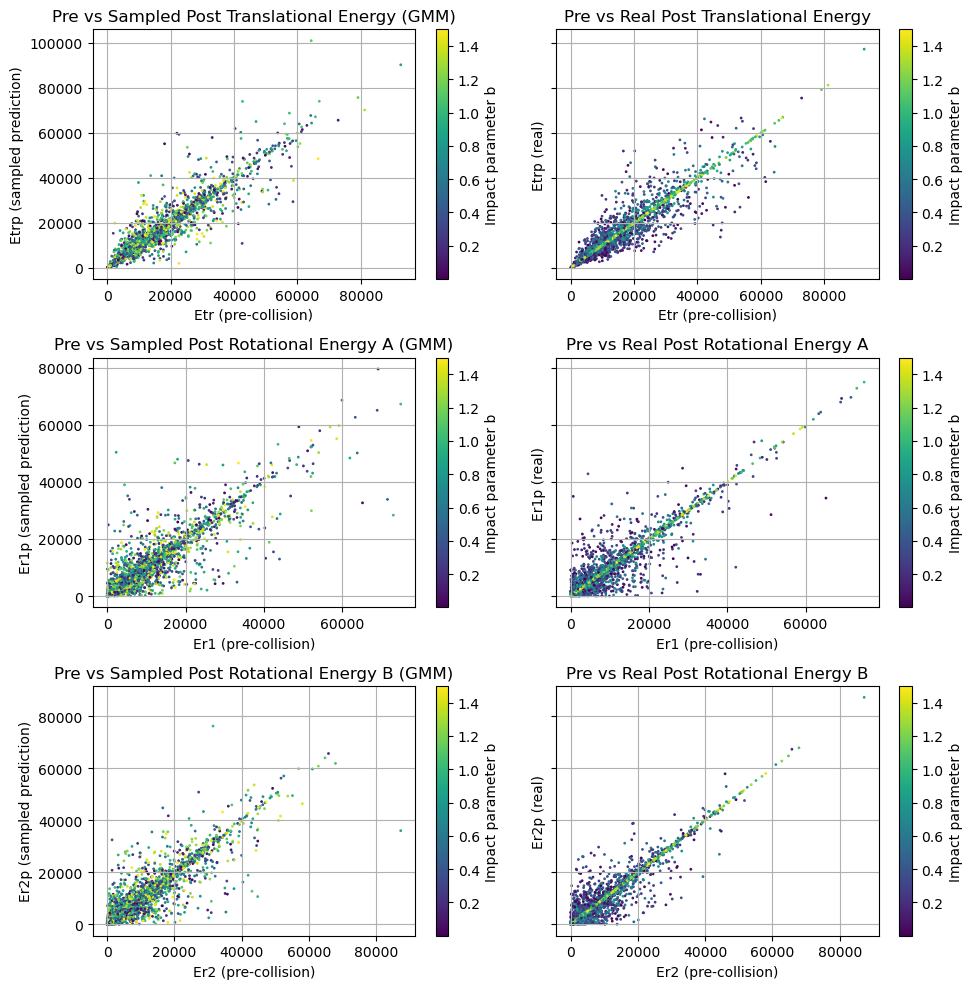

In [32]:
def logit(x):
    x = jnp.clip(x, 1e-6, 1 - 1e-6)
    return jnp.log(x) - jnp.log1p(-x)

def inv_logit(z):
    return jnp.clip(1.0 / (1.0 + jnp.exp(-z)), 1e-12, 1 - 1e-12)

def gmm_sample_conserve(X, Ec, n_samples=1, key=random.PRNGKey(0)):
    """
    Sample post-collision energy fractions from MDN while conserving total energy.
    Returns energies Etr', Er1', Er2' such that sum = Ec always.
    """

    key1, key2 = jax.random.split(key)
    y_test_sample_t = gmm_eps_t.conditional_sample(key1, X[:, 1])
    y_test_sample_rA = gmm_eps_rA.conditional_sample(key2, X[:, 2])
    
    eps_t_p = inv_logit(y_test_sample_t)[:, None]   # Shape: (N, n_samples)
    eps_rA_p = inv_logit(y_test_sample_rA)[:, None] # Shape: (N, n_samples)
    

    Ec_exp = Ec[:, None]  # Shape (N, 1) to allow broadcasting

    # 1. Calculate post-collision translational energy
    Etr_p = eps_t_p * Ec_exp

    # 2. Calculate total post-collision rotational energy
    Erot_p_total = (1.0 - eps_t_p) * Ec_exp

    # 3. Split total rotational energy between molecules A and B
    Er1_p = eps_rA_p * Erot_p_total
    Er2_p = (1.0 - eps_rA_p) * Erot_p_total
    
    return Etr_p, Er1_p, Er2_p

Etrp_samp_test, Er1p_samp_test, Er2p_samp_test = gmm_sample_conserve(X_test, Ec_test, n_samples=1, key=random.PRNGKey(1))

# Make subplots: 3 rows (Etr, Er1, Er2) × 2 cols (Pred vs Real)
fig, axes = plt.subplots(3, 2, figsize=(10, 10), sharey='row',)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# --- Row 1: Translational energy ---
# Left: predicted
sc0 = axes[0, 0].scatter(data_test["Etr"], Etrp_samp_test, alpha=1, s=1, c=data_test["b"])
axes[0, 0].set_title("Pre vs Sampled Post Translational Energy (GMM)")
axes[0, 0].set_xlabel("Etr (pre-collision)")
axes[0, 0].set_ylabel("Etrp (sampled prediction)")
fig.colorbar(sc0, ax=axes[0, 0], label='Impact parameter b')
axes[0, 0].grid(True)

# Right: real
sc1 = axes[0, 1].scatter(data_test["Etr"], data_test["Etrp"], alpha=1, s=1, c=data_test["b"])
axes[0, 1].set_title("Pre vs Real Post Translational Energy")
axes[0, 1].set_xlabel("Etr (pre-collision)")
axes[0, 1].set_ylabel("Etrp (real)")
fig.colorbar(sc1, ax=axes[0, 1], label='Impact parameter b')
axes[0, 1].grid(True)

# --- Row 2: Rotational Energy A ---
sc2 = axes[1, 0].scatter(data_test["Er1"], Er1p_samp_test, alpha=1, s=1, c=data_test["b"])
axes[1, 0].set_title("Pre vs Sampled Post Rotational Energy A (GMM)")
axes[1, 0].set_xlabel("Er1 (pre-collision)")
axes[1, 0].set_ylabel("Er1p (sampled prediction)")
fig.colorbar(sc2, ax=axes[1, 0], label='Impact parameter b')
axes[1, 0].grid(True)

sc3 = axes[1, 1].scatter(data_test["Er1"], data_test["Er1p"], alpha=1, s=1, c=data_test["b"])
axes[1, 1].set_title("Pre vs Real Post Rotational Energy A")
axes[1, 1].set_xlabel("Er1 (pre-collision)")
axes[1, 1].set_ylabel("Er1p (real)")
fig.colorbar(sc3, ax=axes[1, 1], label='Impact parameter b')
axes[1, 1].grid(True)

# --- Row 3: Rotational Energy B ---
sc4 = axes[2, 0].scatter(data_test["Er2"], Er2p_samp_test, alpha=1, s=1, c=data_test["b"])
axes[2, 0].set_title("Pre vs Sampled Post Rotational Energy B (GMM)")
axes[2, 0].set_xlabel("Er2 (pre-collision)")
axes[2, 0].set_ylabel("Er2p (sampled prediction)")
fig.colorbar(sc4, ax=axes[2, 0], label='Impact parameter b')
axes[2, 0].grid(True)

sc5 = axes[2, 1].scatter(data_test["Er2"], data_test["Er2p"], alpha=1, s=1, c=data_test["b"])
axes[2, 1].set_title("Pre vs Real Post Rotational Energy B")
axes[2, 1].set_xlabel("Er2 (pre-collision)")
axes[2, 1].set_ylabel("Er2p (real)")
fig.colorbar(sc5, ax=axes[2, 1], label='Impact parameter b')
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

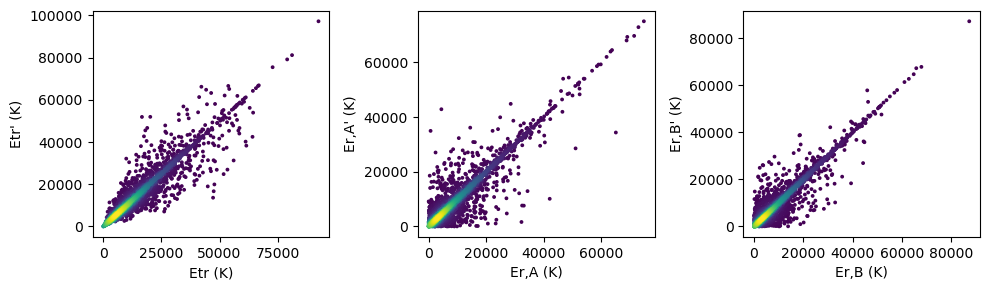

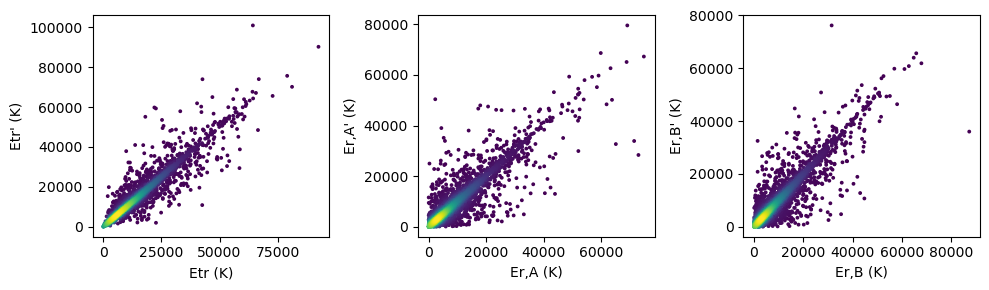

In [33]:
plt.figure(figsize=[10,3])

plt.subplot(1,3,1)
plt.xlabel("Etr (K)")
plt.ylabel("Etr' (K)")
dscatter(data_test['Etr'],data_test['Etrp'])


plt.subplot(1,3,2)
plt.xlabel("Er,A (K)")
plt.ylabel("Er,A' (K)")
dscatter(data_test['Er1'],data_test['Er1p'])


plt.subplot(1,3,3)
plt.xlabel("Er,B (K)")
plt.ylabel("Er,B' (K)")
dscatter(data_test['Er2'],data_test['Er2p'])
plt.tight_layout()
plt.show()

plt.figure(figsize=[10,3])

plt.subplot(1,3,1)
plt.xlabel("Etr (K)")
plt.ylabel("Etr' (K)")
dscatter(data_test['Etr'],Etrp_samp_test.squeeze())


plt.subplot(1,3,2)
plt.xlabel("Er,A (K)")
plt.ylabel("Er,A' (K)")
dscatter(data_test['Er1'],Er1p_samp_test.squeeze())


plt.subplot(1,3,3)
plt.xlabel("Er,B (K)")
plt.ylabel("Er,B' (K)")
dscatter(data_test['Er2'],Er2p_samp_test.squeeze())
plt.tight_layout()
plt.show()

# DSMC - termal equilibrium

In [243]:
import time
from scipy.stats import maxwell

# ---------------------------
# Physical & simulation params
# ---------------------------
n_particles = 10_000        # increase for better statistics
T0 = 300.0                # Kelvin (initial equilibrium temperature)
kB = 1.38064852e-23
m_H = 1.6738e-27
m_molecule = 2.0 * m_H    # diatomic identical masses
mu_pair = 0.5 * m_molecule  # reduced mass for identical molecules

# DSMC timestepping
dt = 1e-4
t_end = 0.025
n_steps = int(jnp.ceil(t_end / dt))

snapshot_times = [0.0, 0.013, 0.025]
snapshots = []

# collision candidate batch size per timestep
n_cand = max(200, n_particles // 2)

# PRNG key (JAX)
key = jax.random.PRNGKey(1234)

# ---------------------------
# Utility (same transforms used in training)
# ---------------------------

def preprocess_X_batch_jax(Etr_batch, Er_i_batch, Er_j_batch):
    """
    Vectorized preprocessing for MDN inputs (JAX).
    Inputs arrays shape (Npairs,)
    Returns X_batch (Npairs,3), Ec_batch (Npairs,)
    """
    Ec = Etr_batch + Er_i_batch + Er_j_batch
    E_rot_total = Er_i_batch + Er_j_batch
    eps_t = Etr_batch / (Ec+1e-12)
    eps_r_A = Er_i_batch / (E_rot_total+1e-12)
    # use jnp.log and logit_jnp
    X1 = jnp.log(Ec+1e-12)
    X2 = logit(eps_t)
    X3 = logit(eps_r_A)
    X = jnp.stack([X1, X2, X3], axis=1)
    return X.astype(jnp.float32), Ec

# ---------------------------
# Initialize particles (thermal equilibrium)
# Keep only total rotational energy Er (sum of two mode energies)
# ---------------------------
key, sk = jax.random.split(key)
v_tr = jax.random.normal(sk, (n_particles, 3)) * jnp.sqrt(T0 / m_molecule)

# sample Er_total as Gamma(k=1, scale=kB*T0) using JAX
key, sk = jax.random.split(key)
Er = jax.random.gamma(sk, 1.0, (n_particles,)) * (T0)  # total rotational energy per particle

# convert to numpy for some plotting functions that expect numpy later
v_tr = jnp.array(v_tr)
Er = jnp.array(Er)

# ---------------------------
# Helper: generate disjoint candidate pairs & accept by relative speed (JAX)
# ---------------------------
def select_disjoint_candidates_and_accept(key, v_tr, n_cand):
    """
    Produce disjoint candidate pairs by random permutation:
      - permute indices, take first 2*n_cand indices, reshape to (n_cand,2)
    Accept each pair with probability g/gmax (relative speed weighting).
    Returns:
      key, i_acc (array), j_acc (array), g_acc (array), gmax (scalar)
    """
    N = v_tr.shape[0]
    key, kperm, kune = jax.random.split(key, 3)
    perm = jax.random.permutation(kperm, N)
    # if 2*n_cand > N, reduce n_cand to floor(N/2)
    max_pairs = N // 2
    n_cand_eff = jnp.minimum(n_cand, max_pairs)
    idx2 = perm[:2 * n_cand_eff]
    pairs = idx2.reshape((n_cand_eff, 2))
    i_cand = pairs[:, 0]
    j_cand = pairs[:, 1]
    v_rel = v_tr[i_cand] - v_tr[j_cand]
    g = jnp.linalg.norm(v_rel, axis=1)
    gmax = jnp.maximum(g.max(), 1e-12)
    p = g / gmax
    u = jax.random.uniform(kune, shape=(n_cand_eff,))
    accept_mask = u < p
    i_acc = i_cand[accept_mask]
    j_acc = j_cand[accept_mask]
    g_acc = g[accept_mask]
    return key, i_acc, j_acc, g_acc, gmax

# ---------------------------
# Batch collision processing (JAX vectorized)
# ---------------------------
@jax.jit
def process_pairs_batch_jax(params, key, v_i_arr, v_j_arr, Er_i_arr, Er_j_arr):
    """
    Vectorized processing of accepted disjoint pairs in JAX.
    Inputs: arrays (Npairs, ...) as jnp arrays.
    Returns: v_i_new, v_j_new, Er_i_post, Er_j_post, key
    """
    n_pairs = v_i_arr.shape[0]
    # If zero pairs, return empty arrays quickly
    def zero_return():
        return (jnp.zeros((0, 3)), jnp.zeros((0, 3)), jnp.zeros((0,)), jnp.zeros((0,)), key)

    if n_pairs == 0:
        return zero_return()

    # 1) Compute pair translational energy (relative speed)
    v_rel = v_i_arr - v_j_arr  # (n_pairs,3)
    g2 = jnp.sum(v_rel**2, axis=1)  # (n_pairs,)
    Etr_pair = 0.5 * mu_pair * g2  # (n_pairs,)

    # 2) Preprocess X batch & Ec batch for MDN
    X_batch, Ec_batch = preprocess_X_batch_jax(Etr_pair, Er_i_arr, Er_j_arr)  # shapes (n_pairs,3), (n_pairs,)

    # 3) Call MDN once for whole batch
    # Provide per-batch key for MDN sampling:
    key, kmdn = jax.random.split(key)
    Etrp_batch, Er_i_post_batch, Er_j_post_batch = mdn_sample_conserve(params, X_batch, Ec_batch, n_samples=1, key=kmdn)
    # ensure shape (n_pairs,) for each
    Etrp_batch = jnp.squeeze(jnp.array(Etrp_batch)).reshape(-1)
    Er_i_post_batch = jnp.squeeze(jnp.array(Er_i_post_batch)).reshape(-1)
    Er_j_post_batch = jnp.squeeze(jnp.array(Er_j_post_batch)).reshape(-1)

    # 4) Reconstruct new velocities:
    # sample isotropic directions via two uniforms per pair
    key, kunif = jax.random.split(key)
    u = jax.random.uniform(kunif, (n_pairs, 2))
    u1 = u[:, 0]; u2 = u[:, 1]
    theta = 2.0 * jnp.pi * u1
    phi = jnp.arccos(2.0 * u2 - 1.0)
    sinphi = jnp.sin(phi)
    dir_new = jnp.stack([sinphi * jnp.cos(theta), sinphi * jnp.sin(theta), jnp.cos(phi)], axis=1)  # (n_pairs,3)

    # g_new and relative velocity
    g_new = jnp.sqrt(jnp.maximum(2.0 * Etrp_batch / mu_pair, 0.0))
    v_rel_new = dir_new * g_new[:, None]  # (n_pairs,3)

    v_cm = 0.5 * (v_i_arr + v_j_arr)
    v_i_new = v_cm + 0.5 * v_rel_new
    v_j_new = v_cm - 0.5 * v_rel_new

    return v_i_new, v_j_new, Er_i_post_batch, Er_j_post_batch, key

# ---------------------------
# Main DSMC loop (Python driver, heavy ops in JAX)
# ---------------------------
t0 = time.time()
times = []
Ttr_list = []
Trot_list = []

# initial temps
T_tr_init = float(jnp.mean(jnp.sum(v_tr**2, axis=1) * m_molecule / (3.0)))
T_rot_init = float(jnp.mean(Er) / (1))
print(f"Initial T_tr = {T_tr_init:.3f} K, T_rot = {T_rot_init:.3f} K")

for step in range(n_steps + 1):
    t = step * dt
    # record temps
    T_tr = float(jnp.mean(jnp.sum(v_tr**2, axis=1) * m_molecule / (3.0 )))
    T_rot = float(jnp.mean(Er) / (1))
    times.append(t)
    Ttr_list.append(T_tr)
    Trot_list.append(T_rot)

    # Save snapshots
    if any(abs(t - st) < dt/2 for st in snapshot_times):
        snapshots.append({
            "time": t,
            "v_tr": np.array(v_tr),
            "Er": np.array(Er),
        })

    if step == n_steps:
        break

    # select disjoint candidate pairs & accept by relative speed (JAX)
    key, i_acc, j_acc, g_acc, gmax = select_disjoint_candidates_and_accept(key, v_tr, n_cand)

    n_acc = i_acc.shape[0]
    if n_acc == 0:
        continue

    print(f"t={t:.4f}s: {n_acc} accepted collisions (gmax={float(gmax):.2e})")

    # gather arrays for accepted pairs (convert to jnp arrays)
    v_i_arr = v_tr[i_acc]
    v_j_arr = v_tr[j_acc]
    Er_i_arr = Er[i_acc]
    Er_j_arr = Er[j_acc]

    # process batch in JAX
    v_i_new_arr, v_j_new_arr, Er_i_new_arr, Er_j_new_arr, key = process_pairs_batch_jax(
        params, key, v_i_arr, v_j_arr, Er_i_arr, Er_j_arr
    )

    # scatter-update (JAX indexed updates)
    v_tr = v_tr.at[i_acc].set(v_i_new_arr)
    v_tr = v_tr.at[j_acc].set(v_j_new_arr)
    Er = Er.at[i_acc].set(Er_i_new_arr)
    Er = Er.at[j_acc].set(Er_j_new_arr)

    print(f"t = {t:.4f} s, T_tr = {T_tr:.3f} K, T_rot = {T_rot:.3f} K")

t1 = time.time()
print(f"Simulation done in {t1 - t0:.2f} s")

Initial T_tr = 299.313 K, T_rot = 300.790 K
t=0.0000s: 1836 accepted collisions (gmax=1.86e+15)
t = 0.0000 s, T_tr = 299.313 K, T_rot = 300.790 K
t=0.0001s: 1724 accepted collisions (gmax=2.01e+15)
t = 0.0001 s, T_tr = 296.986 K, T_rot = 304.280 K
t=0.0002s: 1838 accepted collisions (gmax=1.84e+15)
t = 0.0002 s, T_tr = 294.513 K, T_rot = 307.989 K
t=0.0003s: 1746 accepted collisions (gmax=1.92e+15)
t = 0.0003 s, T_tr = 292.143 K, T_rot = 311.544 K
t=0.0004s: 1927 accepted collisions (gmax=1.71e+15)
t = 0.0004 s, T_tr = 290.404 K, T_rot = 314.152 K
t=0.0005s: 1810 accepted collisions (gmax=1.84e+15)
t = 0.0005 s, T_tr = 287.959 K, T_rot = 317.820 K
t=0.0006s: 1729 accepted collisions (gmax=1.93e+15)
t = 0.0006 s, T_tr = 285.625 K, T_rot = 321.322 K
t=0.0007s: 1858 accepted collisions (gmax=1.75e+15)
t = 0.0007 s, T_tr = 283.728 K, T_rot = 324.166 K
t=0.0008s: 1815 accepted collisions (gmax=1.77e+15)
t = 0.0008 s, T_tr = 283.077 K, T_rot = 325.143 K
t=0.0009s: 1398 accepted collisions (g

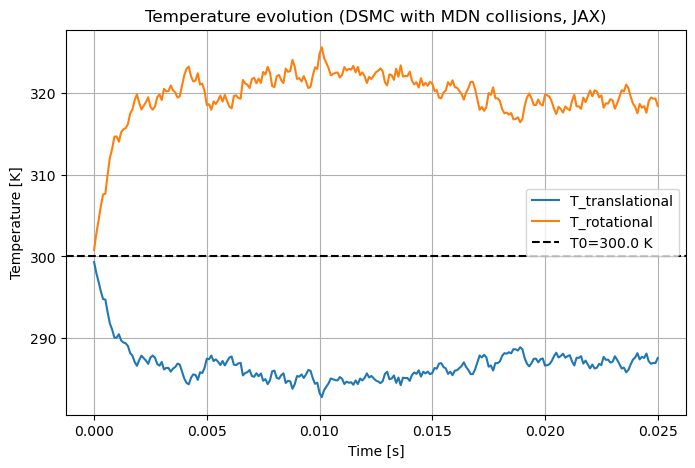

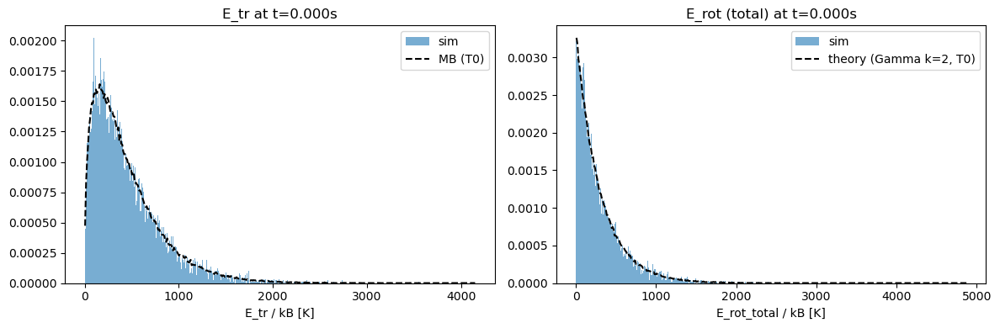

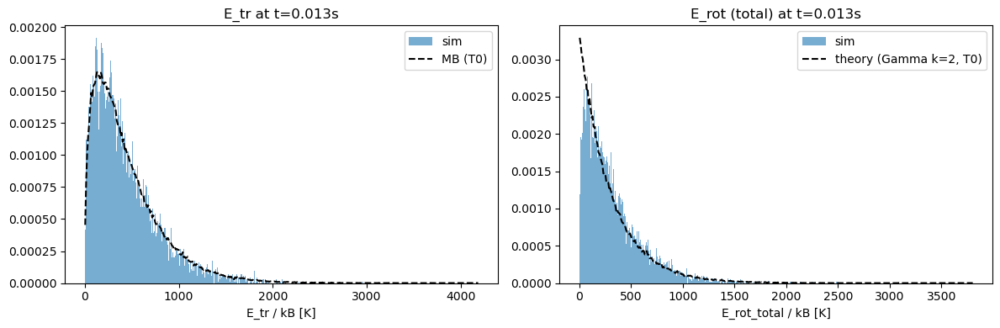

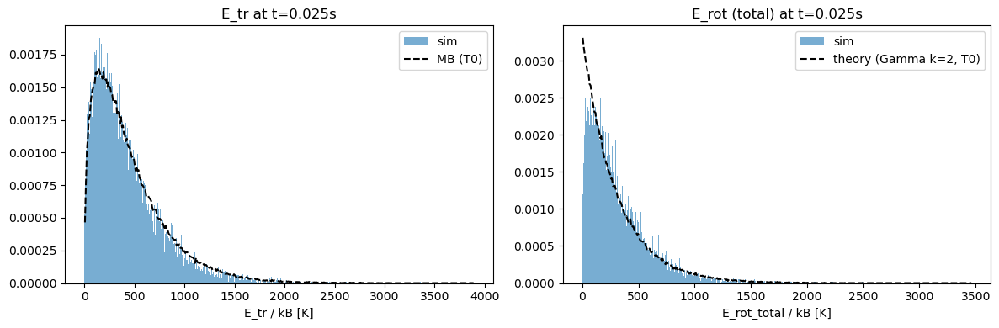

In [35]:

# ---------------------------
# Plot temperatures
# ---------------------------
plt.figure(figsize=(8,5))
plt.plot(times, Ttr_list, label="T_translational")
plt.plot(times, Trot_list, label="T_rotational")
plt.axhline(T0, color="k", linestyle="--", label=f"T0={T0} K")
plt.xlabel("Time [s]")
plt.ylabel("Temperature [K]")
plt.legend()
plt.title("Temperature evolution (DSMC with MDN collisions, JAX)")
plt.grid(True)
plt.show()

# ---------------------------
# Histograms at snapshots
# ---------------------------
def plot_energy_histograms(snapshot):
    t = snapshot["time"]
    v_tr_snap = snapshot["v_tr"]
    Etr_snap = 0.5 * m_molecule * np.sum(v_tr_snap**2, axis=1) / 1  # Kelvin units
    Erot_snap = snapshot["Er"] / 1

    fig, axes = plt.subplots(1, 2, figsize=(12,4))
    # Translational
    ax = axes[0]
    ax.hist(Etr_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_v = maxwell.rvs(scale=np.sqrt(1*T0/m_molecule), size=200000)
    samp_E = 0.5 * m_molecule * samp_v**2 / 1
    hist_s, be = np.histogram(samp_E, bins=400, density=True)
    bc = 0.5*(be[:-1]+be[1:])
    ax.plot(bc, hist_s, 'k--', label="MB (T0)")
    ax.set_xlabel("E_tr / kB [K]")
    ax.set_title(f"E_tr at t={t:.3f}s")
    ax.legend()

    # Rotational
    ax = axes[1]
    ax.hist(Erot_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_rot = np.random.gamma(shape=1.0, scale=1*T0, size=200000) / 1
    hist_s_r, be_r = np.histogram(samp_rot, bins=400, density=True)
    bc_r = 0.5*(be_r[:-1]+be_r[1:])
    ax.plot(bc_r, hist_s_r, 'k--', label="theory (Gamma k=2, T0)")
    ax.set_xlabel("E_rot_total / kB [K]")
    ax.set_title(f"E_rot (total) at t={t:.3f}s")
    ax.legend()

    plt.tight_layout()
    plt.show()

for snap in snapshots:
    plot_energy_histograms(snap)

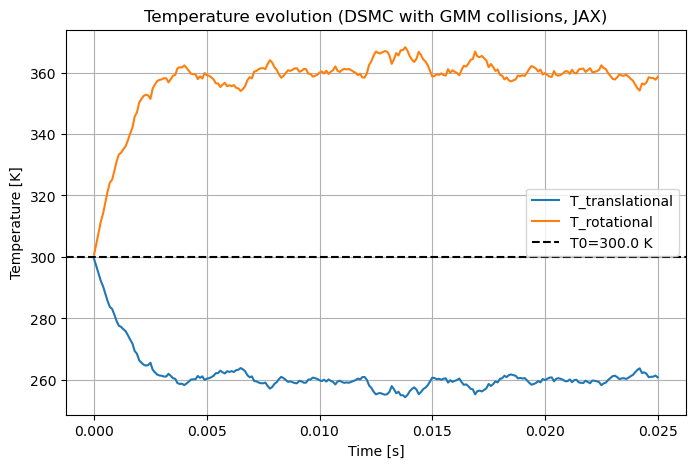

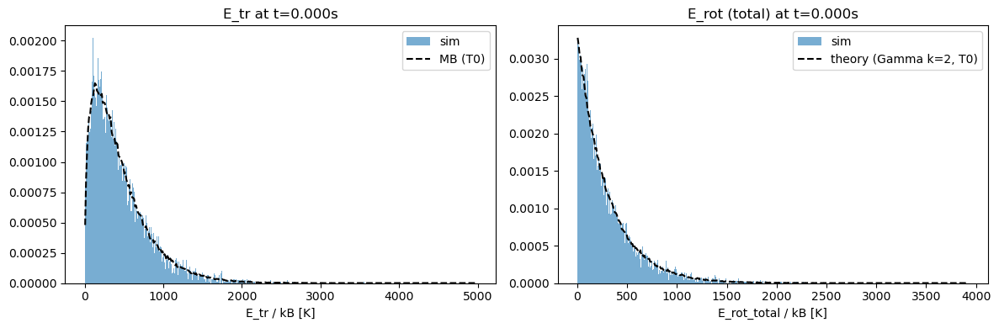

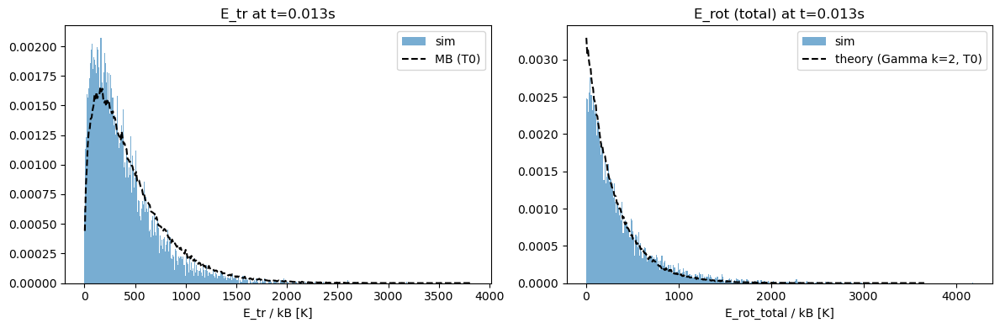

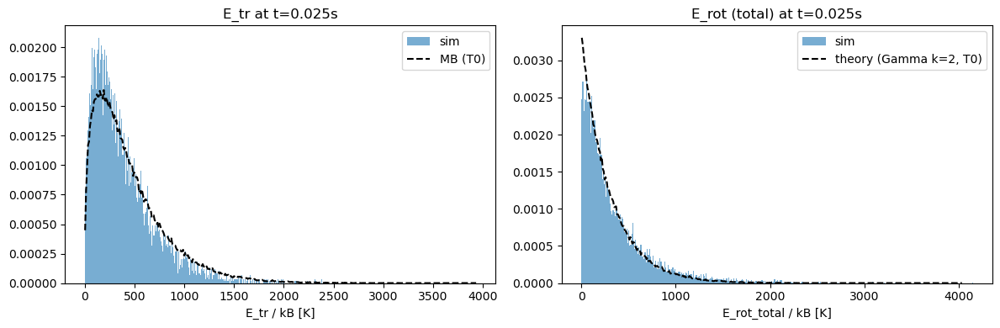

In [244]:

# ---------------------------
# Plot temperatures
# ---------------------------
plt.figure(figsize=(8,5))
plt.plot(times, Ttr_list, label="T_translational")
plt.plot(times, Trot_list, label="T_rotational")
plt.axhline(T0, color="k", linestyle="--", label=f"T0={T0} K")
plt.xlabel("Time [s]")
plt.ylabel("Temperature [K]")
plt.legend()
plt.title("Temperature evolution (DSMC with GMM collisions, JAX)")
plt.grid(True)
plt.show()

# ---------------------------
# Histograms at snapshots
# ---------------------------
def plot_energy_histograms(snapshot):
    t = snapshot["time"]
    v_tr_snap = snapshot["v_tr"]
    Etr_snap = 0.5 * m_molecule * np.sum(v_tr_snap**2, axis=1) / 1  # Kelvin units
    Erot_snap = snapshot["Er"] / 1

    fig, axes = plt.subplots(1, 2, figsize=(12,4))
    # Translational
    ax = axes[0]
    ax.hist(Etr_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_v = maxwell.rvs(scale=np.sqrt(1*T0/m_molecule), size=200000)
    samp_E = 0.5 * m_molecule * samp_v**2 / 1
    hist_s, be = np.histogram(samp_E, bins=400, density=True)
    bc = 0.5*(be[:-1]+be[1:])
    ax.plot(bc, hist_s, 'k--', label="MB (T0)")
    ax.set_xlabel("E_tr / kB [K]")
    ax.set_title(f"E_tr at t={t:.3f}s")
    ax.legend()

    # Rotational
    ax = axes[1]
    ax.hist(Erot_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_rot = np.random.gamma(shape=1.0, scale=1*T0, size=200000) / 1
    hist_s_r, be_r = np.histogram(samp_rot, bins=400, density=True)
    bc_r = 0.5*(be_r[:-1]+be_r[1:])
    ax.plot(bc_r, hist_s_r, 'k--', label="theory (Gamma k=2, T0)")
    ax.set_xlabel("E_rot_total / kB [K]")
    ax.set_title(f"E_rot (total) at t={t:.3f}s")
    ax.legend()

    plt.tight_layout()
    plt.show()

for snap in snapshots:
    plot_energy_histograms(snap)

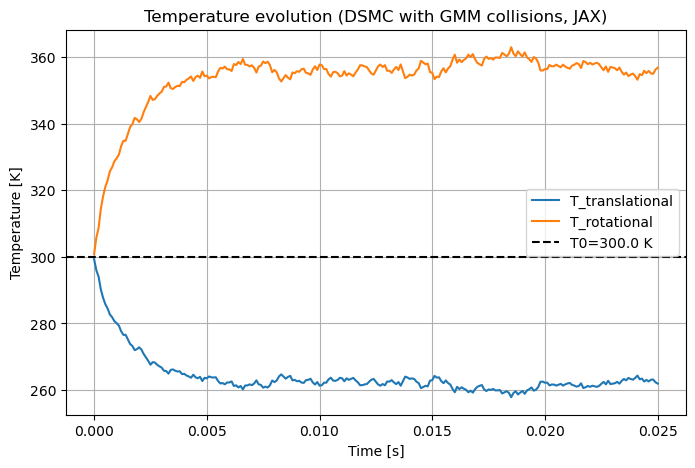

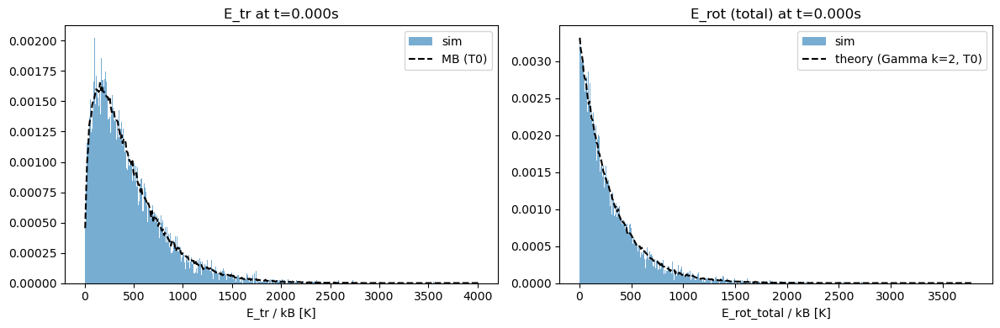

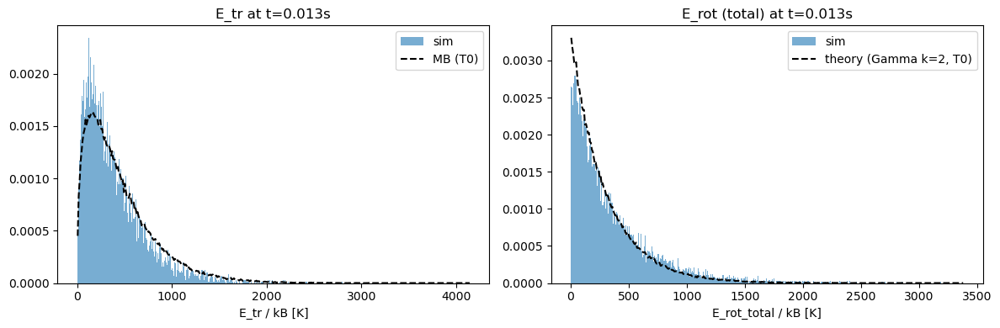

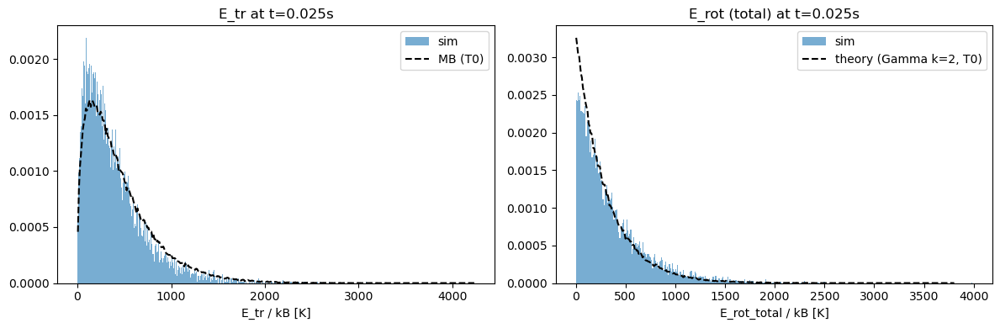

In [123]:

# ---------------------------
# Plot temperatures
# ---------------------------
plt.figure(figsize=(8,5))
plt.plot(times, Ttr_list, label="T_translational")
plt.plot(times, Trot_list, label="T_rotational")
plt.axhline(T0, color="k", linestyle="--", label=f"T0={T0} K")
plt.xlabel("Time [s]")
plt.ylabel("Temperature [K]")
plt.legend()
plt.title("Temperature evolution (DSMC with GMM collisions, JAX)")
plt.grid(True)
plt.show()

# ---------------------------
# Histograms at snapshots
# ---------------------------
def plot_energy_histograms(snapshot):
    t = snapshot["time"]
    v_tr_snap = snapshot["v_tr"]
    Etr_snap = 0.5 * m_molecule * np.sum(v_tr_snap**2, axis=1) / 1  # Kelvin units
    Erot_snap = snapshot["Er"] / 1

    fig, axes = plt.subplots(1, 2, figsize=(12,4))
    # Translational
    ax = axes[0]
    ax.hist(Etr_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_v = maxwell.rvs(scale=np.sqrt(1*T0/m_molecule), size=200000)
    samp_E = 0.5 * m_molecule * samp_v**2 / 1
    hist_s, be = np.histogram(samp_E, bins=400, density=True)
    bc = 0.5*(be[:-1]+be[1:])
    ax.plot(bc, hist_s, 'k--', label="MB (T0)")
    ax.set_xlabel("E_tr / kB [K]")
    ax.set_title(f"E_tr at t={t:.3f}s")
    ax.legend()

    # Rotational
    ax = axes[1]
    ax.hist(Erot_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_rot = np.random.gamma(shape=1.0, scale=1*T0, size=200000) / 1
    hist_s_r, be_r = np.histogram(samp_rot, bins=400, density=True)
    bc_r = 0.5*(be_r[:-1]+be_r[1:])
    ax.plot(bc_r, hist_s_r, 'k--', label="theory (Gamma k=2, T0)")
    ax.set_xlabel("E_rot_total / kB [K]")
    ax.set_title(f"E_rot (total) at t={t:.3f}s")
    ax.legend()

    plt.tight_layout()
    plt.show()

for snap in snapshots:
    plot_energy_histograms(snap)

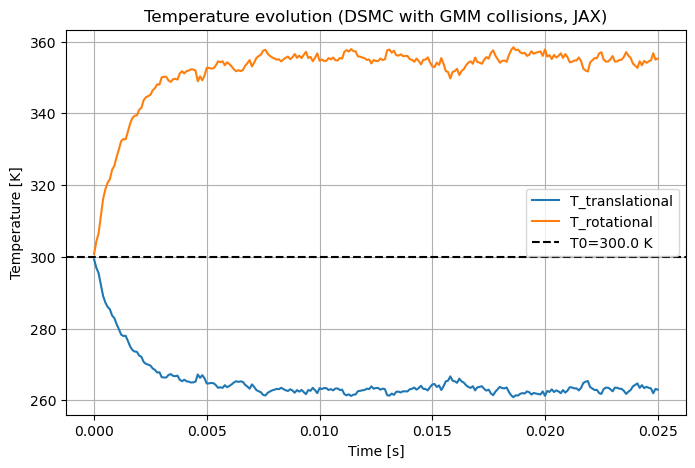

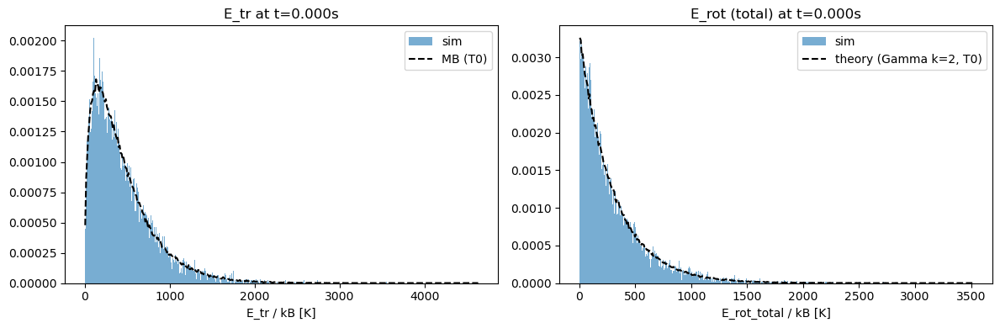

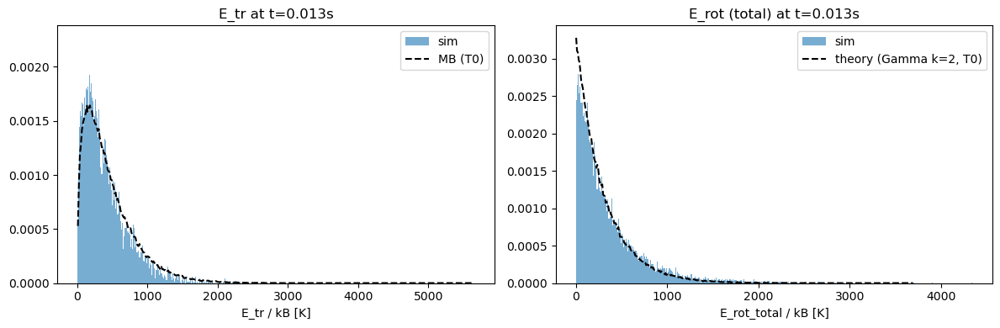

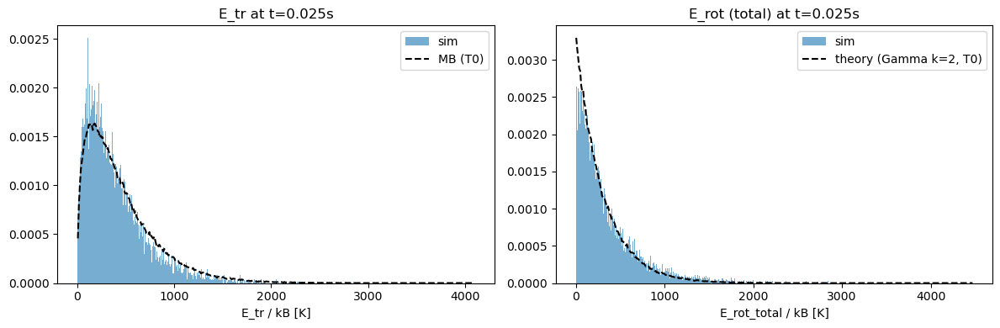

In [176]:

# ---------------------------
# Plot temperatures
# ---------------------------
plt.figure(figsize=(8,5))
plt.plot(times, Ttr_list, label="T_translational")
plt.plot(times, Trot_list, label="T_rotational")
plt.axhline(T0, color="k", linestyle="--", label=f"T0={T0} K")
plt.xlabel("Time [s]")
plt.ylabel("Temperature [K]")
plt.legend()
plt.title("Temperature evolution (DSMC with GMM collisions, JAX)")
plt.grid(True)
plt.show()

# ---------------------------
# Histograms at snapshots
# ---------------------------
def plot_energy_histograms(snapshot):
    t = snapshot["time"]
    v_tr_snap = snapshot["v_tr"]
    Etr_snap = 0.5 * m_molecule * np.sum(v_tr_snap**2, axis=1) / 1  # Kelvin units
    Erot_snap = snapshot["Er"] / 1

    fig, axes = plt.subplots(1, 2, figsize=(12,4))
    # Translational
    ax = axes[0]
    ax.hist(Etr_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_v = maxwell.rvs(scale=np.sqrt(1*T0/m_molecule), size=200000)
    samp_E = 0.5 * m_molecule * samp_v**2 / 1
    hist_s, be = np.histogram(samp_E, bins=400, density=True)
    bc = 0.5*(be[:-1]+be[1:])
    ax.plot(bc, hist_s, 'k--', label="MB (T0)")
    ax.set_xlabel("E_tr / kB [K]")
    ax.set_title(f"E_tr at t={t:.3f}s")
    ax.legend()

    # Rotational
    ax = axes[1]
    ax.hist(Erot_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_rot = np.random.gamma(shape=1.0, scale=1*T0, size=200000) / 1
    hist_s_r, be_r = np.histogram(samp_rot, bins=400, density=True)
    bc_r = 0.5*(be_r[:-1]+be_r[1:])
    ax.plot(bc_r, hist_s_r, 'k--', label="theory (Gamma k=2, T0)")
    ax.set_xlabel("E_rot_total / kB [K]")
    ax.set_title(f"E_rot (total) at t={t:.3f}s")
    ax.legend()

    plt.tight_layout()
    plt.show()

for snap in snapshots:
    plot_energy_histograms(snap)

# Previous group DSMC

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import argparse
import tqdm
from scipy.special import expit, logit, softmax
from scipy.stats import norm
import os
import csv

from datetime import datetime


np.random.seed(1)


class DSMCSimulation:
    def __init__(self, n_particles, n_steps, mdn_model=None, T_tr_initial=167, T_rot_initial=1000, Z_r=245, domain_size=6.4e-4, n_cells=10, sigma_collision=2.92e-10):
        # Simulation parameters
        self.n_particles = n_particles
        self.n_steps = n_steps
        self.T_tr_initial = T_tr_initial
        self.T_rot_initial = T_rot_initial
        self.Z_r = Z_r
        self.p_inelastic = 1/self.Z_r  # Inelastic collision probability
        self.domain_size = domain_size
        self.n_cells = n_cells
        self.sigma_collision = sigma_collision


        self.k_B = 1.38e-23  # Boltzmann constant (J/K)
        self.m_H2 = 3.34e-26  # Mass of hydrogen molecule (kg)
        self.density = 0.9  # Density of particles (kg/m^3)
        self.omega = 0.5  # Collision model parameter
        
        # Degrees of freedom
        self.dof_trans = 3  # 3 translational degrees of freedom
        self.dof_rot = 2    # 2 rotational degrees of freedom for diatomic molecules

        # v_init = np.sqrt(3*boltz*T/mass)
        self.v_init = np.sqrt(3 * self.k_B * self.T_tr_initial / self.m_H2)  # Initial velocity
        #tau = 0.2*(L/ncell)/v_init
        self.time_step = 0.2 * (self.domain_size / self.n_cells) / self.v_init   # Set timestep (in seconds)
        # eff_num = density/mass * L**3 /npart
        self.eff_num = self.density/self.m_H2 * domain_size**3 / n_particles
        # coeff = 0.5*eff_num*np.pi*diam**2*tau/(L**3/ncell)
        self.coeff = 0.5 * self.eff_num * np.pi * self.sigma_collision**2 * self.time_step / (self.domain_size**3 / self.n_cells)

        # Option to use the MDN-based surrogate model
        if mdn_model is True:
            print("Using MDN-based surrogate model for energy exchange.")
            self.use_mdn = True
        else:
            print("Using regular Larsen-Borgnakke model for energy exchange.")
            self.use_mdn = False
        
        # Initialize arrays for positions, velocities, and energies
        self.positions = self.initialize_positions()
        self.velocities = self.initialize_velocities(self.T_tr_initial)
        self.rotational_energy = -np.log(np.random.rand(self.n_particles)) * self.k_B * self.T_rot_initial
        
        # Initialize spatial cells
        self.cells = np.zeros((self.n_cells, self.n_cells, self.n_cells), dtype=object)
        self.cell_size = self.domain_size / self.n_cells
        self.volume_cell = self.cell_size ** 3  # Volume of each cell
        
        # Energy history for plotting
        self.translational_energy_history = []
        self.rotational_energy_history = []
        self.total_energy_history = []
        self.elastic_collisions = 0
        self.inelastic_collisions = 0
        self.rejected_collisions = 0
        self.current_step = 0

        self.initialize_logger()
        
    def initialize_logger(self):
        """Initialize the collision logger."""
        if self.use_mdn:
            model_type = "MDN"
        else:
            model_type = "BL"
        
        # Name the folder according to DSMC parameters
        self.folder_name = f"logs/dsmc_{model_type}_N:{self.n_particles}_steps:{self.n_steps}_Ttr:{self.T_tr_initial}_Trot:{self.T_rot_initial}_Zr:{self.Z_r}_domain:{self.domain_size}_cells{self.n_cells}_sigma{self.sigma_collision}"
        
        # Ensure that the directory exists
        os.makedirs(self.folder_name, exist_ok=True)
        
        # Open the log file for writing
        self.log_file = open(self.folder_name + "/simulation_data_"  + datetime.now().strftime("%d_%m_%Y-%H:%M:%S") + ".csv" , 'w', newline='')
        self.log_writer = csv.writer(self.log_file)
        
        # Write headers
        self.log_writer.writerow(['time_step', 'collision_type', 'b_parameter', 'E_tr_pre', 'E_tr_post', 'E_rotA_pre', 'E_rotA_post', 'E_rotB_pre', 'E_rotB_post'])

    def close_logger(self):
        """Close the collision logger file."""
        self.log_file.close()

    def initialize_velocities(self, T):
        """Initialize velocities based on Maxwell-Boltzmann distribution."""
        return np.sqrt(2 * self.k_B * T / self.m_H2) * np.sin(2 * np.pi * np.random.rand(self.n_particles, 3)) * np.sqrt(-np.log(np.random.rand(self.n_particles, 3)))

    def initialize_positions(self):
        """Initialize positions of particles randomly in the domain."""
        return np.random.rand(self.n_particles, 3) * self.domain_size

    def initialize_cells(self):
        """Initialize empty cells for particles."""
        self.cells = np.zeros((self.n_cells, self.n_cells, self.n_cells), dtype=object)
        for i in range(self.n_cells):
            for j in range(self.n_cells):
                for k in range(self.n_cells):
                    self.cells[i, j, k] = []

    def assign_to_cells(self):
        """Assign particles to cells based on their positions."""
        self.initialize_cells()  # Reset the cells before assignment
        for i in range(self.n_particles):
            cell_indices = (self.positions[i] // self.cell_size).astype(int)
            x, y, z = cell_indices
            self.cells[x, y, z].append(i)

    def compute_kinetic_energy(self, velocity):
        """Compute the kinetic energy of a particle."""
        return 0.5 * self.m_H2 * np.sum(velocity**2)

    def sigmoid(self, x):
        """Sigmoid function."""
        return 1 / (1 + np.exp(-x))

    def inv_sigmoid(self, x):
        """Inverse sigmoid function with clamping to avoid division by zero."""
        epsilon = 1e-9  # Small value to avoid log(0) or division by zero
        x = np.clip(x, epsilon, 1 - epsilon)  # Ensure x is within (0, 1)
        return np.log(x / (1 - x))
    
    def softplus(self, x):
        """Compute the Softplus function."""
        return np.log1p(np.exp(x))  # Using log1p for numerical stability

    def inverse_softplus(self, x):
        """Compute the Inverse Softplus function."""
        if np.any(x <= 0):
            raise ValueError("Inverse Softplus is defined only for y > 0")
        return np.log(np.expm1(x))  # Using expm1 for numerical stability

    def mdn_energy_exchange_new(self, Ec, eps_t, eps_rP):
        # Ensure inputs are numpy arrays
        Ec = np.asarray(Ec) / self.k_B
        eps_t = np.asarray(eps_t)
        eps_rP = np.asarray(eps_rP)
    
        # Constructing input vector for MDN
        X = np.vstack((np.log(Ec), logit(eps_t), logit(eps_rP))).T  # Shape: (N, 3)

        z = apply_fun(params, X)
        alpha, mu, sigma = unpack_mdn_params(z, M)
        
        N, M_, _ = mu.shape
        key = jax.random.PRNGKey(np.random.randint(0, 1e6))
        key_comp, key_noise = random.split(key)

        # Mixture component choice for all samples
        comp_idx = random.categorical(key_comp, jnp.log(alpha), shape=(1, N))
        mu_s = mu[jnp.arange(N)[:, None], comp_idx.T]       # (N, n_samples, 2)
        sigma_s = sigma[jnp.arange(N)[:, None], comp_idx.T] # (N, n_samples, 2)

        # Sample Gaussian noise in one shot
        noise = random.normal(key_noise, mu_s.shape)
        draws = mu_s + noise * sigma_s  # (N, n_samples, 2)
        
        # Map back to [0,1] via inverse logit
        # draws[..., 0] corresponds to eps_t_prime
        # draws[..., 1] corresponds to eps_rA_prime
        eps_prime_fractions = expit(draws)  # Shape: (N, n_samples, 2)
        
        eps_t_p = eps_prime_fractions[..., 0].squeeze()   # Shape: (N, n_samples)
        eps_rP_p = eps_prime_fractions[..., 1].squeeze() # Shape: (N, n_samples)
    
        return eps_t_p, eps_rP_p #, translationalEnergy, ERotP, ERotQ
    
    def update_energy_and_velocity(self, idx1, idx2, E_total_pre, energy_fraction_trans, energy_fraction_rot1, CM_velocity):
        E_trans_post = E_total_pre * energy_fraction_trans
        E_rot_post = E_total_pre - E_trans_post
 
        self.rotational_energy[idx1] = E_rot_post * energy_fraction_rot1
        self.rotational_energy[idx2] = E_rot_post - self.rotational_energy[idx1]

        # Correct calculation of relative speed
        relative_speed = np.sqrt(4 * E_trans_post / self.m_H2)
        new_relative_velocity = self.random_unit_vector() * relative_speed

        # Update velocities
        self.velocities[idx1] = CM_velocity + 0.5 * new_relative_velocity
        self.velocities[idx2] = CM_velocity - 0.5 * new_relative_velocity

        # Energy conservation check
        E_trans_post_check = 0.25 * self.m_H2 * np.sum(new_relative_velocity**2)
        E_rot_post_check = self.rotational_energy[idx1] + self.rotational_energy[idx2]
        E_total_post = E_trans_post_check + E_rot_post_check

        assert np.isclose(E_total_pre, E_total_post, atol=1e-9), "Energy conservation violated!"

        # self.log_writer.writerow(['time_step', 'collision_type', 'b_parameter', 'E_tr_pre', 'E_tr_post', 'E_rotA_pre', 'E_rotA_post', 'E_rotB_pre', 'E_rotB_post'])
        self.log_writer.writerow([self.current_step*self.time_step, "inelastic", self.b_parameter, self.E_trans_pre, E_trans_post, self.E_rot_pre_idx1, self.rotational_energy[idx1], self.E_rot_pre_idx2, self.rotational_energy[idx2]])
    
    def perform_collision(self, idx1, idx2 , max_rel_velocity):
        """Handle the collision between two particles using the regular Larsen-Borgnakke model."""
        velocity1, velocity2 = self.velocities[idx1], self.velocities[idx2]
        relative_velocity = self.calculate_relative_velocity(velocity1, velocity2)
        CM_velocity = 0.5 * (velocity1 + velocity2)
        self.b_parameter = self.compute_b_parameter(idx1,idx2)
        # Total energy before collision

        self.E_trans_pre = 0.25 * self.m_H2 * np.sum(relative_velocity**2)
        self.E_rot_pre_idx1 = self.rotational_energy[idx1].copy()
        self.E_rot_pre_idx2 = self.rotational_energy[idx2].copy()
        self.E_rot_pre = self.E_rot_pre_idx1 + self.E_rot_pre_idx2
        self.E_total_pre = self.E_trans_pre + self.E_rot_pre


        # Compute collision probability using fixed v_rel_max
        collision_prob = np.linalg.norm(relative_velocity) / max_rel_velocity
        if np.random.rand() > collision_prob:
            self.rejected_collisions += 1
            return  # Skip collision if it does not happen based on collision probability

        # Test for elastic collision for the collision pair
        if np.random.rand() > self.p_inelastic:  # If true: Elastic collision will happen
            self.elastic_collisions += 1

            # Isotropic scattering (randomize the relative velocity direction)
            relative_speed = np.linalg.norm(relative_velocity)
            new_relative_velocity = self.random_unit_vector() * relative_speed

            # Update velocities
            self.velocities[idx1] = CM_velocity + 0.5 * new_relative_velocity
            self.velocities[idx2] = CM_velocity - 0.5 * new_relative_velocity

            E_trans_post = 0.25 * self.m_H2 * np.sum(new_relative_velocity**2)

            #  self.log_writer.writerow(['time_step', 'collision_type', 'b_parameter', 'E_tr_pre', 'E_tr_post', 'E_rotA_pre', 'E_rotA_post', 'E_rotB_pre', 'E_rotB_post'])
            self.log_writer.writerow([self.current_step*self.time_step, "elastic", self.b_parameter, self.E_trans_pre, E_trans_post, self.E_rot_pre_idx1, self.E_rot_pre_idx1, self.E_rot_pre_idx2, self.E_rot_pre_idx2])
            return
        
        if self.use_mdn == False:  # Inelastic collision using regular Larsen-Borgnakke model
            self.inelastic_collisions += 1

            # Redistribute total energy among translational and rotational modes
            energy_fraction_trans = np.random.rand()
            E_tr_probability = ((self.dof_rot + 0.5 - self.omega)/(1.5 - self.omega) * energy_fraction_trans)**(1.5 - self.omega) * ((self.dof_rot + 0.5 - self.omega)/(self.dof_rot - 1) * (1 - energy_fraction_trans))**(self.dof_rot - 1)
            while E_tr_probability < np.random.rand():
                energy_fraction_trans = np.random.rand()
                E_tr_probability = ((self.dof_rot + 0.5 - self.omega)/(1.5 - self.omega) * energy_fraction_trans)**(1.5 - self.omega) * ((self.dof_rot + 0.5 - self.omega)/(self.dof_rot - 1) * (1 - energy_fraction_trans))**(self.dof_rot - 1)
            
            # Distribute rotational energy equally between the two molecules
            energy_fraction_rot1 = np.random.rand()
            E_rot1_probability = 2**(self.dof_rot - 2) * energy_fraction_rot1**(self.dof_rot/2 - 1) * (1 - energy_fraction_rot1)**(self.dof_rot/2 - 1)
            while E_rot1_probability < np.random.rand():
                energy_fraction_rot1 = np.random.rand()
                E_rot1_probability = 2**(self.dof_rot - 2) * energy_fraction_rot1**(self.dof_rot/2 - 1) * (1 - energy_fraction_rot1)**(self.dof_rot/2 - 1)

            #  update_energy_and_velocity(self, idx1, idx2, E_total_pre, energy_fraction_trans, energy_fraction_rot1, CM_velocity):
            self.update_energy_and_velocity(idx1, idx2, self.E_total_pre, energy_fraction_trans, energy_fraction_rot1, CM_velocity)

            
        elif self.use_mdn == True: # Inelastic collision using MDN-based surrogate model
            self.inelastic_collisions += 1
            
            eps_t_pre = self.E_trans_pre /self. E_total_pre
            eps_r1_pre = self.rotational_energy[idx1] / self.E_rot_pre
            
            
            energy_fraction_trans, energy_fraction_rot1 = self.mdn_energy_exchange_new(self.E_total_pre, eps_t_pre, eps_r1_pre)
            
            #  update_energy_and_velocity(self, idx1, idx2, E_total_pre, energy_fraction_trans, energy_fraction_rot1, CM_velocity):
            self.update_energy_and_velocity(idx1, idx2, self.E_total_pre, energy_fraction_trans, energy_fraction_rot1, CM_velocity)
                


    def random_unit_vector(self):
        """Generate a random unit vector uniformly distributed over the sphere."""
        theta = np.pi * np.random.rand()
        phi = 2 * np.pi * np.random.rand()
        x = np.sin(theta) * np.cos(phi)
        y = np.sin(theta) * np.sin(phi)
        z = np.cos(theta)
        return np.array([x, y, z])

    def max_relative_velocity_in_cell(self, particles_in_cell):
        """Calculate the maximum relative velocity (magnitude) among all pairs in a cell."""
        max_rel_velocity = 0
        for i in range(len(particles_in_cell)):
            for j in range(i + 1, len(particles_in_cell)):
                idx1, idx2 = particles_in_cell[i], particles_in_cell[j]
                rel_velocity = self.calculate_relative_velocity(self.velocities[idx1], self.velocities[idx2])

                # Compare the magnitude (norm) of the relative velocity vectors
                rel_velocity_magnitude = np.linalg.norm(rel_velocity)
                if rel_velocity_magnitude > max_rel_velocity:
                    max_rel_velocity = rel_velocity_magnitude

        return max_rel_velocity

    def calculate_relative_velocity(self, vel1, vel2):
        """Calculate the relative velocity between two particles."""
        relative_velocity = vel1 - vel2
        return relative_velocity

    def calculate_total_energy(self):
        """Calculate the total translational and rotational energy in the system."""
        total_kinetic_energy = np.sum([self.compute_kinetic_energy(vel) for vel in self.velocities])
        total_rotational_energy = np.sum(self.rotational_energy)
        total_energy = (total_kinetic_energy  + total_rotational_energy)/1
        return total_kinetic_energy, total_rotational_energy , total_energy

    def update_positions(self):
        """Update particle positions based on velocity and timestep, applying periodic boundary conditions."""
        self.positions += self.velocities * self.time_step
        
        # Apply periodic boundary conditions
        self.positions = np.mod(self.positions, self.domain_size) # PERIODIC BOUNDARY CONDITIONS
        
    def compute_b_parameter(self, id1, id2):
        """Compute b parameter based on the direction of the relative velocity vector and the particle positions"""
        time_of_collision = (self.positions[id1] - self.positions[id2])/(self.velocities[id1] - self.velocities[id2])
        pos1 = self.positions[id1] + self.velocities[id1] * time_of_collision
        pos2 = self.positions[id2] + self.velocities[id2] * time_of_collision
        b_parameter = np.linalg.norm(pos1 - pos2)
        return b_parameter

    def plot_positions(self):
        """Plot the positions of particles in 3D."""
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(self.positions[:, 0], self.positions[:, 1], self.positions[:, 2])
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Z")
        ax.set_title("Particle Positions")
        plt.savefig(self.folder_name + "/particle_positions.png")

    def dsmc_step(self):
        """Perform one step of BL-DSMC simulation, including particle collisions within cells and updating positions."""
        self.current_step += 1


        # Update particle positions based on velocities and timestep
        self.update_positions()

        # Re-assign particles to cells after position update
        self.assign_to_cells()

        # Loop over cells to perform collisions within each cell
        for i in range(self.n_cells):
            for j in range(self.n_cells):
                for k in range(self.n_cells):
                    cell_particles = self.cells[i, j, k]
                    n_cell_particles = len(cell_particles)

                    if n_cell_particles < 2:
                        continue  # No collisions in a cell with less than 2 particles

                    # Calculate the maximum relative velocity in the cell
                    max_rel_velocity = self.max_relative_velocity_in_cell(cell_particles)

                    # Calculate number of candidate collision pairs to be selected (based on the original code)
                    # select = coeff*number*(number-1)*crmax[jcell] 
                    n_candidate_pairs = int(self.coeff * n_cell_particles * (n_cell_particles - 1) * max_rel_velocity)
                    # print(f"Cell ({i}, {j}, {k}): {n_cell_particles} particles, {n_candidate_pairs} candidate pairs") 
                    # Print all the parameters for debugging

                    # Perform candidate collisions
                    for _ in range(n_candidate_pairs):
                        idx1, idx2 = np.random.choice(cell_particles, 2, replace=False)
                        self.perform_collision(idx1, idx2, max_rel_velocity)

    def run_simulation(self, mode='full'):
        """Main simulation loop."""
        # Reset energy history
        self.translational_energy_history = []
        self.rotational_energy_history = []

        # Run the simulation for the defined number of steps
        with tqdm.tqdm(total=self.n_steps) as pbar:
            for step in range(self.n_steps):
                pbar.set_description(f"Step {step}")
                self.dsmc_step()

                # Calculate total translational and rotational energy
                total_kinetic_energy, total_rotational_energy, total_energy = self.calculate_total_energy()
                self.translational_energy_history.append(total_kinetic_energy)
                self.rotational_energy_history.append(total_rotational_energy)
                self.total_energy_history.append(total_energy)


                # For quick validation, print the energy at every few steps in test mode
                if mode == 'test' and step % 100 == 0:
                    print(f"Step {step}: Translational Energy = {total_kinetic_energy}, Rotational Energy = {total_rotational_energy}")

                pbar.update(1)

        print("Simulation complete.")
        self.close_logger()

        
    def plot_energy_relaxation_T(self, mode='full'):
        self.T_tr = np.array(self.translational_energy_history) / (0.5 * self.dof_trans * self.n_particles * self.k_B)
        self.T_rot = np.array(self.rotational_energy_history) / (0.5 * self.dof_rot * self.n_particles * self.k_B)
        self.T_total = np.array(self.total_energy_history) / (0.5 * (self.dof_trans + self.dof_rot) * self.n_particles * self.k_B)
        
        """Plot the energy relaxation over time."""
        plt.figure(figsize=(10, 6))
        plt.plot(self.T_tr, label="Translational Temperature", color='b')
        plt.plot(self.T_rot, label="Rotational Temperature", color='r')
        plt.plot(self.T_total, label="System Temperature", color='k')
        plt.title(f"Energy Relaxation in DSMC ({mode} mode)")
        plt.xlabel("Time Step")
        plt.ylabel("Energy (K)")
        plt.savefig(self.folder_name + "/energy_relaxation.png")

In [15]:
# Load the trained MDN model here (assuming TensorFlow model)
#parser = argparse.ArgumentParser(description="DSMC Simulation")

#parser.add_argument("--mdn_model", type=str, default=None, help="Path to the trained MDN model")
#parser.add_argument("--n_particles", type=int, default=5000, help="Number of particles")
#parser.add_argument("--n_steps", type=int, default=1000, help="Number of steps")

#args = parser.parse_args()

if None: #args.mdn_model: ##--mdn path
    print(f"Loading MDN model from {args.mdn_model}")
    use_mdn = True
    
    # Disable oneDNN optimizations
    os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0' #suppresses rounding error messages
    
    def build_model(NGAUSSIANS, ACTIVATION, NNEURONS):
        
        event_shape = [2]
        num_components = NGAUSSIANS
        params_size = tfpl.MixtureSameFamily.params_size(num_components,
                        component_params_size=tfpl.IndependentNormal.params_size(event_shape))

        negloglik = lambda y, p_y: -p_y.log_prob(y)

        model = tf_keras.models.Sequential([
            tf_keras.layers.Dense(NNEURONS, activation=ACTIVATION),
            tf_keras.layers.Dense(params_size, activation=None),
            tfpl.MixtureSameFamily(num_components, tfpl.IndependentNormal(event_shape)),
        ])
        
        model.compile(optimizer=tf_keras.optimizers.Adam(learning_rate = 1e-4), loss=negloglik)

        return model

    # DN Properties
    Ngauss = 20  # Number of Gaussians
    Nneurons = 8  # Number of neurons in hidden layer
    # Nneurons_OL = Ngauss * 2 * 2 + Ngauss  # Number of neurons in output layer        

    mdn_model = build_model(Ngauss, 'relu', Nneurons) #settings have to match otherwise the loaded weights won't wrork.

    #needed initialization step, probably determines the input size from here.
    mdn_model(np.ones((1,3)))

    mdn_model.load_weights(args.mdn_model)
    mdn_model.summary()
    
        
    
else:
    mdn_model = True

dsmc = DSMCSimulation(n_particles=1000, n_steps=200, mdn_model=True, Z_r=245)
dsmc.run_simulation()
print(f"Total elastic collisions: {dsmc.elastic_collisions}")
print(f"Total inelastic collisions: {dsmc.inelastic_collisions}")
print(f"Total rejected collisions percentage: {dsmc.rejected_collisions/ (dsmc.elastic_collisions + dsmc.inelastic_collisions + dsmc.rejected_collisions) * 100}%")
dsmc.plot_energy_relaxation_T()
dsmc.plot_positions()

Using MDN-based surrogate model for energy exchange.


Step 133:  66%|██████▋   | 133/200 [00:04<00:02, 28.62it/s]


KeyboardInterrupt: 